<r>28.12.2022 r.<r>
<h1><center>Telco Customer Churn</center></h1>
<h2><center>Data Mining Project Part 2 - Labs</center></h2>
<h4><center>Jakub Łuczka, Kacper Paluch</center></h4>

<h2> Table of contents </h2>

<h3><a href = "#5."> 5. Cluster analysis with quality assessment </a></h3>

<h4>- <a href = "#5.1."> 5.1. Application of K-Means algorithm </a></h4>

<h4>- <a href = "#5.2."> 5.2. Application of Agglomarative Propagation algorithm </a></h4>

<h4>- <a href = "#5.3."> 5.3. Application of K-Medoids algorithm </a></h4>

<h4>- <a href = "#5.4."> 5.4. Application of Fuzzy Clustering algorithm </a></h4>

<h3><a href = "#6."> 6. Dimension reduction </a></h3>

<h4>- <a href = "#6.1."> 6.1. Feature extraction and visualization of multidimensional data</a></h4>

<h4>- <a href = "#6.2."> 6.2. Application in connection with classification</a></h4>

<h4>- <a href = "#6.3."> 6.3. Application in connection with cluster analysis</a></h4>

<h3><a href = "#7."> 7. Summary</a></h3>

<h3><a href = "#8."> 8. Bibliography</a></h3>

In [1]:
# Importing necessery modules

# Data cleaning and data managment
import numpy as np
import pandas as pd

# Data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Data balancing
from imblearn.over_sampling import SMOTE

# Data preprocessing
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, LabelEncoder

# Clustering algorithms
from sklearn import metrics, cluster
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.cluster import AgglomerativeClustering, KMeans, DBSCAN
from sklearn.cluster import SpectralClustering, AffinityPropagation
from sklearn.mixture import GaussianMixture
from fcmeans import FCM

# Dimension reduction algorithms
from sklearn.decomposition import PCA, KernelPCA, TruncatedSVD
from sklearn.decomposition import FactorAnalysis, NMF, SparsePCA

# Model evaluation
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.metrics import roc_auc_score, auc, f1_score, precision_score, recall_score, roc_curve
from sklearn.model_selection import KFold, RandomizedSearchCV, GridSearchCV, train_test_split, cross_val_score

# Classification models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

# Ignoring warnings
import warnings
warnings.filterwarnings('ignore')

<h4><b>Data preprocessing</b></h4>

As before, we must to preprocess our data for example looking for missing values, filling them, reducing high correlated columns and prepare dataset for dimension reduction, which requires chaning all categorical values into numeric one. We use something like OneHotEncoding, but from numpy library (<i>pd.dummies</i>).

In [2]:
telco_customer = pd.read_csv('WA_Fn-UseC_-Telco-Customer-Churn.csv')
telco_customer.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [3]:
# Looking for special signs in Total Churn column
special_signs_list = []
count = 0

for i in telco_customer['TotalCharges']:
    try:
        i = float(i)
    except:
        special_signs_list.append(str(i))
        count += 1

special_signs = list(dict.fromkeys(special_signs_list))
special_signs, count

([' '], 11)

In [4]:
telco_customer[telco_customer['TotalCharges'] == ' ']

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,,No
753,3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,,No
936,5709-LVOEQ,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,...,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,,No
1082,4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,,No
1340,1371-DWPAZ,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,,No
3331,7644-OMVMY,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,,No
3826,3213-VVOLG,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,,No
4380,2520-SGTTA,Female,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,,No
5218,2923-ARZLG,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,,No
6670,4075-WKNIU,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,...,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,,No


In [5]:
# Replacing all ' ' with NaN value and 
telco_customer['TotalCharges'] = telco_customer['TotalCharges'].replace(' ', np.nan, regex = True)

# Transform column to numeric one
telco_customer['TotalCharges'] = pd.to_numeric(telco_customer['TotalCharges'])

In [6]:
# Once more replacing ' ' with NaNs after transformic to numeric
telco_customer['TotalCharges'] = telco_customer['TotalCharges'].replace(' ', np.NaN) # This column had missing values represented by ' '. We noticed it when tried converting it to float and it gave me an error that it could not convert string to float

# Changing column type to float
telco_customer['TotalCharges'] = telco_customer['TotalCharges'].astype(float)
telco_customer['TotalCharges'].dtype

dtype('float64')

We changed in this part filling missing tenure from median into mean, as we are informed by out tutor that median is not exactly right solution in this situation.

In [7]:
# Filling blank values (NaNs) with median of the rest of Total Charges column 
telco_customer['TotalCharges'] = telco_customer['TotalCharges'].fillna(telco_customer['TotalCharges'].mean())

In [8]:
# Dropping duplicates if any exists
telco_customer.drop_duplicates(keep = 'first', inplace = True)

# Dropping unnecessary columns
telco_customer.drop(['customerID'], axis = 1, inplace = True)

telco_customer.head(1)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No


In [9]:
telco_customer_cluster = telco_customer
telco_customer_cluster.shape

(7043, 20)

In comparison to the first part of the project when we use only OneHotEncoder to the values (of categorical columns) which have more than 2 possible states, for example 'Contract' (month-to-month, one year or two years). If the column has only two possible values like 'Gender' (Female or Male), we use Label Encoder, which gives values 0 or 1 in the same column.

In [10]:
telco_customer_models = telco_customer

In [11]:
# Changing categorical columns into numeric one
columns_to_dummy = ['MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 
                    'StreamingMovies', 'Contract', 'PaymentMethod', 'DeviceProtection', 
                    'TechSupport', 'StreamingTV']

telco_customer_dummy = telco_customer_models.copy()
telco_customer_dummy = pd.get_dummies(telco_customer_dummy, columns = columns_to_dummy)


In [12]:
# Scaling Tenure and Monthly Charges
scaler = StandardScaler()
telco_customer_dummy[['tenure', 'MonthlyCharges', 'TotalCharges']] = \
scaler.fit_transform(telco_customer_cluster[['tenure', 'MonthlyCharges', 'TotalCharges']])
      

In [13]:
# Label Encoder for values with 2 possible states
label = LabelEncoder()
columns = ['gender', 'Partner', 'Dependents', 'PhoneService', 'PaperlessBilling']

for i in columns:
    telco_customer_dummy[i] = label.fit_transform(telco_customer_dummy[i])

telco_customer_dummy['Churn'][telco_customer_dummy['Churn'] == 'No'] = 0
telco_customer_dummy['Churn'][telco_customer_dummy['Churn'] == 'Yes'] = 1
telco_customer_dummy.head(5)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,Churn,...,PaymentMethod_Mailed check,DeviceProtection_No,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No,StreamingTV_No internet service,StreamingTV_Yes
0,0,0,1,0,-1.277445,0,1,-1.160323,-0.994971,0,...,0,1,0,0,1,0,0,1,0,0
1,1,0,0,0,0.066327,1,0,-0.259629,-0.173876,0,...,1,0,0,1,1,0,0,1,0,0
2,1,0,0,0,-1.236724,1,1,-0.362660,-0.960399,1,...,1,1,0,0,1,0,0,1,0,0
3,1,0,0,0,0.514251,0,0,-0.746535,-0.195400,0,...,0,0,0,1,0,0,1,1,0,0
4,0,0,0,0,-1.236724,1,1,0.197365,-0.941193,1,...,0,1,0,0,1,0,0,1,0,0


We prepare also the seperate dataset without churn labels for clustering methods. 

In [14]:
telco_without_churn = telco_customer_dummy.copy()
telco_without_churn.drop(['Churn'], axis = 1, inplace = True)
telco_without_churn.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,MultipleLines_No,...,PaymentMethod_Mailed check,DeviceProtection_No,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No,StreamingTV_No internet service,StreamingTV_Yes
0,0,0,1,0,-1.277445,0,1,-1.160323,-0.994971,0,...,0,1,0,0,1,0,0,1,0,0
1,1,0,0,0,0.066327,1,0,-0.259629,-0.173876,1,...,1,0,0,1,1,0,0,1,0,0
2,1,0,0,0,-1.236724,1,1,-0.362660,-0.960399,1,...,1,1,0,0,1,0,0,1,0,0
3,1,0,0,0,0.514251,0,0,-0.746535,-0.195400,0,...,0,0,0,1,0,0,1,1,0,0
4,0,0,0,0,-1.236724,1,1,0.197365,-0.941193,1,...,0,1,0,0,1,0,0,1,0,0


Now we are ready to start the main calculations of the second part of the project.

<a name = "5."><h2>5. Cluster analysis with quality assessment  </h2> </a>

Next step in our project is to conduct cluster analysis of the dataset to provide segrementation. This is the process divides the total market of customers into smaller, relatively homogeneous groups. This phase stives to group individuals in a way such that those inside each group share similar feature(s).

Clustering is also necessery in telecomunication branch, when analyzing the data about customers' churning can organize stock information by merchandise, price, size, volume.

Marketing analysts, when creating a digital ad campaign, can separate data by gender, interests, income, places visited, and consumption affinity. The universe of information is vast, but clustering can help take you where you need to go. This process can help in making more precise ads for every discovered group of our clients.

<a name = "5.1."><h3>5.1 Application of K-Means algorithm </h3> </a>

In [38]:
# K-Means for different K
K = range(2, 12)

# List with distortions of the results of clustering
distortions, avg_ss, avg_ch, avg_db = [], [], [], []

# Loop over K to find the 'elbow' in the graph
for i in range(2, 12):
    #X = telco_customer_cluster.drop(['Churn'], axis = 1, inplace = True)
    kmeans_model = KMeans(n_clusters = i, n_init = 'auto', random_state = 10)
    kmeans_model.fit(telco_without_churn)
    distortions.append(kmeans_model.inertia_)
    
    cluster_labels = kmeans_model.predict(telco_without_churn)
    
    silhouette_avg = silhouette_score(telco_without_churn, cluster_labels)
    avg_ss.append(silhouette_avg)
    calinski_harabasz = calinski_harabasz_score(telco_without_churn, cluster_labels)
    avg_ch.append(calinski_harabasz)
    davies_bouldin = davies_bouldin_score(telco_without_churn, cluster_labels)
    avg_db.append(davies_bouldin)
    
    # Printing a summary for every cluster
    print('\nFor n_clusters = {0}: \n--> average silhouette_score is: {1}'.
          format(i, silhouette_avg) +
         '\n--> average calinski_harabasz_score: {0}'.format(calinski_harabasz) +
         '\n--> average davies_bouldin_score: {0}'.format(davies_bouldin))
    


For n_clusters = 2: 
--> average silhouette_score is: 0.20180094938226406
--> average calinski_harabasz_score: 1974.2401371851079
--> average davies_bouldin_score: 1.8192800005190337

For n_clusters = 3: 
--> average silhouette_score is: 0.27502819547454344
--> average calinski_harabasz_score: 2590.6501070534423
--> average davies_bouldin_score: 1.4930933322333277

For n_clusters = 4: 
--> average silhouette_score is: 0.23919210368223456
--> average calinski_harabasz_score: 2029.9964143582415
--> average davies_bouldin_score: 1.8509511074243756

For n_clusters = 5: 
--> average silhouette_score is: 0.2081447146475323
--> average calinski_harabasz_score: 1779.3367406053133
--> average davies_bouldin_score: 1.9801031676279266

For n_clusters = 6: 
--> average silhouette_score is: 0.18741196943182187
--> average calinski_harabasz_score: 1535.7436847818008
--> average davies_bouldin_score: 1.96380938305954

For n_clusters = 7: 
--> average silhouette_score is: 0.1741885396291651
--> avera

In [39]:
# Creating DtaFrame for quick graphical summary
clusters_df = pd.DataFrame()

clusters_df['Number of clusters'] = range(2, 12)
clusters_df['Silhouette score'] = avg_ss
clusters_df['Calinski-Harabasz score'] = avg_ch
clusters_df['Davies-Bouldin score'] = avg_db

clusters_df

,Number of clusters,Silhouette score,Calinski-Harabasz score,Davies-Bouldin score
0,2,0.201801,1974.240137,1.819280
1,3,0.275028,2590.650107,1.493093
2,4,0.239192,2029.996414,1.850951
3,5,0.208145,1779.336741,1.980103
4,6,0.187412,1535.743685,1.963809
5,7,0.174189,1352.974626,2.165196
6,8,0.139904,1269.995337,2.110320
7,9,0.139262,1159.819109,2.251266
8,10,0.122677,1054.958532,2.308843
9,11,0.119826,991.411596,2.284711


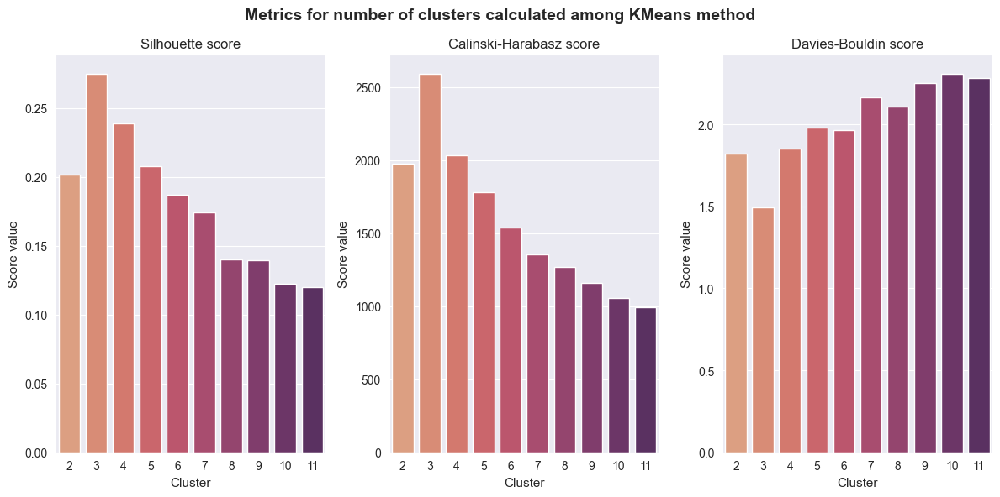

In [40]:
# Subplot for cluster details
sns.set_palette('Spectral')
fig = plt.figure(figsize = (12, 6))

ax1 = fig.add_subplot(131)
sns.barplot(data = clusters_df, x = 'Number of clusters', y = 'Silhouette score', ax = ax1, palette = 'flare')
ax1.set_xlabel('Cluster', fontsize = 11)
ax1.set_ylabel('Score value', fontsize = 11)
ax1.set_title('Silhouette score', fontsize = 12)

ax2 = fig.add_subplot(132)
sns.barplot(data = clusters_df, x = 'Number of clusters', y = 'Calinski-Harabasz score', 
            ax = ax2, palette = 'flare')
ax2.set_xlabel('Cluster', fontsize = 11)
ax2.set_ylabel('Score value', fontsize = 11)
ax2.set_title('Calinski-Harabasz score', fontsize = 12)

ax3 = fig.add_subplot(133)
sns.barplot(data = clusters_df, x = 'Number of clusters', y = 'Davies-Bouldin score', 
            ax = ax3, palette = 'flare')
ax3.set_xlabel('Cluster', fontsize = 11)
ax3.set_ylabel('Score value', fontsize = 11)
ax3.set_title('Davies-Bouldin score', fontsize = 12)

fig.suptitle('Metrics for number of clusters calculated among KMeans method', fontsize = 14, weight = 'bold')
plt.tight_layout()
plt.show()

<b>Silhouette analysis</b> can be used to study the separation distance between the resulting clusters. Coefficients near +1 indicate that the sample is far away from the neighboring clusters. A value of 0 indicates that the sample is on or very close to the decision boundary between two neighboring clusters and negative values indicate that those samples might have been assigned to the wrong cluster.

<b>Calinski and Harabasz score</b> is also known as the Variance Ratio Criterion. The score is defined as ratio of the sum of between-cluster dispersion and of within-cluster dispersion. In this case also higher result is better.

<b>Davies-Bouldin score</b> is defined as the average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances. Thus, clusters which are farther apart and less dispersed will result in a better score. The minimum score is zero, with lower values indicating better clustering.

As we can see on the bar charts - <b>'3'</b> is the most suitable number of clusters in our case, where it has the best values in each statistics. However, it is worth to mentioned that all of silhouette scores are really low, which can be an emerging signal - we should assume that the best score will be minimum around 0,7.

To be right we also use the elbow method to confirm our result.

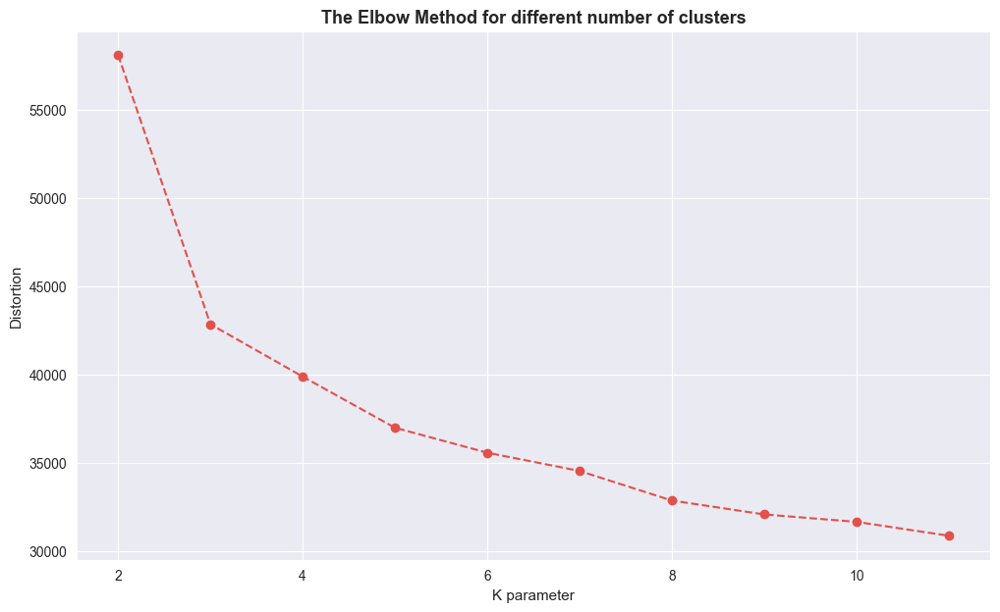

In [41]:
# Plot over ineertria for differen values of 'K'
sns.set_style('darkgrid')
plt.figure(figsize = (12, 7))

plt.plot(range(2, 12), distortions, marker = 'o', linestyle = 'dashed')

plt.xlabel('K parameter', fontsize = 11)
plt.ylabel('Distortion', fontsize = 11)
plt.title('The Elbow Method for different number of clusters', fontsize = 13, weight = 'bold')

plt.show()

From the graph and scoring results we can see that in our case the optimal parameter of <b>'K'</b> is <b>3</b> - here if we ran a linear function to cover as many points as possible, it would fit perfectly into points 3 through 10, which means that the above statistics are correct.

In [181]:
# K-Means cluster analysis
kmeans = KMeans(n_clusters = 3,  n_init = 'auto', random_state = 10)
kmeans.fit(telco_without_churn)

# Save cluster group as a column value in our data_frame
telco_customer_dummy['Cluster'] = kmeans.labels_

KMeans(n_clusters=3, n_init='auto', random_state=10)

In [64]:
# Creating temporary DataFrame to counts size of clusters
telco_temp = pd.DataFrame(telco_customer_dummy['Cluster'].value_counts())

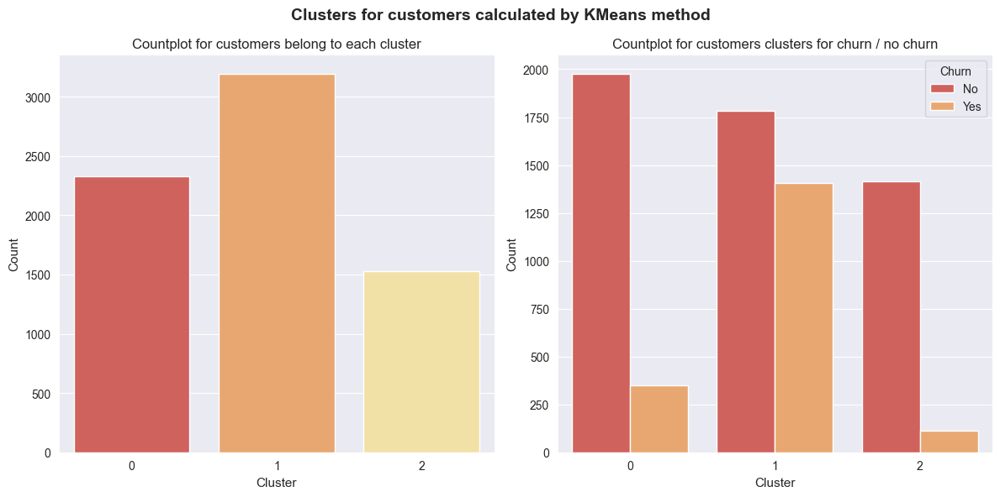

In [66]:
# Subplot for cluster details
sns.set_palette('Spectral')
fig = plt.figure(figsize = (12, 6))

ax1 = fig.add_subplot(121)
sns.barplot(data = telco_temp, x = telco_temp.index, y = 'Cluster', ax = ax1)
ax1.set_xlabel('Cluster', fontsize = 11)
ax1.set_ylabel('Count', fontsize = 11)
ax1.set_title('Countplot for customers belong to each cluster', fontsize = 12)

ax2 = fig.add_subplot(122)
sns.countplot(data = telco_customer_dummy, x = 'Cluster', hue = 'Churn', ax = ax2)
ax2.set_xlabel('Cluster', fontsize = 11)
ax2.set_ylabel('Count', fontsize = 11)
ax2.legend(['No', 'Yes'], title = 'Churn', loc = 'upper right')
ax2.set_title('Countplot for customers clusters for churn / no churn', fontsize = 12)

fig.suptitle('Clusters for customers calculated by KMeans method', fontsize = 14, weight = 'bold')
plt.tight_layout()
plt.show()

In [67]:
telco_customer_dummy.groupby('Cluster')['Churn'].value_counts(normalize = True)

Cluster  Churn
0        0        0.849892
         1        0.150108
1        0        0.559211
         1        0.440789
2        0        0.925950
         1        0.074050
Name: Churn, dtype: float64

It is clear to see that the algorithm assign the most of clients to cluster '1' and least to '0'. This group is the most willing to churn where the number of customers who wants to churn is similar to these which not want to (55% to 44%). In other cases ('0' and '2') significantly part of clients do not plan to quit services from Telco Company.

In [68]:
telco_customer_models['Cluster'] = telco_customer_dummy['Cluster']
telco_customer_models.head(1)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,Cluster
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,...,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No,1


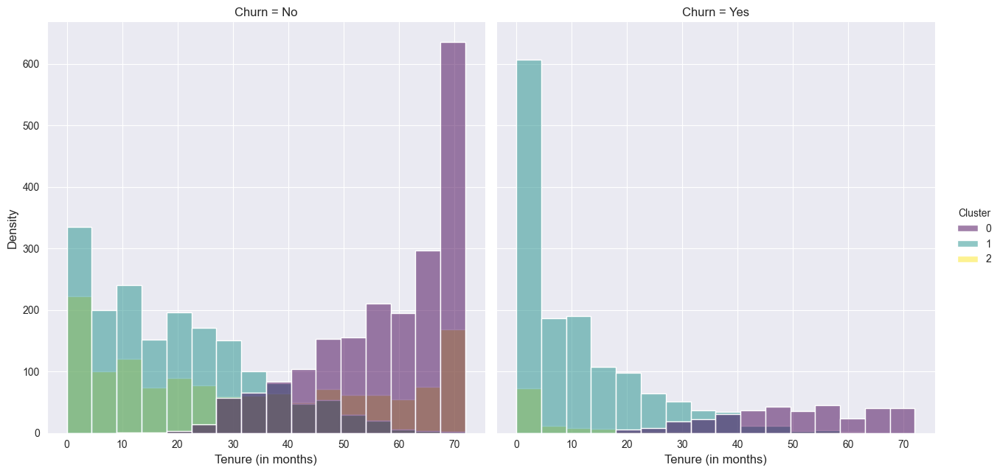

In [69]:
# KDE plots for each Payment Method
d = sns.displot(data = telco_customer_models, x = 'tenure', hue = 'Cluster', 
                col = 'Churn', col_wrap = 2, kind = 'hist', height = 6.5, palette = 'viridis')

d.set_axis_labels('Tenure (in months)', 'Density', fontsize = 12)
d.set_titles('Churn = {col_name}', size = 12)

plt.show()

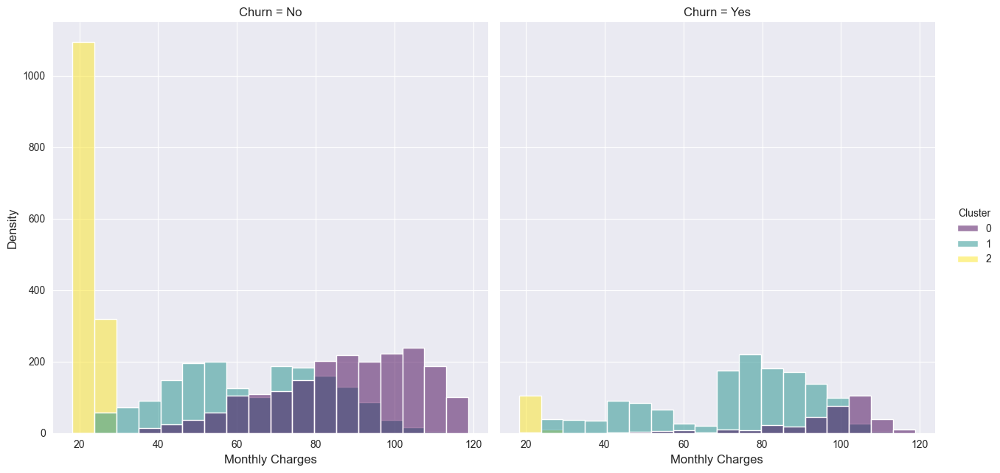

In [70]:
# KDE plots for each Monthly Charges
d = sns.displot(data = telco_customer_models, x = 'MonthlyCharges', hue = 'Cluster', 
                col = 'Churn', col_wrap = 2, kind = 'hist', height = 6.5, palette = 'viridis')

d.set_axis_labels('Monthly Charges', 'Density', fontsize = 12)
d.set_titles('Churn = {col_name}', size = 12)

plt.show()

In [71]:
# Mean of Monthly Charges by cluster
telco_customer.groupby(['Cluster', 'Churn'])[['MonthlyCharges', 'tenure']].mean()

MonthlyCharges     tenure
Cluster Churn                           
0       No          87.788993  58.222166
        Yes         96.747278  50.346705
1       No          63.669160  18.854902
        Yes         73.251208  10.732765
2       No          21.136058  32.331210
        Yes         20.368142   8.238938

In the case of tenure of the contract we can see that that there is a trend that clients which has shorter contract are assigned to group number '1' (and '2' for churned clients) when these with longer contracts are assgined to '0'. When we consider '1' and '0' the difference is huge - 40 months for no churned clients and 38 months for churned clients. In group '2' is a very width disproportion in this matter.

This applies to the situation among customers who do not intend to leave the company. On the other hand, in the case of those who decide to do so, it is clear that the largest percentage belongs to group 1, whose contract lengths are the shortest. However, also in the case of group 2, they are equally short. In group 0, they are by far the longest and most of them exceed 50 months.

In terms of monthly subscription and costs, group '2' has the lowest costs, both for churn and no churn. In groups '1' and '0', these fees are definitely higher - especially in group '0', where the average fee in both cases is above 87.

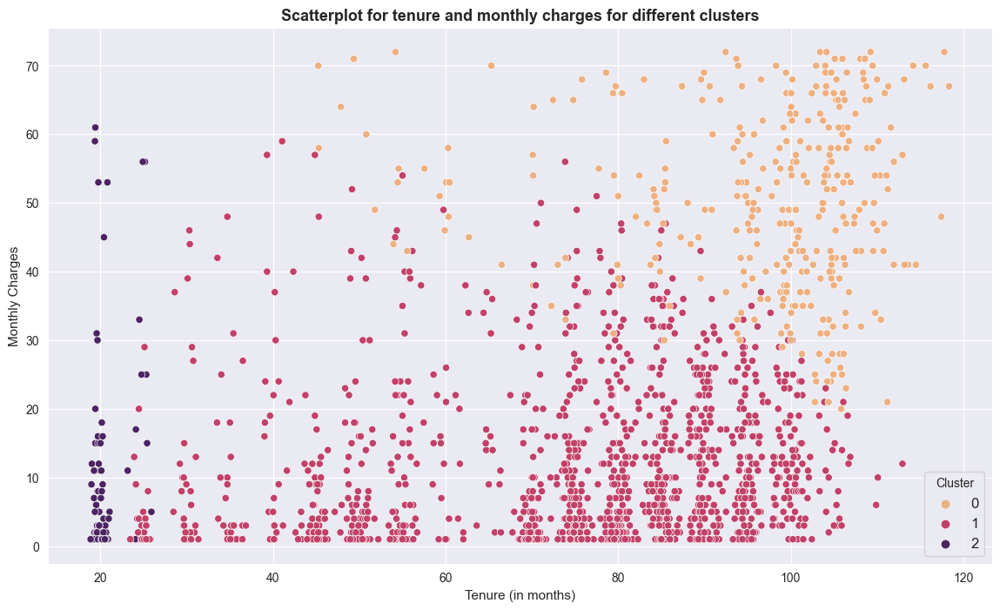

In [72]:
# Tenure vs Monthly Charges graph
sns.set_palette('flare')
plt.figure(figsize = (14, 8))

sns.scatterplot(x = 'MonthlyCharges', y = 'tenure', data = telco_customer_models[telco_customer_models['Churn'] == 'Yes'], 
                hue = 'Cluster', palette = 'flare')

plt.xlabel('Tenure (in months)', fontsize = 11)
plt.ylabel('Monthly Charges', fontsize = 11)
plt.title('Scatterplot for tenure and monthly charges for different clusters', fontsize = 13, weight = 'bold')

plt.legend(title = 'Cluster', loc = 'lower right', fontsize = 12)
plt.show()

As we wrote before, the group '2' can be seen on the left side with the lowest values of tenure. The group '1' extends across the entire width of the tenure (although the center of gravity is slightly shifted around 80 months). Most of the fees are below the 40 limit. On the other hand, users of the cluster '0' are the highest values of both fisheries considered here - most are classified in the upper right half of the chart.

In this graph clusters are really good seen and we can hypothetical lines which we could reasonably separate the three clusters.

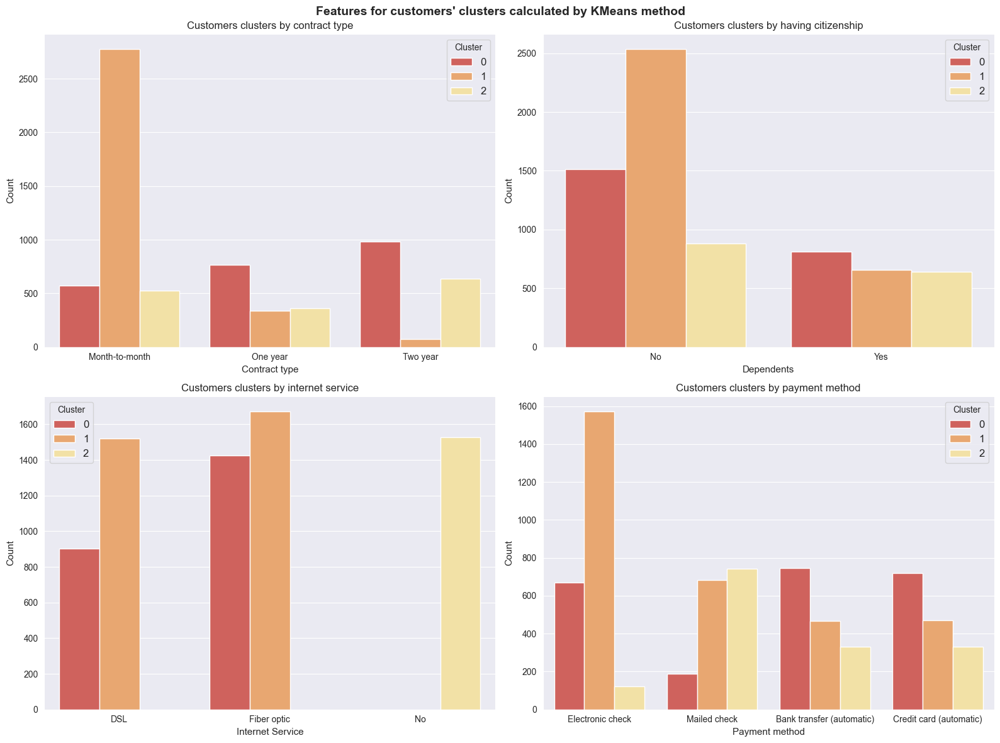

In [73]:
# Subplot for cluster details
sns.set_palette('Spectral')
fig = plt.figure(figsize = (16, 12))

ax1 = fig.add_subplot(221)
sns.countplot(data = telco_customer_models, x = 'Contract', hue = 'Cluster', ax = ax1)
ax1.set_xlabel('Contract type', fontsize = 11)
ax1.set_ylabel('Count', fontsize = 11)
ax1.set_title('Customers clusters by contract type', fontsize = 12)
ax1.legend(title = 'Cluster', fontsize = 12)

ax2 = fig.add_subplot(222)
sns.countplot(data = telco_customer_models, x = 'Dependents', hue = 'Cluster', ax = ax2)
ax2.set_xlabel('Dependents', fontsize = 11)
ax2.set_ylabel('Count', fontsize = 11)
ax2.legend(title = 'Cluster', fontsize = 12)
ax2.set_title('Customers clusters by having citizenship', fontsize = 12)

ax3 = fig.add_subplot(223)
sns.countplot(data = telco_customer_models, x = 'InternetService', hue = 'Cluster', ax = ax3)
ax3.set_xlabel('Internet Service', fontsize = 11)
ax3.set_ylabel('Count', fontsize = 11)
ax3.set_title('Customers clusters by internet service', fontsize = 12)
ax3.legend(title = 'Cluster', fontsize = 12)

ax4 = fig.add_subplot(224)
sns.countplot(data = telco_customer_models, x = 'PaymentMethod', hue = 'Cluster', ax = ax4)
ax4.set_xlabel('Payment method', fontsize = 11)
ax4.set_ylabel('Count', fontsize = 11)
ax4.legend(title = 'Cluster', fontsize = 12)
ax4.set_title('Customers clusters by payment method', fontsize = 12)

fig.suptitle('Features for customers\' clusters calculated by KMeans method', fontsize = 14, weight = 'bold')
plt.tight_layout()
plt.show()

In these charts, we have selected the most interesting features in terms of clustering. In the omitted examples, the division was mostly even and comparable to the data analysis carried out above.

In the case of the KMeans algorithm and contract type, the group '1' most often and with a clear advantage was assigned to the shortest type -> month-to-month, not even appearing in the two-year category. This is interesting because it closely overlaps with the short tenure for this group shown above. If we consider citizenship, we are dealing with a situation where the distribution in the absence is similar to the distribution of quantities in individual clusters, but when the customer has citizenship it is not so clear and the differences between clusters are smaller.

In the case of internet serviceg group '2' has exclusive option 'No' and only a few will appear with DSL. This choice is practiced by group '0' and '1'. When considering the Payment Method, it is worth noting that Bank Transfer and Credit Card are chosen equally often by all three groups. However, in the case of '0', the Mailed Check option is chosen by far the least often and we have a similar situation in the case of group '2' and Electronic Check compared to the others.

We also invesigate much deeper the churned clients by create a DataFrame for each cluster where we calculate the most frequent features for these type of customers. So we seperate them from others.

In [75]:
def Extract_highest_in_cluster(df_cal, df_cluster, feature, tenure_charges_cluster_df):
    """ For each features, compare cluster's value with overall value 
    and find out highest distributed features for that cluster  """
    
    df = df_cal.copy()
    feature_churn_dist = df[(df['Churn'] == 'Yes')][feature].value_counts(normalize = True).reset_index()
    feature_churn_dist.columns = [feature, 'Percentage']
    feature_cluster_dist = df_cluster[feature].value_counts(normalize = True).to_frame()
    feature_cluster_dist.columns = ['Percentage']
    feature_cluster_dist = feature_cluster_dist.reset_index()
    feature_cluster_dist_new = feature_cluster_dist.copy()
    
    tenure_MonthlyCharges_df = df_cal[df_cal['Churn'] == 'Yes'].groupby(['Cluster', feature], as_index = False)[['tenure','MonthlyCharges']].mean()
    
    for i, cluster in enumerate(feature_cluster_dist_new['Cluster'].unique()):
        for i, label in enumerate(feature_churn_dist[feature].unique()):
            cluster_val = feature_cluster_dist_new[(feature_cluster_dist_new['Cluster'] == cluster) 
                                                   & (feature_cluster_dist_new[feature]==label)]['Percentage']
            feature_val = feature_churn_dist[feature_churn_dist[feature] == label]['Percentage']
            
            if((len(feature_val.values) > 0) & (len(cluster_val.values) > 0)) :
                if((feature_val.values[0] < cluster_val.values[0])):
                    
                    tenure_charges_cluster_df = pd.concat([tenure_charges_cluster_df, pd.DataFrame({'Category':feature
                            , 'Label': ("Not have a "+ feature) if (df_cal[feature].dtypes == 'int64') & (label == 0) 
                                                                                               else (("Have a "+feature) 
                                                                                                     if (df_cal[feature].dtypes == 'int64') & (label == 1) else label)
                            , 'Percentage': cluster_val.values[0]
                            , 'Cluster' : cluster
                            , 'Avg_Tenure': round(tenure_MonthlyCharges_df[(tenure_MonthlyCharges_df['Cluster']==cluster) 
                                                                           & (tenure_MonthlyCharges_df[feature]==label) ]['tenure'].values[0],2)
                            , 'Avg_MonthlyCharges': round(tenure_MonthlyCharges_df[(tenure_MonthlyCharges_df['Cluster']==cluster) 
                                                                                   & (tenure_MonthlyCharges_df[feature]==label) ]['MonthlyCharges'].values[0],2)
                           }
                        , index = [len(tenure_charges_cluster_df)])
                                                          ])
                    
                    
                   
    return tenure_charges_cluster_df


In [76]:
# Churned clients
telco_cluster_gp = telco_customer[telco_customer['Churn'] == 'Yes'].groupby('Cluster')

In [77]:
tenure_charges_cluster_df = pd.DataFrame()

columns = ['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService', 
           'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 
           'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 
           'Contract', 'PaperlessBilling', 'PaymentMethod']

for feature in columns:
    tenure_charges_cluster_df = Extract_highest_in_cluster(telco_customer_models, telco_cluster_gp, feature, tenure_charges_cluster_df)

<b>Cluster 0 - High Tenure and High Monthly Charges</b>

In [78]:
tenure_charges_cluster_df[tenure_charges_cluster_df['Cluster'] == 0]

,Category,Label,Percentage,Cluster,Avg_Tenure,Avg_MonthlyCharges
0,gender,Male,0.544413,0,51.68,96.32
3,SeniorCitizen,Have a SeniorCitizen,0.320917,0,48.49,96.61
6,Partner,Yes,0.638968,0,51.45,95.92
9,Dependents,Yes,0.237822,0,50.78,94.51
12,PhoneService,Yes,0.959885,0,50.10,98.57
15,MultipleLines,Yes,0.825215,0,50.35,99.89
19,InternetService,Fiber optic,0.871060,0,49.98,101.07
23,OnlineSecurity,Yes,0.306590,0,52.81,97.37
26,OnlineBackup,Yes,0.621777,0,51.77,97.93
29,DeviceProtection,Yes,0.670487,0,50.00,98.34


Group '0' is dominated by men. It can be seen that we are dealing with a high percentage of Senior Citizens compared to the previous group. We also want to mention that most clients use Internet services and the Paperless Billings option.

<b>Cluster 1 - Low Tenure and High Monthly Charges</b>

In [79]:
tenure_charges_cluster_df[tenure_charges_cluster_df['Cluster'] == 1]

,Category,Label,Percentage,Cluster,Avg_Tenure,Avg_MonthlyCharges
1,gender,Female,0.514570,1,10.71,74.10
4,SeniorCitizen,Have a SeniorCitizen,0.255153,1,12.70,76.60
7,Partner,No,0.703625,1,9.27,72.39
10,Dependents,No,0.847193,1,10.45,73.59
13,PhoneService,No,0.110874,1,12.20,36.14
16,MultipleLines,No,0.496802,1,8.62,72.58
17,MultipleLines,No phone service,0.110874,1,12.20,36.14
20,InternetService,Fiber optic,0.705757,1,11.08,84.17
21,InternetService,DSL,0.294243,1,9.90,47.07
24,OnlineSecurity,No,0.866382,1,9.99,73.35


Group '1' is charackterized by low tenure - for most of features the mean is below 9. Here we are again dealing with a situation where the majority of clients assigned to this group do not have a partner or dependents, do not use Internet services, but despite high fees and tenure, they mostly choose month-to-month contracts.

<b>Cluster 2 - Low Tenure and High Monthly Charges</b>

In [80]:
tenure_charges_cluster_df[tenure_charges_cluster_df['Cluster'] == 2]

,Category,Label,Percentage,Cluster,Avg_Tenure,Avg_MonthlyCharges
2,gender,Male,0.504425,2,8.26,20.40
5,SeniorCitizen,Not have a SeniorCitizen,0.955752,2,8.42,20.39
8,Partner,No,0.743363,2,6.42,20.27
11,Dependents,Yes,0.247788,2,11.64,20.37
14,PhoneService,Yes,1.000000,2,8.24,20.37
18,MultipleLines,No,0.911504,2,6.67,19.95
22,InternetService,No,1.000000,2,8.24,20.37
25,OnlineSecurity,No internet service,1.000000,2,8.24,20.37
28,OnlineBackup,No internet service,1.000000,2,8.24,20.37
31,DeviceProtection,No internet service,1.000000,2,8.24,20.37


Churned clients from cluster '0' prefers two year contract significantly frequently. There are similar number of men and women, who mostly are single. We have an even gender distribution, they are mostly single and hardly use Internet services.

In [183]:
from sklearn.metrics import rand_score, homogeneity_score, completeness_score
rand = rand_score(telco_customer_dummy['Churn'], kmeans.labels_)
homo = homogeneity_score(telco_customer_dummy['Churn'], kmeans.labels_)
complete = completeness_score(telco_customer_dummy['Churn'], kmeans.labels_)

print('Clustering stats:')
print('--> Rand score        : {0}'.format(rand))
print('--> Homogeneity_score : {0}'.format(homo))
print('--> Completeness score: {0}'.format(complete))

Clustering stats:
--> Rand score        : 0.48013942672034166
--> Homogeneity_score : 0.12242708006122541
--> Completeness score: 0.06708541917639461


<a name = "5.2."><h3>5.2 Application of Agglomarative Propagation algorithm </h3> </a>

<b>Hierarchical clustering</b> is a general family of clustering algorithms that build nested clusters by merging or splitting them successively. This hierarchy of clusters is represented as a tree (or dendrogram). The root of the tree is the unique cluster that gathers all the samples, the leaves being the clusters with only one sample.

We use one of two types of Hierarchical Clustering - <b>Agglomerative Propagation</b> which is a bottom-up approach, in which the algorithm starts with taking all data points as single clusters and merging them until one cluster is left with <b>Average linkage</b> - it minimizes the average of the distances between all observations of pairs of clusters.

Due to the fact that our results from previous subsections may be questionable, beacuse of the fact that we use many dummies columns which are not the solution with using some clusterization methods, we decide to go with gover distance which is suggested method for case about working with categorical features.

In [82]:
# Importing gower module
import gower
distance_matrix = gower.gower_matrix(telco_without_churn)

In [83]:
distance_matrix

array([[0.        , 0.4235644 , 0.23154326, ..., 0.12944776, 0.28792214,
        0.6360843 ],
       [0.4235644 , 0.        , 0.19202116, ..., 0.34424105, 0.34432387,
        0.36251992],
       [0.23154326, 0.19202116, 0.        , ..., 0.2598448 , 0.2563789 ,
        0.45454106],
       ...,
       [0.12944776, 0.34424105, 0.2598448 , ..., 0.        , 0.3136898 ,
        0.55676097],
       [0.28792214, 0.34432387, 0.2563789 , ..., 0.3136898 , 0.        ,
        0.49816218],
       [0.6360843 , 0.36251992, 0.45454106, ..., 0.55676097, 0.49816218,
        0.        ]], dtype=float32)

In [84]:
# Agglomerative Clustering for different K
K = range(2, 10)

# List with distortions of the results of clustering
distortions, avg_ss, avg_ch, avg_db = [], [], [], []

# Loop over K to find the best parameter to the model
for i in range(2, 10):
    # K-Means cluster analysis
    agglo = AgglomerativeClustering(n_clusters = i, linkage = 'average')
    #agglo.fit(telco_customer_dummy)

    cluster_labels = agglo.fit_predict(distance_matrix)
    
    silhouette_avg = silhouette_score(distance_matrix, cluster_labels)
    avg_ss.append(silhouette_avg)
    calinski_harabasz = calinski_harabasz_score(distance_matrix, cluster_labels)
    avg_ch.append(calinski_harabasz)
    davies_bouldin = davies_bouldin_score(distance_matrix, cluster_labels)
    avg_db.append(davies_bouldin)
    
    # Printing a summary for every cluster
    print('\nFor n_clusters = {0}: \n--> average silhouette_score is: {1}'.
          format(i, silhouette_avg) +
         '\n--> average calinski_harabasz_score: {0}'.format(calinski_harabasz) +
         '\n--> average davies_bouldin_score: {0}'.format(davies_bouldin))



For n_clusters = 2: 
--> average silhouette_score is: 0.5714607834815979
--> average calinski_harabasz_score: 9772.426187912975
--> average davies_bouldin_score: 0.5669493805207608

For n_clusters = 3: 
--> average silhouette_score is: 0.37975192070007324
--> average calinski_harabasz_score: 8377.51281496561
--> average davies_bouldin_score: 1.0989319590119722

For n_clusters = 4: 
--> average silhouette_score is: 0.32506781816482544
--> average calinski_harabasz_score: 6084.088272877099
--> average davies_bouldin_score: 1.37790082294925

For n_clusters = 5: 
--> average silhouette_score is: 0.28334105014801025
--> average calinski_harabasz_score: 5479.313227194454
--> average davies_bouldin_score: 1.5849485117247215

For n_clusters = 6: 
--> average silhouette_score is: 0.26839667558670044
--> average calinski_harabasz_score: 4477.87489273416
--> average davies_bouldin_score: 1.6661176958200794

For n_clusters = 7: 
--> average silhouette_score is: 0.25525718927383423
--> average cal

In [85]:
# Creating DtaFrame for quick graphical summary
clusters_df = pd.DataFrame()

clusters_df['Number of clusters'] = range(2, 10)
clusters_df['Silhouette score'] = avg_ss
clusters_df['Calinski-Harabasz score'] = avg_ch
clusters_df['Davies-Bouldin score'] = avg_db

clusters_df

,Number of clusters,Silhouette score,Calinski-Harabasz score,Davies-Bouldin score
0,2,0.571461,9772.426188,0.566949
1,3,0.379752,8377.512815,1.098932
2,4,0.325068,6084.088273,1.377901
3,5,0.283341,5479.313227,1.584949
4,6,0.268397,4477.874893,1.666118
5,7,0.255257,3820.772313,1.651975
6,8,0.244598,3656.030853,1.701518
7,9,0.243124,3378.225758,1.826531


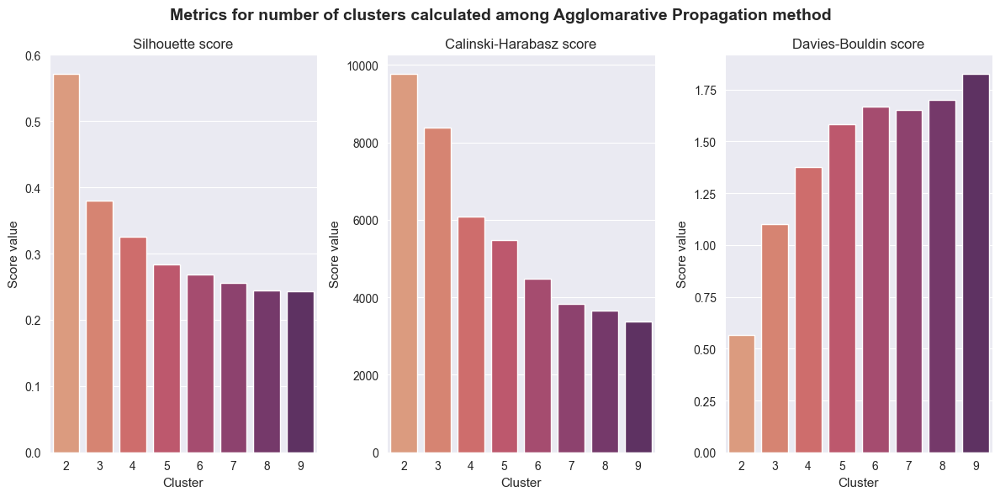

In [87]:
# Subplot for cluster details
sns.set_palette('Spectral')
fig = plt.figure(figsize = (12, 6))

ax1 = fig.add_subplot(131)
sns.barplot(data = clusters_df, x = 'Number of clusters', y = 'Silhouette score', ax = ax1, palette = 'flare')
ax1.set_xlabel('Cluster', fontsize = 11)
ax1.set_ylabel('Score value', fontsize = 11)
ax1.set_title('Silhouette score', fontsize = 12)

ax2 = fig.add_subplot(132)
sns.barplot(data = clusters_df, x = 'Number of clusters', y = 'Calinski-Harabasz score', 
            ax = ax2, palette = 'flare')
ax2.set_xlabel('Cluster', fontsize = 11)
ax2.set_ylabel('Score value', fontsize = 11)
ax2.set_title('Calinski-Harabasz score', fontsize = 12)

ax3 = fig.add_subplot(133)
sns.barplot(data = clusters_df, x = 'Number of clusters', y = 'Davies-Bouldin score', 
            ax = ax3, palette = 'flare')
ax3.set_xlabel('Cluster', fontsize = 11)
ax3.set_ylabel('Score value', fontsize = 11)
ax3.set_title('Davies-Bouldin score', fontsize = 12)

fig.suptitle('Metrics for number of clusters calculated among Agglomarative Propagation method', fontsize = 14, weight = 'bold')
plt.tight_layout()
plt.show()

After looking at the metrics which describes our dataset, we can consider <b>2</b> clusters, because it performed significantly better in every aspect. To be right in this formula, we also draw a dendogram below.

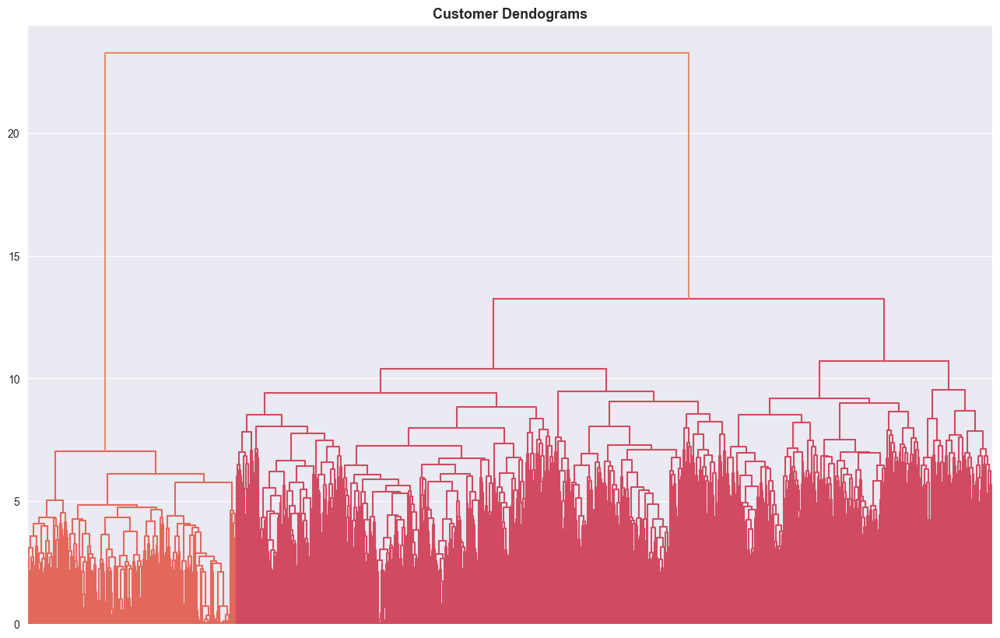

In [108]:
# Create dendogram to find correct number of clusters
sns.set_palette('flare')
import scipy.cluster.hierarchy as shc

plt.figure(figsize = (16, 10))

dend = shc.dendrogram(shc.linkage(distance_matrix, method = 'average'), no_labels = True)
plt.title('Customer Dendograms', fontsize = 13, weight = 'bold')

plt.show()

Looking for a dendogram helps us to confirm our earlier supposition that we should be working with <b>2</b> different clusters, because in our opinion cutting the dendogram in this moment should be optimal.

In [109]:
# Aglomaritve cluster analysis
agglo = AgglomerativeClustering(n_clusters = 2, linkage = 'average')
agglo.fit(distance_matrix)

# Save cluster group as a column value in our data_frame
telco_customer_dummy['Cluster'] = agglo.labels_

In [110]:
# Creating temporary DataFrame to counts size of clusters
telco_temp = pd.DataFrame(telco_customer_dummy['Cluster'].value_counts())

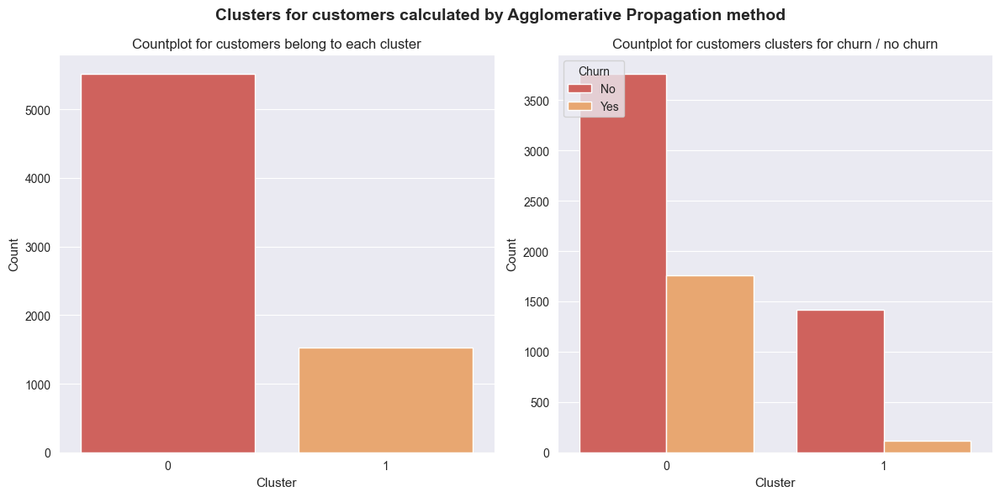

In [111]:
# Subplot for cluster details
sns.set_palette('Spectral')
fig = plt.figure(figsize = (12, 6))

ax1 = fig.add_subplot(121)
sns.barplot(data = telco_temp, x = telco_temp.index, y = 'Cluster', ax = ax1)
ax1.set_xlabel('Cluster', fontsize = 11)
ax1.set_ylabel('Count', fontsize = 11)
ax1.set_title('Countplot for customers belong to each cluster', fontsize = 12)

ax2 = fig.add_subplot(122)
sns.countplot(data = telco_customer_dummy, x = 'Cluster', hue = 'Churn', ax = ax2)
ax2.set_xlabel('Cluster', fontsize = 11)
ax2.set_ylabel('Count', fontsize = 11)
ax2.legend(['No', 'Yes'], title = 'Churn', loc = 'upper left')
ax2.set_title('Countplot for customers clusters for churn / no churn', fontsize = 12)

fig.suptitle('Clusters for customers calculated by Agglomerative Propagation method', fontsize = 14, weight = 'bold')
plt.tight_layout()
plt.show()

In the case of Affirmation Propagation, there are one cluster less than in K-Means. 
In this situation we have a visible difference in number of clients belonging to each cluster and fact that in '0' higher percentage of them decide to churn.

In [112]:
telco_customer_models['Cluster'] = telco_customer_dummy['Cluster']
telco_customer_models.head(1)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,Cluster
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,...,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No,0


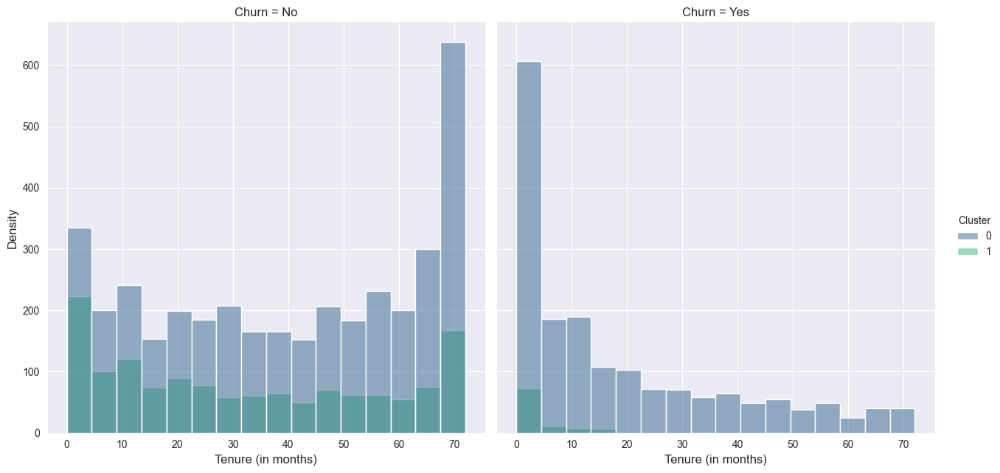

In [113]:
# KDE plots for each Payment Method
d = sns.displot(data = telco_customer_models, x = 'tenure', hue = 'Cluster', 
                col = 'Churn', col_wrap = 2, kind = 'hist', height = 6.5, palette = 'viridis')

d.set_axis_labels('Tenure (in months)', 'Density', fontsize = 12)
d.set_titles('Churn = {col_name}', size = 12)

plt.show()

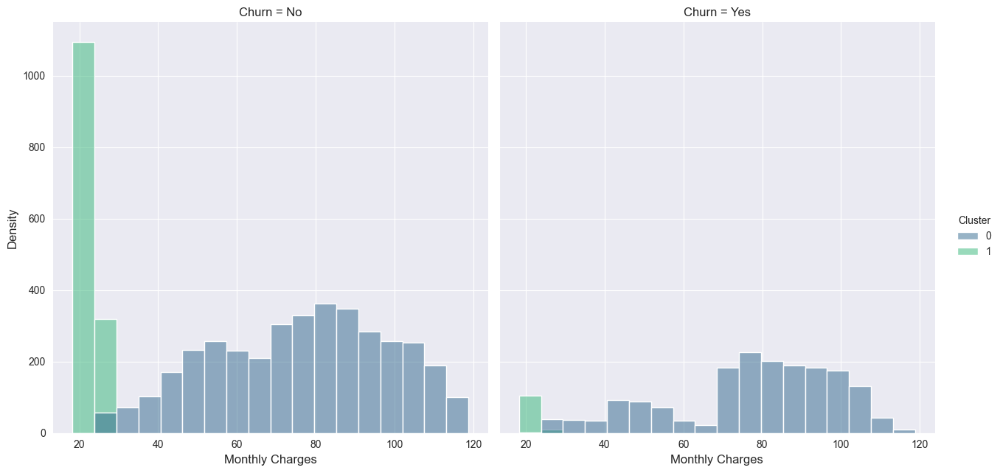

In [114]:
# KDE plots for each Monthly Charges
d = sns.displot(data = telco_customer_models, x = 'MonthlyCharges', hue = 'Cluster', 
                col = 'Churn', col_wrap = 2, kind = 'hist', height = 6.5, palette = 'viridis')

d.set_axis_labels('Monthly Charges', 'Density', fontsize = 12)
d.set_titles('Churn = {col_name}', size = 12)

plt.show()

In [115]:
# Mean of Monthly Charges by cluster
telco_customer.groupby(['Cluster', 'Churn'])[['MonthlyCharges', 'tenure']].mean()

MonthlyCharges     tenure
Cluster Churn                           
0       No          76.341532  39.538155
        Yes         77.920985  18.605923
1       No          21.136058  32.331210
        Yes         20.368142   8.238938

From the graphs and from the table we can see that group '1' include people with shorter tenure and a significantly less monthly charges - this effect is visible so much that we can predict that clusterization concentrated mostly on monthly charges. Mean difference between churn and no churn is around 1, so very close to each others. 

But in both clusters there is a situatuon when people who decide to churn has 2 times in '0' and 4 times in '1' less tenure than the loyal clients. We can see this exactly on histograms of tenure - for churned customers values in '1' are only on the very few first months.

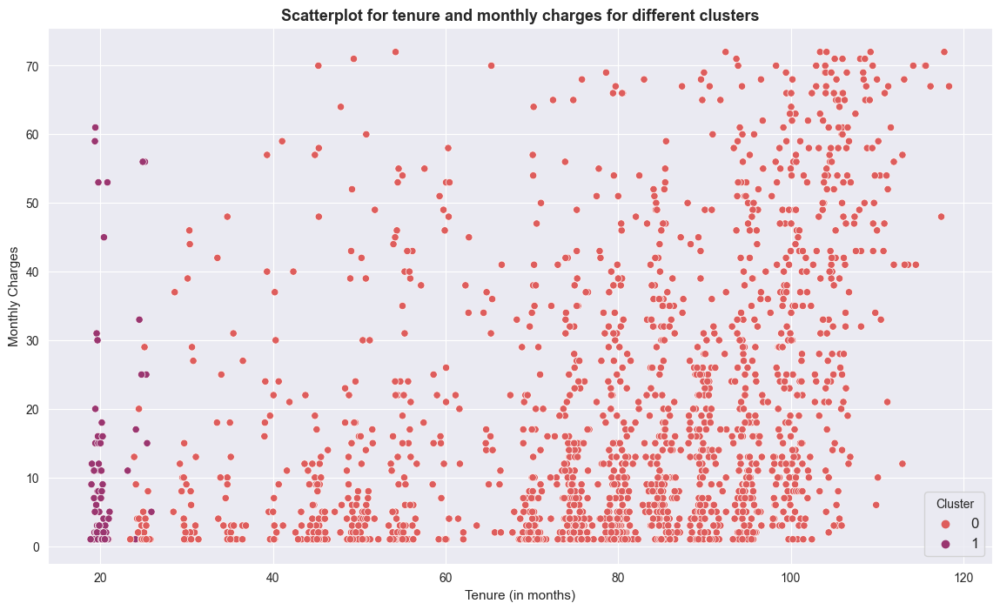

In [116]:
# Tenure vs Monthly Charges graph
sns.set_palette('flare')
plt.figure(figsize = (14, 8))

sns.scatterplot(x = 'MonthlyCharges', y = 'tenure', data = telco_customer_models[telco_customer_models['Churn'] == 'Yes'], 
                hue = 'Cluster', palette = 'flare')

plt.xlabel('Tenure (in months)', fontsize = 11)
plt.ylabel('Monthly Charges', fontsize = 11)
plt.title('Scatterplot for tenure and monthly charges for different clusters', fontsize = 13, weight = 'bold')

plt.legend(title = 'Cluster', loc = 'lower right', fontsize = 12)
plt.show()

Again, on this type of graph we can clearly draw a line which seperates both groups. Tenure in cluster '0' are among width of the graph, when in '1' concentrate among the shortest values. Most of customers in '0' are located in the right side of the chart, but the range of monthly charges are among all graph.

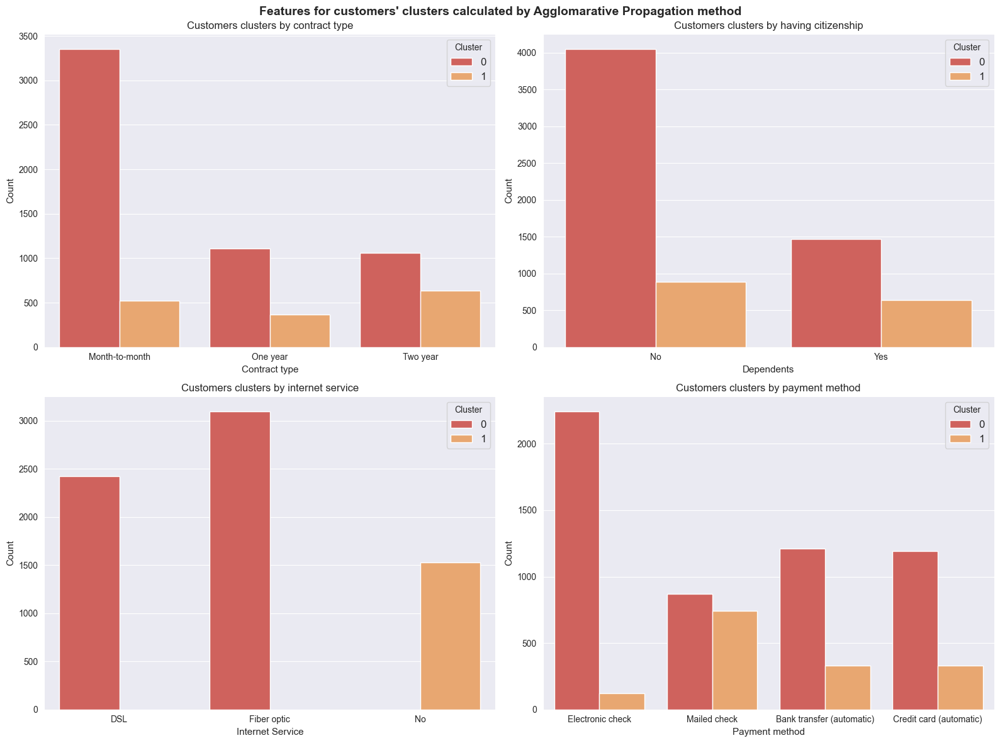

In [118]:
# Subplot for cluster details
sns.set_palette('Spectral')
fig = plt.figure(figsize = (16, 12))

ax1 = fig.add_subplot(221)
sns.countplot(data = telco_customer_models, x = 'Contract', hue = 'Cluster', ax = ax1)
ax1.set_xlabel('Contract type', fontsize = 11)
ax1.set_ylabel('Count', fontsize = 11)
ax1.set_title('Customers clusters by contract type', fontsize = 12)
ax1.legend(title = 'Cluster', fontsize = 12)

ax2 = fig.add_subplot(222)
sns.countplot(data = telco_customer_models, x = 'Dependents', hue = 'Cluster', ax = ax2)
ax2.set_xlabel('Dependents', fontsize = 11)
ax2.set_ylabel('Count', fontsize = 11)
ax2.legend(title = 'Cluster', fontsize = 12)
ax2.set_title('Customers clusters by having citizenship', fontsize = 12)

ax3 = fig.add_subplot(223)
sns.countplot(data = telco_customer_models, x = 'InternetService', hue = 'Cluster', ax = ax3)
ax3.set_xlabel('Internet Service', fontsize = 11)
ax3.set_ylabel('Count', fontsize = 11)
ax3.set_title('Customers clusters by internet service', fontsize = 12)
ax3.legend(title = 'Cluster', fontsize = 12)

ax4 = fig.add_subplot(224)
sns.countplot(data = telco_customer_models, x = 'PaymentMethod', hue = 'Cluster', ax = ax4)
ax4.set_xlabel('Payment method', fontsize = 11)
ax4.set_ylabel('Count', fontsize = 11)
ax4.legend(title = 'Cluster', fontsize = 12)
ax4.set_title('Customers clusters by payment method', fontsize = 12)

fig.suptitle('Features for customers\' clusters calculated by Agglomarative Propagation method', fontsize = 14, weight = 'bold')
plt.tight_layout()
plt.show()

Customers belonging to the '0' cluster definitely more often choose Month-to-Month contracts - among other proposals. The disparity on this issue remains very clear. For one-year and two-year contracts there are smilar number of customers belonging to both groups. In case of senior citizenship, in cluster '1' there are a high percentage in comaprison to our others clustering algorithms.

People from cluster '0' always use Internet Services, mostly the Fabric optic, when them from cluster '1' always opt to resign from this kind of services. 

When we look at Payment Method in cluster '0' customers decide to use equal Bank Transfer and Credit Card, but the leader is Eletronic check. However, in cluster '1' around a half decide to use Mailed check.

In [119]:
# Churned clients
telco_cluster_gp = telco_customer[telco_customer['Churn'] == 'Yes'].groupby('Cluster')

In [120]:
tenure_charges_cluster_df = pd.DataFrame()

columns = ['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService', 
           'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 
           'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 
           'Contract', 'PaperlessBilling', 'PaymentMethod']

for feature in columns:
    tenure_charges_cluster_df = Extract_highest_in_cluster(telco_customer_models, telco_cluster_gp, feature, tenure_charges_cluster_df)

<b>Cluster 0 - Low Tenure and High Monthly Charges</b>

In [121]:
tenure_charges_cluster_df[tenure_charges_cluster_df['Cluster'] == 0]

,Category,Label,Percentage,Cluster,Avg_Tenure,Avg_MonthlyCharges
0,gender,Female,0.502847,0,17.56,78.27
2,SeniorCitizen,Have a SeniorCitizen,0.268223,0,21.21,81.36
4,Partner,Yes,0.364465,0,27.19,82.49
6,Dependents,No,0.830296,0,17.71,77.95
8,PhoneService,No,0.096811,0,15.84,37.53
10,MultipleLines,Yes,0.478360,0,25.80,89.84
11,MultipleLines,No phone service,0.096811,0,15.84,37.53
13,InternetService,Fiber optic,0.738610,0,20.20,88.13
14,InternetService,DSL,0.261390,0,14.11,49.08
16,OnlineSecurity,No,0.832005,0,16.50,77.18


In this category monthly charges are really high - almost in each part at average it is above 65. Customers from cluster '0' are without dependents, but aabove 1/3 of them have a partner. They decide to sign month-to-month contracts and like to use Streaming TV and Movies (~ 46% of them buy this services).

<b>Cluster '1' - Low Tenure and Low Monthly Charges</b>

In [122]:
tenure_charges_cluster_df[tenure_charges_cluster_df['Cluster'] == 1]

,Category,Label,Percentage,Cluster,Avg_Tenure,Avg_MonthlyCharges
1,gender,Male,0.504425,1,8.26,20.40
3,SeniorCitizen,Not have a SeniorCitizen,0.955752,1,8.42,20.39
5,Partner,No,0.743363,1,6.42,20.27
7,Dependents,Yes,0.247788,1,11.64,20.37
9,PhoneService,Yes,1.000000,1,8.24,20.37
12,MultipleLines,No,0.911504,1,6.67,19.95
15,InternetService,No,1.000000,1,8.24,20.37
18,OnlineSecurity,No internet service,1.000000,1,8.24,20.37
21,OnlineBackup,No internet service,1.000000,1,8.24,20.37
24,DeviceProtection,No internet service,1.000000,1,8.24,20.37


People who churn from group '1' is a much less seniors and almost 10% less people has a partner. They decide to not use any of the internet services and mutliple lines, but they like to opt in phone services.

In [128]:
#rand_score, homogeneity_score, completeness_score
rand = rand_score(telco_customer_dummy['Churn'], agglo.labels_)
homo = homogeneity_score(telco_customer_dummy['Churn'], agglo.labels_)
complete = completeness_score(telco_customer_dummy['Churn'], agglo.labels_)

print('Clustering stats:')
print('--> Rand score        : {0}'.format(rand))
print('--> Homogeneity_score : {0}'.format(homo))
print('--> Completeness score: {0}'.format(complete))

Clustering stats:
--> Rand score        : 0.504939652767156
--> Homogeneity_score : 0.054216705317880094
--> Completeness score: 0.060019430769022566


Even we are using now gower distance on our dataset it performed not really good. All the scores we introduced earlier have a little bit better results, but they can be satisfied in 100%.

<a name = "5.3."><h3>5.3 Application of K-Medoids algorithm </h3> </a>

In contrast to the K-Means algorithm, <b>K-Medoids</b> chooses actual data points as centers (medoids or exemplars), and thereby allows for greater interpretability of the cluster centers than in K-Means, where the center of a cluster is not necessarily one of the input data points. Furthermore, k-medoids can be used with arbitrary dissimilarity measures, whereas K-Means generally requires Euclidean distance for efficient solutions.

K-medoids is a classical partitioning technique of clustering that splits the data set of n objects into k clusters. One of the version of K-Medoids is PAM (Partitioning Around Medoids) which can be implemented in Python from kmedoids module.

In [190]:
# K-Medoids for different K
import kmedoids

K = range(2, 6)

# List with distortions of the results of clustering
distortions, avg_ss, avg_ch, avg_db = [], [], [], []

# Loop over K to find the best parameter to the model
for i in range(2, 8):
    # K-Means cluster analysis
    fuzzy = kmedoids.KMedoids(n_clusters = i, random_state = 42, method = 'pam')
    fuzzy.fit(distance_matrix)

    cluster_labels = fuzzy.labels_
    
    silhouette_avg = silhouette_score(distance_matrix, cluster_labels)
    avg_ss.append(silhouette_avg)
    calinski_harabasz = calinski_harabasz_score(distance_matrix, cluster_labels)
    avg_ch.append(calinski_harabasz)
    davies_bouldin = davies_bouldin_score(distance_matrix, cluster_labels)
    avg_db.append(davies_bouldin)
    
    # Printing a summary for every cluster
    print('\nFor n_clusters = {0}: \n--> average silhouette_score is: {1}'.
          format(i, silhouette_avg) +
         '\n--> average calinski_harabasz_score: {0}'.format(calinski_harabasz) +
         '\n--> average davies_bouldin_score: {0}'.format(davies_bouldin))


For n_clusters = 2: 
--> average silhouette_score is: 0.486103892326355
--> average calinski_harabasz_score: 6853.115945953733
--> average davies_bouldin_score: 0.8441724847585632

For n_clusters = 3: 
--> average silhouette_score is: 0.336259663105011
--> average calinski_harabasz_score: 7505.92615336336
--> average davies_bouldin_score: 1.2822772217853682

For n_clusters = 4: 
--> average silhouette_score is: 0.30974438786506653
--> average calinski_harabasz_score: 6714.57690971349
--> average davies_bouldin_score: 1.377298517629544

For n_clusters = 5: 
--> average silhouette_score is: 0.2733787000179291
--> average calinski_harabasz_score: 5584.018842446599
--> average davies_bouldin_score: 1.5680278299183503

For n_clusters = 6: 
--> average silhouette_score is: 0.16653142869472504
--> average calinski_harabasz_score: 4680.225116370413
--> average davies_bouldin_score: 1.7647960761302937

For n_clusters = 7: 
--> average silhouette_score is: 0.13854588568210602
--> average calins

In [142]:
# Creating DtaFrame for quick graphical summary
clusters_df = pd.DataFrame()

clusters_df['Number of clusters'] = range(2, 8)
clusters_df['Silhouette score'] = avg_ss
clusters_df['Calinski-Harabasz score'] = avg_ch
clusters_df['Davies-Bouldin score'] = avg_db

clusters_df

,Number of clusters,Silhouette score,Calinski-Harabasz score,Davies-Bouldin score
0,2,0.486104,6853.115946,0.844172
1,3,0.382444,8514.476586,1.089355
2,4,0.309744,6714.576910,1.377299
3,5,0.274796,5598.158394,1.558986
4,6,0.255663,4649.436834,1.824339
5,7,0.145972,4039.198817,1.965605


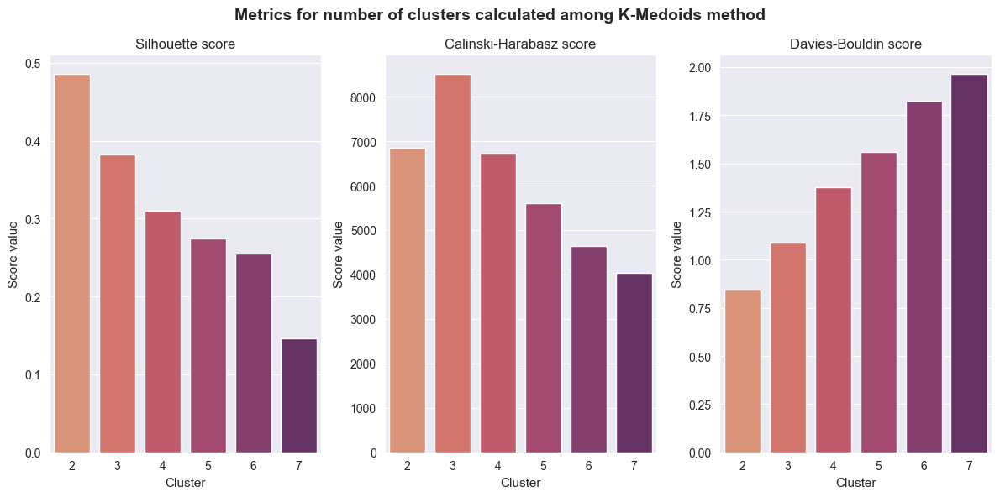

In [191]:
# Subplot for cluster details
sns.set_palette('Spectral')
fig = plt.figure(figsize = (12, 6))

ax1 = fig.add_subplot(131)
sns.barplot(data = clusters_df, x = 'Number of clusters', y = 'Silhouette score', ax = ax1, palette = 'flare')
ax1.set_xlabel('Cluster', fontsize = 11)
ax1.set_ylabel('Score value', fontsize = 11)
ax1.set_title('Silhouette score', fontsize = 12)

ax2 = fig.add_subplot(132)
sns.barplot(data = clusters_df, x = 'Number of clusters', y = 'Calinski-Harabasz score', 
            ax = ax2, palette = 'flare')
ax2.set_xlabel('Cluster', fontsize = 11)
ax2.set_ylabel('Score value', fontsize = 11)
ax2.set_title('Calinski-Harabasz score', fontsize = 12)

ax3 = fig.add_subplot(133)
sns.barplot(data = clusters_df, x = 'Number of clusters', y = 'Davies-Bouldin score', 
            ax = ax3, palette = 'flare')
ax3.set_xlabel('Cluster', fontsize = 11)
ax3.set_ylabel('Score value', fontsize = 11)
ax3.set_title('Davies-Bouldin score', fontsize = 12)

fig.suptitle('Metrics for number of clusters calculated among K-Medoids method', fontsize = 14, weight = 'bold')
plt.tight_layout()
plt.show()

From this graphs it is visible that we can choose between <b>2</b> and <b>3</b> clusters, becuase they are perfomed similar and better than others. In our considerations, we will use <b>3</b> clusters.

In [182]:
# Fuzzy Clustering cluster analysis
kmed = kmedoids.KMedoids(n_clusters = 3, random_state = 42, method = 'pam')
kmed.fit(distance_matrix)
cluster_labels = kmed.predict(distance_matrix)

# Save cluster group as a column value in our data_frame
telco_customer_dummy['Cluster'] = cluster_labels

In [183]:
# Creating temporary DataFrame to counts size of clusters
telco_temp = pd.DataFrame(telco_customer_dummy['Cluster'].value_counts())

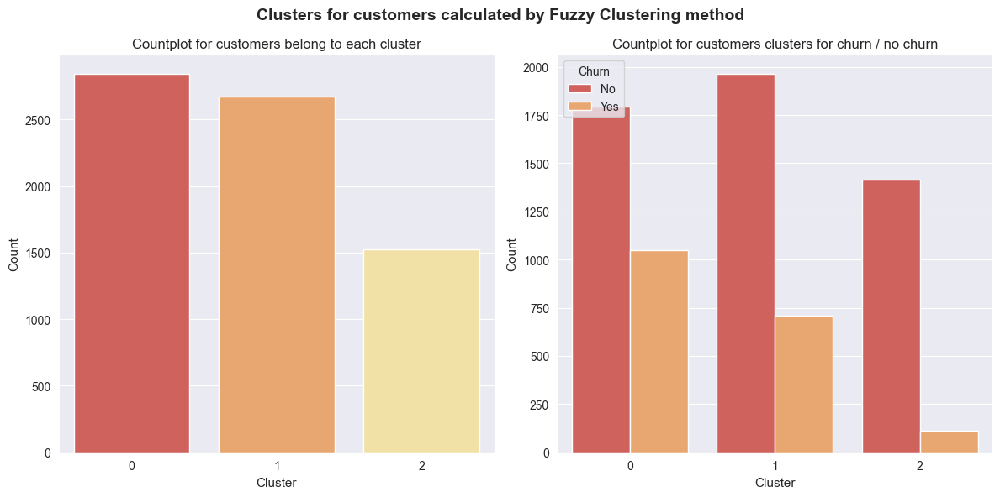

In [184]:
# Subplot for cluster details
sns.set_palette('Spectral')
fig = plt.figure(figsize = (12, 6))

ax1 = fig.add_subplot(121)
sns.barplot(data = telco_temp, x = telco_temp.index, y = 'Cluster', ax = ax1)
ax1.set_xlabel('Cluster', fontsize = 11)
ax1.set_ylabel('Count', fontsize = 11)
ax1.set_title('Countplot for customers belong to each cluster', fontsize = 12)

ax2 = fig.add_subplot(122)
sns.countplot(data = telco_customer_dummy, x = 'Cluster', hue = 'Churn', ax = ax2)
ax2.set_xlabel('Cluster', fontsize = 11)
ax2.set_ylabel('Count', fontsize = 11)
ax2.legend(['No', 'Yes'], title = 'Churn', loc = 'upper left')
ax2.set_title('Countplot for customers clusters for churn / no churn', fontsize = 12)

fig.suptitle('Clusters for customers calculated by Fuzzy Clustering method', fontsize = 14, weight = 'bold')
plt.tight_layout()
plt.show()

In [195]:
telco_customer_dummy.groupby('Cluster')['Churn'].value_counts(normalize = True)

Cluster  Churn
0        0        0.631727
         1        0.368273
1        0        0.734755
         1        0.265245
2        0        0.925999
         1        0.074001
Name: Churn, dtype: float64

It is clear to see that the algorithm assign the most of clients to cluster '1' and least to '2', but the difference between '0' and '1' is not big - that is the first time in the testing of clustering methods. 

The biggest group is more likely to churn where the number of customers who leaves Telco is about 37%, but also for '1' above 26% resigns from the company services. The group '2' is the loyal one as 92% of customers decide to stay.

In [201]:
telco_customer_models['Cluster'] = telco_customer_dummy['Cluster']
telco_customer_models['Churn'][telco_customer_dummy['Churn'] == 0] = 'No'
telco_customer_models['Churn'][telco_customer_dummy['Churn'] == 1] = 'Yes'
telco_customer_models.head(1)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,Cluster
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,...,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No,0


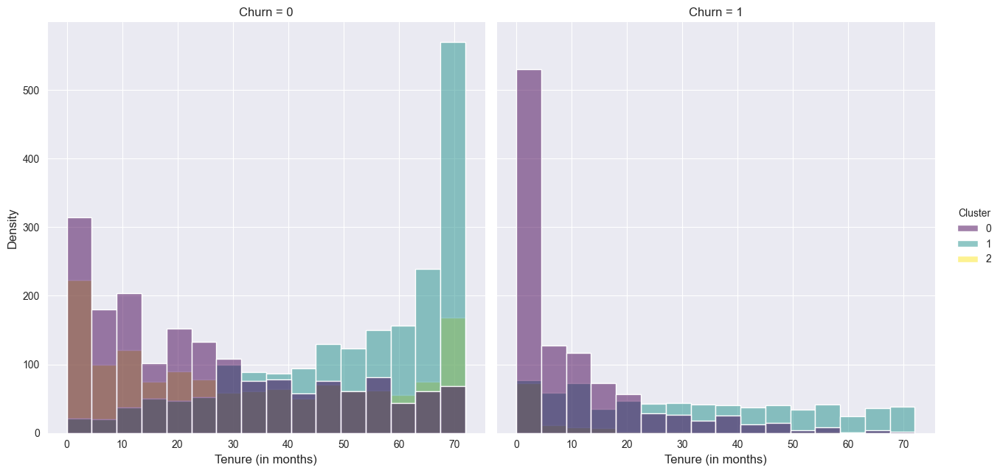

In [197]:
# KDE plots for each Payment Method
d = sns.displot(data = telco_customer_models, x = 'tenure', hue = 'Cluster', 
                col = 'Churn', col_wrap = 2, kind = 'hist', height = 6.5, palette = 'viridis')

d.set_axis_labels('Tenure (in months)', 'Density', fontsize = 12)
d.set_titles('Churn = {col_name}', size = 12)

plt.show()

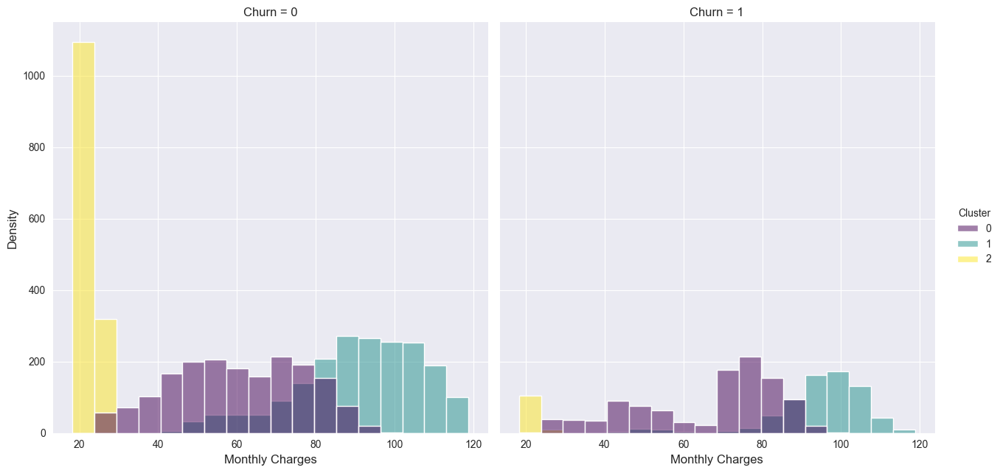

In [188]:
# KDE plots for each Monthly Charges
d = sns.displot(data = telco_customer_models, x = 'MonthlyCharges', hue = 'Cluster', 
                col = 'Churn', col_wrap = 2, kind = 'hist', height = 6.5, palette = 'viridis')

d.set_axis_labels('Monthly Charges', 'Density', fontsize = 12)
d.set_titles('Churn = {col_name}', size = 12)

plt.show()

In [189]:
# Mean of Monthly Charges by cluster
telco_customer.groupby(['Cluster', 'Churn'])[['MonthlyCharges', 'tenure']].mean()

MonthlyCharges     tenure
Cluster Churn                           
0       0           60.292400  25.425947
        1           66.288968  10.145177
1       0           91.028768  52.455193
        1           95.098307  31.100141
2       0           21.159901  32.319661
        1           20.368142   8.238938

We can observed an intryguing thing - results from K-Medoids method in some reasons are similar to the previous one - Hierarchical Clustering. The groups are seperated by Monthly Charges, for '0' is about 60-66, for '1' about 91-95 and for '2' about 20-21. But churn state is dependent on Tenure and for each group for churned clients it is significantly shorter than for the loyal. The difference is huge - 15 months for '0', 21 months for '1' and 24 months for '2'.

However, it is worth emphasizing that in the case of tenure, all groups have a similar discrepancy across the Tenure width of the histogram value, which is not the case with Monthly Charges.

In [193]:
telco_customer_models['Cluster'] = telco_customer_dummy['Cluster']
telco_customer_models.head(1)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,Cluster
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,...,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,0,0


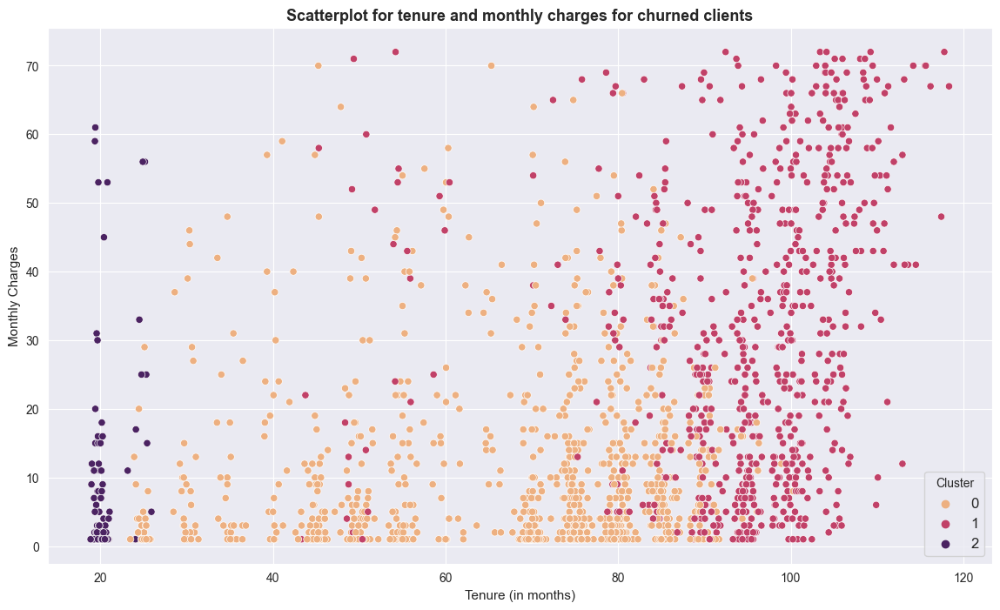

In [203]:
# Tenure vs Monthly Charges graph
sns.set_palette('flare')
plt.figure(figsize = (14, 8))

sns.scatterplot(x = 'MonthlyCharges', y = 'tenure', data = telco_customer_models[telco_customer_models['Churn'] == 'Yes'], 
                hue = 'Cluster', palette = 'flare')

plt.xlabel('Tenure (in months)', fontsize = 11)
plt.ylabel('Monthly Charges', fontsize = 11)
plt.title('Scatterplot for tenure and monthly charges for churned clients', fontsize = 13, weight = 'bold')

plt.legend(title = 'Cluster', loc = 'lower right', fontsize = 12)
plt.show()

From the graph we can see that cluster two is located mainly in the left bottom corner, which means that churned clients from these group are paying the lowest monthly bills and have the shortest tenure. Clusters '1' and '2' are mixing a little bit together, but the difference between their points is visible.

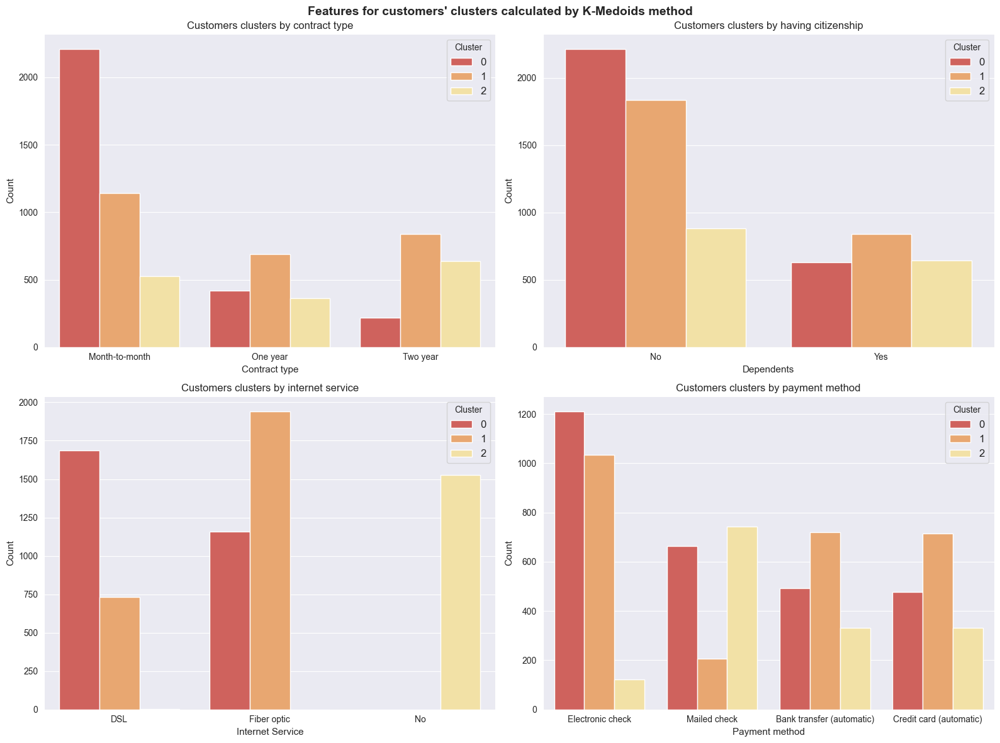

In [219]:
# Subplot for cluster details
sns.set_palette('Spectral')
fig = plt.figure(figsize = (16, 12))

ax1 = fig.add_subplot(221)
sns.countplot(data = telco_customer_models, x = 'Contract', hue = 'Cluster', ax = ax1)
ax1.set_xlabel('Contract type', fontsize = 11)
ax1.set_ylabel('Count', fontsize = 11)
ax1.set_title('Customers clusters by contract type', fontsize = 12)
ax1.legend(title = 'Cluster', fontsize = 12)

ax2 = fig.add_subplot(222)
sns.countplot(data = telco_customer_models, x = 'Dependents', hue = 'Cluster', ax = ax2)
ax2.set_xlabel('Dependents', fontsize = 11)
ax2.set_ylabel('Count', fontsize = 11)
ax2.legend(title = 'Cluster', fontsize = 12)
ax2.set_title('Customers clusters by having citizenship', fontsize = 12)

ax3 = fig.add_subplot(223)
sns.countplot(data = telco_customer_models, x = 'InternetService', hue = 'Cluster', ax = ax3)
ax3.set_xlabel('Internet Service', fontsize = 11)
ax3.set_ylabel('Count', fontsize = 11)
ax3.set_title('Customers clusters by internet service', fontsize = 12)
ax3.legend(title = 'Cluster', fontsize = 12)

ax4 = fig.add_subplot(224)
sns.countplot(data = telco_customer_models, x = 'PaymentMethod', hue = 'Cluster', ax = ax4)
ax4.set_xlabel('Payment method', fontsize = 11)
ax4.set_ylabel('Count', fontsize = 11)
ax4.legend(title = 'Cluster', fontsize = 12)
ax4.set_title('Customers clusters by payment method', fontsize = 12)

fig.suptitle('Features for customers\' clusters calculated by K-Medoids method', fontsize = 14, weight = 'bold')
plt.tight_layout()
plt.show()

Many of people who belong to cluster '0' decide to sign month-tomnoth contracts, but there are also clients who like to sign one-year and two-year agreements. In clusters '1' and '2' the fraction are quite similar with the little advantage over one-year. The leaders in each category (month-to-month and two years) are not as significantly as in cluster '0'.

For group '2' there are frequent a situation that a client is a senior, when in '0' and '1' most of customers are younger. People from these two clusters' uses both Fibric optic and DSL as Internet Services. The situation is different in '2', where every clients opts to not pay for these kind of services.

In the case of payment method for people from group '0' and '1' the most popular option is Electronic check, but there is not a rather situation when they decide to use other methods ('Mailed check' is an exception for '1'). In group '2' the most frequent one is Mailed Check, when Electronic check is chosen very rarely.

In [205]:
# Churned clients
telco_cluster_gp = telco_customer[telco_customer['Churn'] == 'Yes'].groupby('Cluster')

In [206]:
tenure_charges_cluster_df = pd.DataFrame()

columns = ['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService', 
           'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 
           'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 
           'Contract', 'PaperlessBilling', 'PaymentMethod']

for feature in columns:
    tenure_charges_cluster_df = Extract_highest_in_cluster(telco_customer_models, telco_cluster_gp, feature, tenure_charges_cluster_df)

<b>Cluster '0' - Low Tenure and Medium/High Monthly Charges</b>

In [207]:
tenure_charges_cluster_df[tenure_charges_cluster_df['Cluster'] == 0]

,Category,Label,Percentage,Cluster,Avg_Tenure,Avg_MonthlyCharges
0,gender,Female,0.538682,0,10.47,68.18
3,SeniorCitizen,Not have a SeniorCitizen,0.765998,0,9.53,65.62
6,Partner,No,0.752627,0,8.72,66.62
9,Dependents,No,0.852913,0,9.84,66.84
12,PhoneService,No,0.136581,0,12.50,34.79
15,MultipleLines,No,0.588348,0,8.55,69.18
16,MultipleLines,No phone service,0.136581,0,12.50,34.79
19,InternetService,DSL,0.390640,0,11.07,47.22
22,OnlineSecurity,No,0.854823,0,8.76,66.50
26,OnlineBackup,No,0.838586,0,8.95,66.54


In group '0' we have more women than men (53%) and more people have not got neither partner nor dependents. Usually they do not use Internet Services, but almost 1/4 of them decide to buy Streming TV and Movies. They also perefer month-to-month contracts as we said before. 

<b>Cluster '1' - Medium Tenure and Very High Monthly Charges</b>

In [210]:
tenure_charges_cluster_df[tenure_charges_cluster_df['Cluster'] == 1]

,Category,Label,Percentage,Cluster,Avg_Tenure,Avg_MonthlyCharges
1,gender,Male,0.550071,1,31.92,94.28
4,SeniorCitizen,Have a SeniorCitizen,0.318759,1,31.04,95.30
7,Partner,Yes,0.537377,1,35.82,94.18
10,Dependents,Yes,0.203103,1,34.88,93.55
13,PhoneService,Yes,0.961918,1,31.00,96.80
17,MultipleLines,Yes,0.778561,1,32.80,97.19
20,InternetService,Fiber optic,0.929478,1,30.50,97.43
23,OnlineSecurity,No,0.798307,1,28.73,94.08
24,OnlineSecurity,Yes,0.201693,1,40.47,99.14
27,OnlineBackup,Yes,0.499295,1,36.56,95.98


Most of the clients who decide to churn from group '1' are men ~55%. Many of people in this cluster are Senior and more than half have a partner. They buy very often Phone Service and use Multiple Lines. They also like to use opportunity to watch TV and Movies by Streaming and almost 84% of them decide to pay the bills without paper.

<b>Cluster '2' - Low Tenure and Low Monthly Charges</b>

In [211]:
tenure_charges_cluster_df[tenure_charges_cluster_df['Cluster'] == 2]

,Category,Label,Percentage,Cluster,Avg_Tenure,Avg_MonthlyCharges
2,gender,Male,0.504425,2,8.26,20.40
5,SeniorCitizen,Not have a SeniorCitizen,0.955752,2,8.42,20.39
8,Partner,No,0.743363,2,6.42,20.27
11,Dependents,Yes,0.247788,2,11.64,20.37
14,PhoneService,Yes,1.000000,2,8.24,20.37
18,MultipleLines,No,0.911504,2,6.67,19.95
21,InternetService,No,1.000000,2,8.24,20.37
25,OnlineSecurity,No internet service,1.000000,2,8.24,20.37
28,OnlineBackup,No internet service,1.000000,2,8.24,20.37
31,DeviceProtection,No internet service,1.000000,2,8.24,20.37


In comparison to the two other clusters, number of men and women among cluster '2' are equal. They are not usaully a senior (95%) and similar fraction of them has partner and dependents. Everobody in this group use Phone Service, but nobody uses Internet services. Their preferable option of paying is Mailed check.  

In [214]:
#rand_score, homogeneity_score, completeness_score
rand = rand_score(telco_customer_dummy['Churn'], kmed.labels_)
homo = homogeneity_score(telco_customer_dummy['Churn'], kmed.labels_)
complete = completeness_score(telco_customer_dummy['Churn'], kmed.labels_)

print('Clustering stats:')
print('--> Rand score        : {0}'.format(rand))
print('--> Homogeneity score : {0}'.format(homo))
print('--> Completeness score: {0}'.format(complete))

Clustering stats:
--> Rand score        : 0.4670057987201837
--> Homogeneity score : 0.06260285610091339
--> Completeness score: 0.034000518794079934


The number as always are really similar to the other methods. so we can assume that even if we use methods which are preffered for clustering categorical values, the results will be the same.

<a name = "5.4."><h3>5.4 Application of Fuzzy Clustering algorithm </h3> </a>

<b>Fuzzy clustering</b> generalizes the partition-based clustering method by allowing a data object to be a part of more than one cluster. The process uses a weighted centroid based on the spatial probabilities.

The algorithm works by assigning membership values to all the data points linked to each cluster center. It is computed from a distance between the cluster center and the data point. If the membership value of the object is closer to the cluster center, it has a high probability of being in the specific cluster. At the end iteration, associated values of membership and cluster centers are reorganized.

In [238]:
# Affinity Propagation for different K
K = range(2, 6)

# List with distortions of the results of clustering
distortions, avg_ss, avg_ch, avg_db = [], [], [], []

# Loop over K to find the best parameter to the model
for i in range(2, 8):
    # K-Means cluster analysis
    fuzzy = FCM(n_clusters = i, m = 8, random_state = 10)
    fuzzy.fit(distance_matrix)

    cluster_labels = fuzzy.predict(distance_matrix)
    
    silhouette_avg = silhouette_score(distance_matrix, cluster_labels)
    avg_ss.append(silhouette_avg)
    calinski_harabasz = calinski_harabasz_score(distance_matrix, cluster_labels)
    avg_ch.append(calinski_harabasz)
    davies_bouldin = davies_bouldin_score(distance_matrix, cluster_labels)
    avg_db.append(davies_bouldin)
    
    # Printing a summary for every cluster
    print('\nFor n_clusters = {0}: \n--> average silhouette_score is: {1}'.
          format(i, silhouette_avg) +
         '\n--> average calinski_harabasz_score: {0}'.format(calinski_harabasz) +
         '\n--> average davies_bouldin_score: {0}'.format(davies_bouldin))


For n_clusters = 2: 
--> average silhouette_score is: 0.49331194162368774
--> average calinski_harabasz_score: 7094.287352291377
--> average davies_bouldin_score: 0.821440283961218

For n_clusters = 3: 
--> average silhouette_score is: 0.3850330710411072
--> average calinski_harabasz_score: 8759.397580252795
--> average davies_bouldin_score: 1.09508808898809

For n_clusters = 4: 
--> average silhouette_score is: 0.38675403594970703
--> average calinski_harabasz_score: 8780.497590475452
--> average davies_bouldin_score: 1.0922899564140485

For n_clusters = 5: 
--> average silhouette_score is: 0.3883208632469177
--> average calinski_harabasz_score: 8792.074565203337
--> average davies_bouldin_score: 1.0891760308832068

For n_clusters = 6: 
--> average silhouette_score is: 0.38954925537109375
--> average calinski_harabasz_score: 8790.687960166744
--> average davies_bouldin_score: 1.0863316185292116

For n_clusters = 7: 
--> average silhouette_score is: 0.3900756537914276
--> average cali

In [241]:
# Creating DtaFrame for quick graphical summary
clusters_df = pd.DataFrame()

clusters_df['Number of clusters'] = range(2, 8)
clusters_df['Silhouette score'] = avg_ss
clusters_df['Calinski-Harabasz score'] = avg_ch
clusters_df['Davies-Bouldin score'] = avg_db

clusters_df

,Number of clusters,Silhouette score,Calinski-Harabasz score,Davies-Bouldin score
0,2,0.493312,7094.287352,0.821440
1,3,0.385033,8759.397580,1.095088
2,4,0.386754,8780.497590,1.092290
3,5,0.388321,8792.074565,1.089176
4,6,0.389549,8790.687960,1.086332
5,7,0.390076,8771.803263,1.084853


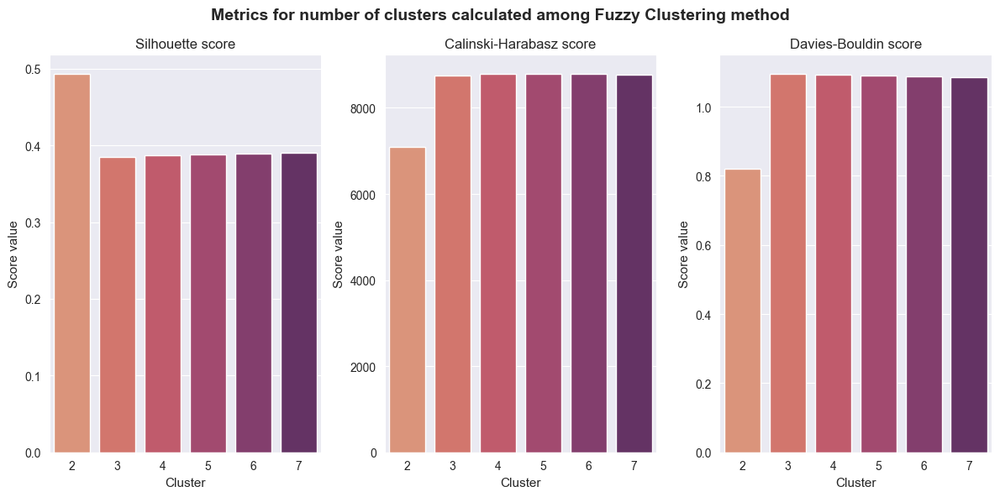

In [243]:
# Subplot for cluster details
sns.set_palette('Spectral')
fig = plt.figure(figsize = (12, 6))

ax1 = fig.add_subplot(131)
sns.barplot(data = clusters_df, x = 'Number of clusters', y = 'Silhouette score', ax = ax1, palette = 'flare')
ax1.set_xlabel('Cluster', fontsize = 11)
ax1.set_ylabel('Score value', fontsize = 11)
ax1.set_title('Silhouette score', fontsize = 12)

ax2 = fig.add_subplot(132)
sns.barplot(data = clusters_df, x = 'Number of clusters', y = 'Calinski-Harabasz score', 
            ax = ax2, palette = 'flare')
ax2.set_xlabel('Cluster', fontsize = 11)
ax2.set_ylabel('Score value', fontsize = 11)
ax2.set_title('Calinski-Harabasz score', fontsize = 12)

ax3 = fig.add_subplot(133)
sns.barplot(data = clusters_df, x = 'Number of clusters', y = 'Davies-Bouldin score', 
            ax = ax3, palette = 'flare')
ax3.set_xlabel('Cluster', fontsize = 11)
ax3.set_ylabel('Score value', fontsize = 11)
ax3.set_title('Davies-Bouldin score', fontsize = 12)

fig.suptitle('Metrics for number of clusters calculated among Fuzzy Clustering method', fontsize = 14, weight = 'bold')
plt.tight_layout()
plt.show()

We decide to go with <b>2</b> clusters, as the Silhouette score is the highest, but in this situation every option could be right.

In [244]:
# Fuzzy Clustering cluster analysis
fuzzy = FCM(n_clusters = 2, m = 8, random_state = 10)
fuzzy.fit(distance_matrix)
cluster_labels = fuzzy.predict(distance_matrix)


In [245]:
# Save cluster group as a column value in our data_frame
telco_customer_dummy['Cluster'] = cluster_labels

In [247]:
# Creating temporary DataFrame to counts size of clusters
telco_temp = pd.DataFrame(telco_customer_dummy['Cluster'].value_counts())

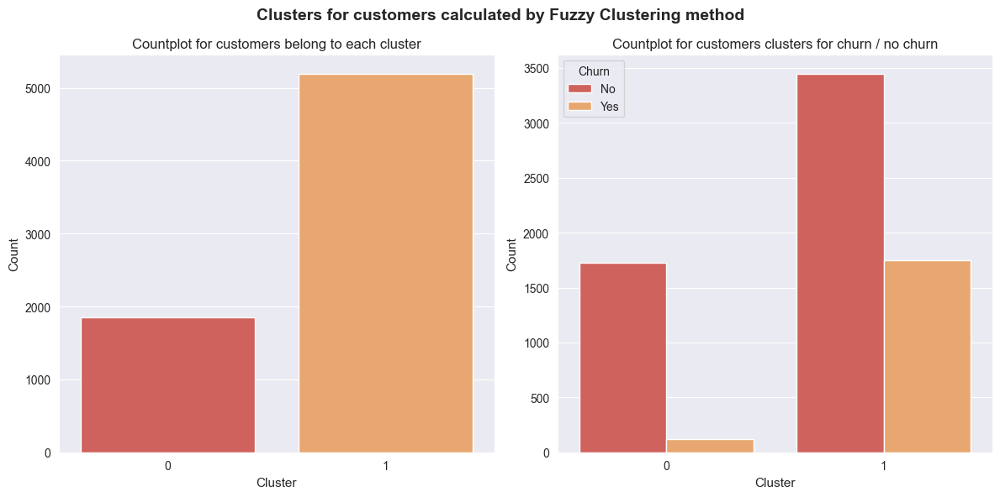

In [249]:
# Subplot for cluster details
sns.set_palette('Spectral')
fig = plt.figure(figsize = (12, 6))

ax1 = fig.add_subplot(121)
sns.barplot(data = telco_temp, x = telco_temp.index, y = 'Cluster', ax = ax1)
ax1.set_xlabel('Cluster', fontsize = 11)
ax1.set_ylabel('Count', fontsize = 11)
ax1.set_title('Countplot for customers belong to each cluster', fontsize = 12)

ax2 = fig.add_subplot(122)
sns.countplot(data = telco_customer_dummy, x = 'Cluster', hue = 'Churn', ax = ax2)
ax2.set_xlabel('Cluster', fontsize = 11)
ax2.set_ylabel('Count', fontsize = 11)
ax2.legend(['No', 'Yes'], title = 'Churn', loc = 'upper left')
ax2.set_title('Countplot for customers clusters for churn / no churn', fontsize = 12)

fig.suptitle('Clusters for customers calculated by Fuzzy Clustering method', fontsize = 14, weight = 'bold')
plt.tight_layout()
plt.show()

In [250]:
telco_customer_dummy.groupby('Cluster')['Churn'].value_counts(normalize = True)

Cluster  Churn
0        0        0.933549
         1        0.066451
1        0        0.663713
         1        0.336287
Name: Churn, dtype: float64

We can see that as it was during hierarchicacl clustering, we have two clusters with a huge difference in number of clients and a huge difference between how much of them decide to churn in each cluster - 6% in '0' to '33%' in '1'.

In [252]:
telco_customer_models['Cluster'] = telco_customer_dummy['Cluster']
telco_customer_models.head(1)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,Cluster
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,...,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No,1


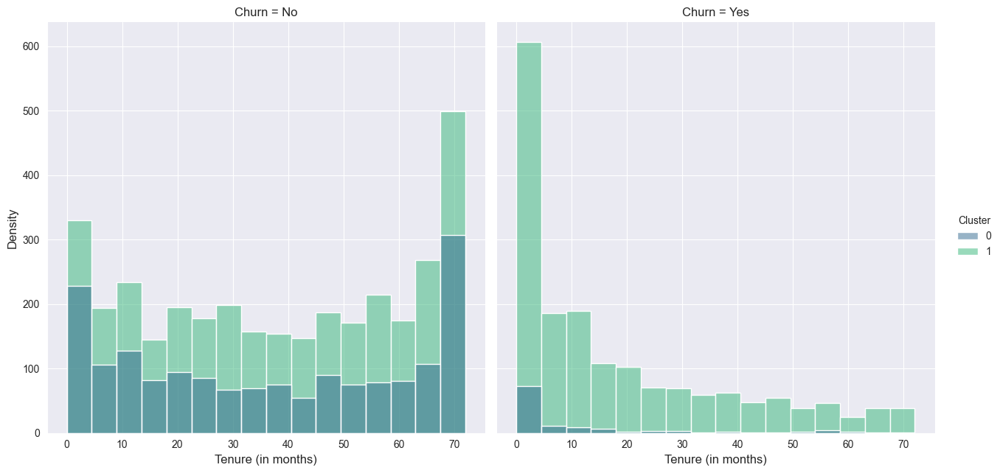

In [253]:
# KDE plots for each Payment Method
d = sns.displot(data = telco_customer_models, x = 'tenure', hue = 'Cluster', 
                col = 'Churn', col_wrap = 2, kind = 'hist', height = 6.5, palette = 'viridis')

d.set_axis_labels('Tenure (in months)', 'Density', fontsize = 12)
d.set_titles('Churn = {col_name}', size = 12)

plt.show()

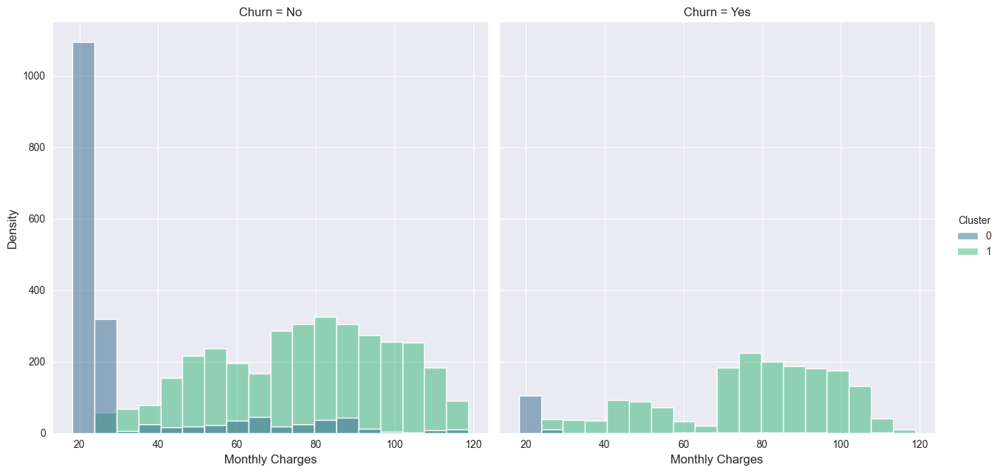

In [254]:
# KDE plots for each Monthly Charges
d = sns.displot(data = telco_customer_models, x = 'MonthlyCharges', hue = 'Cluster', 
                col = 'Churn', col_wrap = 2, kind = 'hist', height = 6.5, palette = 'viridis')

d.set_axis_labels('Monthly Charges', 'Density', fontsize = 12)
d.set_titles('Churn = {col_name}', size = 12)

plt.show()

In [255]:
# Mean of Monthly Charges by cluster
telco_customer.groupby(['Cluster', 'Churn'])[['MonthlyCharges', 'tenure']].mean()

MonthlyCharges     tenure
Cluster Churn                           
0       No          30.016811  36.659144
        Yes         25.200000  11.065041
1       No          76.934620  38.026698
        Yes         77.910223  18.466208

It is worth to mention that another time the algorithm did seperation mainly on monthly charges and tenure, another time in each cluster there similar first metric and different second metric. Tenure of churned clients is 3 times for '0' and 2 times for '1' less than for loyal clients. 

We can assume that this is the mainly criteria of making clusters between all methods.

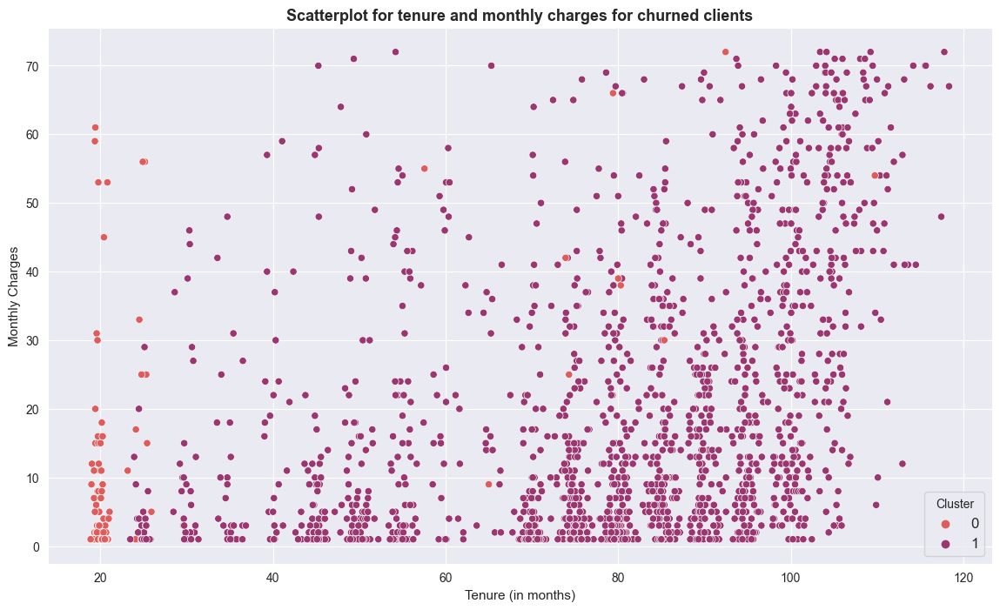

In [257]:
# Tenure vs Monthly Charges graph
sns.set_palette('flare')
plt.figure(figsize = (14, 8))

sns.scatterplot(x = 'MonthlyCharges', y = 'tenure', data = telco_customer_models[telco_customer_models['Churn'] == 'Yes'], 
                hue = 'Cluster', palette = 'flare')

plt.xlabel('Tenure (in months)', fontsize = 11)
plt.ylabel('Monthly Charges', fontsize = 11)
plt.title('Scatterplot for tenure and monthly charges for churned clients', fontsize = 13, weight = 'bold')

plt.legend(title = 'Cluster', loc = 'lower right', fontsize = 12)
plt.show()

A big part of cluster '0' is located on the very left side of the graph with the lowest values of Tenure, when '1' are among all the OX axis. If we look precisly, we can observe some orange points from '0' in the middle of the graph, but we can classify them as outliers.

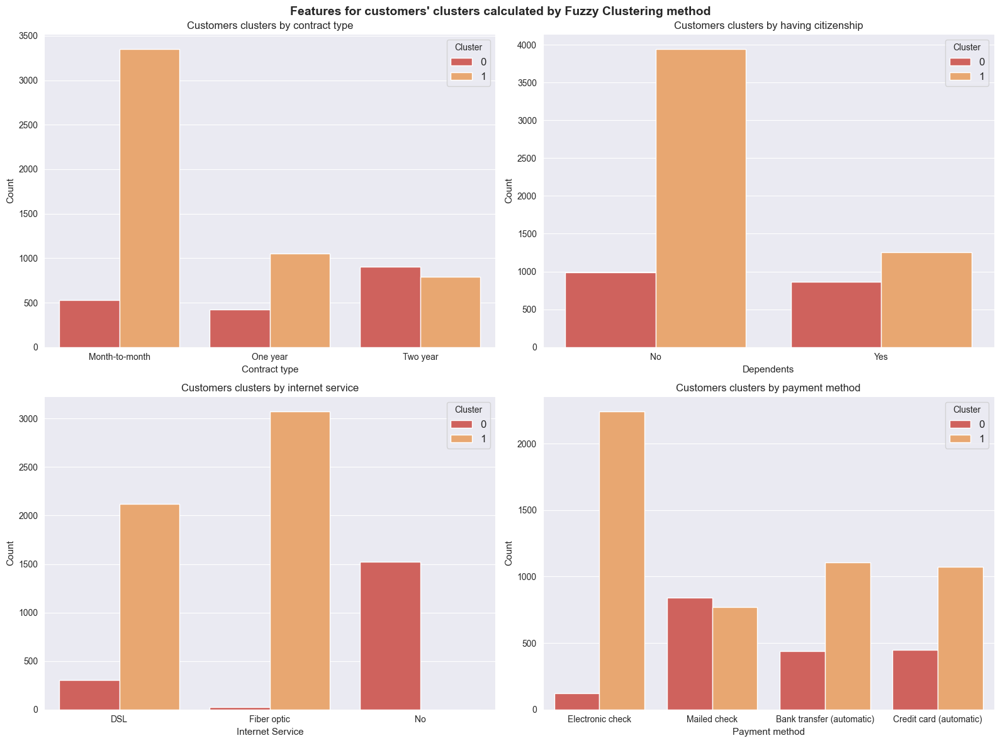

In [258]:
# Subplot for cluster details
sns.set_palette('Spectral')
fig = plt.figure(figsize = (16, 12))

ax1 = fig.add_subplot(221)
sns.countplot(data = telco_customer_models, x = 'Contract', hue = 'Cluster', ax = ax1)
ax1.set_xlabel('Contract type', fontsize = 11)
ax1.set_ylabel('Count', fontsize = 11)
ax1.set_title('Customers clusters by contract type', fontsize = 12)
ax1.legend(title = 'Cluster', fontsize = 12)

ax2 = fig.add_subplot(222)
sns.countplot(data = telco_customer_models, x = 'Dependents', hue = 'Cluster', ax = ax2)
ax2.set_xlabel('Dependents', fontsize = 11)
ax2.set_ylabel('Count', fontsize = 11)
ax2.legend(title = 'Cluster', fontsize = 12)
ax2.set_title('Customers clusters by having citizenship', fontsize = 12)

ax3 = fig.add_subplot(223)
sns.countplot(data = telco_customer_models, x = 'InternetService', hue = 'Cluster', ax = ax3)
ax3.set_xlabel('Internet Service', fontsize = 11)
ax3.set_ylabel('Count', fontsize = 11)
ax3.set_title('Customers clusters by internet service', fontsize = 12)
ax3.legend(title = 'Cluster', fontsize = 12)

ax4 = fig.add_subplot(224)
sns.countplot(data = telco_customer_models, x = 'PaymentMethod', hue = 'Cluster', ax = ax4)
ax4.set_xlabel('Payment method', fontsize = 11)
ax4.set_ylabel('Count', fontsize = 11)
ax4.legend(title = 'Cluster', fontsize = 12)
ax4.set_title('Customers clusters by payment method', fontsize = 12)

fig.suptitle('Features for customers\' clusters calculated by Fuzzy Clustering method', fontsize = 14, weight = 'bold')
plt.tight_layout()
plt.show()

In the case of tenure of the contract we can see that that clients of cluster '1' decide mainly to sign month-to-month aggrements, when the proportons of '0' are more similar to each other (but no so much). The leading contract in this group is two year contract. We can assume that it concerns that clients who wants to stay with Telco. As we showed before - only 6% of the '0' decide to churn.

In cluster '0' there are similar number of seniors and younger people, when in '1' nearly 4000 people is not classified as seniors. Clients from group '1' always use some Internet services, which are realized often by Fibric optic and a little bit rather by DSL. In '0' hardly ever someone decide to choose Fibric optic and a huge part do not need this kind of services.

Payment methods are different for each clusters - Electroni chceck is the most popular one among clients from cluster '1', but there are often persons who decide to pay by other options. In the cluster '0' most preferable option is Mailed check, but also there are someone (and it is not very rarely) who decide to use Bank transfer or Credit Card.

In [259]:
# Churned clients
telco_cluster_gp = telco_customer[telco_customer['Churn'] == 'Yes'].groupby('Cluster')

In [260]:
tenure_charges_cluster_df = pd.DataFrame()

columns = ['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService', 
           'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 
           'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 
           'Contract', 'PaperlessBilling', 'PaymentMethod']

for feature in columns:
    tenure_charges_cluster_df = Extract_highest_in_cluster(telco_customer_models, telco_cluster_gp, feature, tenure_charges_cluster_df)

<b>Cluster 0 - Low Tenure and Low Monthly Charges</b>

In [261]:
tenure_charges_cluster_df[tenure_charges_cluster_df['Cluster'] == 0]

,Category,Label,Percentage,Cluster,Avg_Tenure,Avg_MonthlyCharges
0,gender,Female,0.504065,0,10.90,25.97
2,SeniorCitizen,Not have a SeniorCitizen,0.943089,0,10.35,24.38
4,Partner,No,0.707317,0,7.31,22.26
6,Dependents,Yes,0.276423,0,17.79,30.15
8,PhoneService,Yes,1.000000,0,11.07,25.20
10,MultipleLines,No,0.902439,0,8.82,24.15
13,InternetService,No,0.918699,0,8.24,20.37
16,OnlineSecurity,No internet service,0.918699,0,8.24,20.37
19,OnlineBackup,No internet service,0.918699,0,8.24,20.37
22,DeviceProtection,No internet service,0.918699,0,8.24,20.37


Among group '0' there are rarely seniors, mainly of clients have not partner or dependents. Less than 10% decide to buy some extras like Streming Movies or Tech Support, but everybody buys Phone Service.

<b>Cluster 1 - Low Tenure and High Monthly Charges</b>

In [263]:
tenure_charges_cluster_df[tenure_charges_cluster_df['Cluster'] == 1]

,Category,Label,Percentage,Cluster,Avg_Tenure,Avg_MonthlyCharges
1,gender,Male,0.497709,1,19.51,77.55
3,SeniorCitizen,Have a SeniorCitizen,0.268614,1,21.01,81.34
5,Partner,Yes,0.362543,1,26.96,82.51
7,Dependents,No,0.832761,1,17.65,77.92
9,PhoneService,No,0.097365,1,15.84,37.53
11,MultipleLines,Yes,0.479954,1,25.70,89.85
12,MultipleLines,No phone service,0.097365,1,15.84,37.53
14,InternetService,Fiber optic,0.742268,1,20.17,88.11
15,InternetService,DSL,0.257732,1,13.56,48.54
17,OnlineSecurity,No,0.836770,1,16.50,77.18


In the cluster '1' there are more often churned people who have a partner (difference is about 12%), but there is alos a decrese in % of having dependents (from 26% to 17%). They are more eager to buy Internet Services, but they do it in different proportions. People from '1' mostly decide to sign month-to-month and go with paperless billings.

In [266]:
#rand_score, homogeneity_score, completeness_score
rand = rand_score(telco_customer_dummy['Churn'], cluster_labels)
homo = homogeneity_score(telco_customer_dummy['Churn'], cluster_labels)
complete = completeness_score(telco_customer_dummy['Churn'], cluster_labels)

print('Clustering stats:')
print('--> Rand score        : {0}'.format(rand))
print('--> Homogeneity score : {0}'.format(homo))
print('--> Completeness score: {0}'.format(complete))

Clustering stats:
--> Rand score        : 0.5000199811253975
--> Homogeneity score : 0.07544790276555165
--> Completeness score: 0.07579098515594815


<h4><b>Main conclusions from clustering analysis:</b></h4>

<li><u>All the clustering algorithms give similar number of clusters</u> - the number of clusters oscilate between 2 and 3 (in case of Fuzzy Clustering we can choose a few other numbers), but if we persisted, we could assign the same number of clusters to everyone, because there were grounds (some scores) for it;</li>
$\newline$

<li><u>Clustering algorithms mainly pay attention to Monthly Charges and Tenure</u> - groups are visible, e.g. low first value and high second value, high both, sometimes medium - it was a very good example in K-Medoids Clustering;</li>
$\newline$

<li><u>The biggest cluster always has the highest percentage of churned clients</u> - that was usually about 33%. Interestingly, each time it falls on the group with a Month-to-Month contract and choosing Payment Method as Electronic Check;</li>
$\newline$

<li><u>Despite using gower distance for three clusterization methods and some methods intendened to work with categorical data the results of homogeneity and completeness scores are so low</u> - we can assume that the distribution of the points to clusters is not perfect and elements of a given classes not always belong to the same cluster.</li>
$\newline$

<li><u>There are not presented all the algorithms which we tried</u> - we also look at the performance of Affinity Propagation (it found more than 140 clusters, so we could have difficulties to analyze them) or K-Prototypes, which is created to work with categorical data, but it is performed very similar to the presented previously K-Means and K-Medoids.</li>

<a name = "6."><h2>6. Dimension reduction  </h2> </a>

Dimensionality reduction refers to techniques that reduce the number of input variables in a dataset. More input features often make a predictive modeling task more challenging to model, more generally referred to as the curse of dimensionality. High-dimensionality statistics and dimensionality reduction techniques are often used for data visualization. Nevertheless these techniques can be used in applied machine learning to simplify a classification or regression dataset in order to better fit a predictive model. This method also help with dealing with overfitting problems.

In some part, we have already applied this process earlier by disabling high-correlated features and leaving only one of them in the dataset. Now, however, we will explore this process even more using algorithms from the scikit-learn library. In our work, we used three dimension reduction techniques - PCA (Principal Component Analysis), LDA (Linear Discriminant Analysis) and Kernel PCA (non-linear version of standard PCA).

<a name = "6.1."><h3>6.1 Feature extraction and visualization of multidimensional data </h3> </a>

In this section we introduce a few dimension reduction techniques which can help us in transforming dataset into less number of column to better perfoming of classification algorithms nad comparing these ones with previous cluster analysis. Therefor we should start with dropping the cluster values from above subsection.

In [64]:
# Version for only numerical categories
telco_dimension = telco_customer_dummy.copy()
#telco_dimension.drop('Cluster', axis = 1, inplace = True)
telco_dimension.drop('Churn', axis = 1, inplace = True)
telco_dimension.head(1)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,MultipleLines_No,...,PaymentMethod_Mailed check,DeviceProtection_No,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No,StreamingTV_No internet service,StreamingTV_Yes
0,0,0,1,0,-1.277445,0,1,-1.160323,-0.994971,0,...,0,1,0,0,1,0,0,1,0,0


In [62]:
# Version for only mixed categories
telco_dim_cat = telco_customer_models.copy()
#telco_dim_cat.drop('Cluster', axis = 1, inplace = True)
telco_dim_cat.drop('Churn', axis = 1, inplace = True)

In [63]:
# Scaling Tenure and Monthly Charges
scaler = StandardScaler()
telco_dim_cat[['tenure', 'MonthlyCharges', 'TotalCharges']] = \
scaler.fit_transform(telco_dim_cat[['tenure', 'MonthlyCharges', 'TotalCharges']])
telco_dim_cat.head(1)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,Female,0,Yes,No,-1.277445,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,-1.160323,-0.994971


<a name = "6.1.1"><h3>6.1.1 PCA - Principal Component Analysis </h3> </a>

<b>Principal Component Analysis (PCA)</b> is a popular unsupervised learning technique for reducing the dimensionality of data. It increases interpretability yet, at the same time, it minimizes information loss. 

It helps to find the most significant features in a dataset and makes the data easy for plotting in 2D and 3D. PCA helps in finding a sequence of linear combinations of variables.

We will do PCA with two different approaches - as this is not preferable method to work with categorical data, we start with dummy columns, but then we try with dimension matrix from calculating gover distances from previous section.

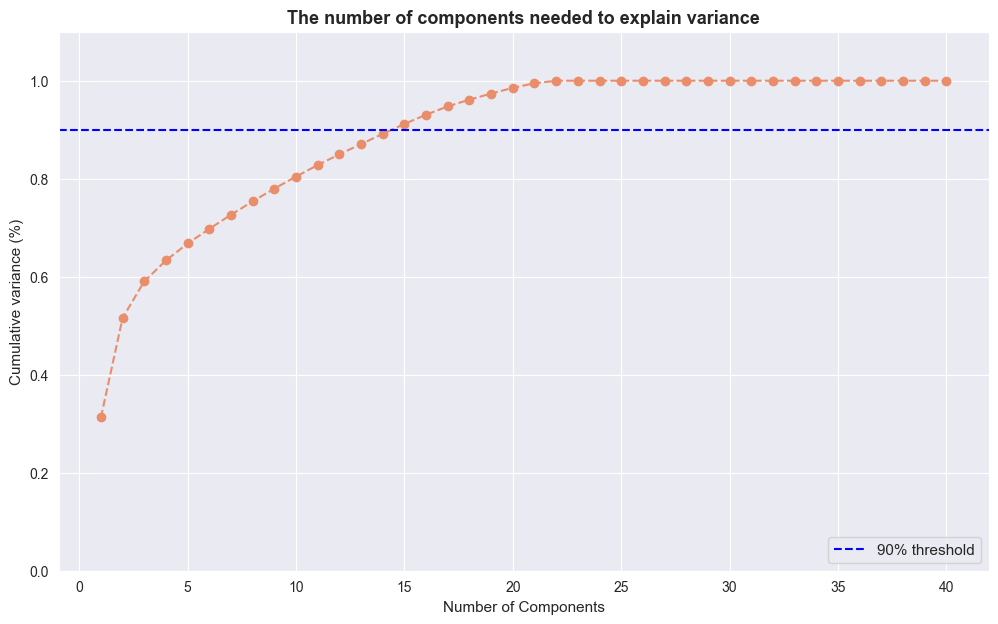

In [275]:
# First approach
pca = PCA(n_components = 40).fit(telco_dimension)

sns.set_style('darkgrid')
sns.set_palette('flare')
plt.figure(figsize = (12, 7))

# number of features in telco customer after dummies
xi = np.arange(1, 41, step=1)
y = np.cumsum(pca.explained_variance_ratio_)

plt.plot(xi, y, marker = 'o', linestyle='--')
plt.axhline(y = 0.90, color = 'b', linestyle = '--', label = '90% threshold')
plt.ylim(0.0, 1.1)

plt.xlabel('Number of Components', fontsize = 11)
plt.ylabel('Cumulative variance (%)', fontsize = 11)
plt.title('The number of components needed to explain variance', fontsize = 13 , weight = 'bold')

plt.legend(loc = 'lower right', fontsize = 11)
plt.show()

From the graph we can see that the rigth number of components in PCA dimension reduction is <b>15 features</b> to explain 90% of cumulatice variance and we set this value in our reflections. As we start with 20 columns (we drop Churn metric) we reduced dataset from 20 to 15 dimensions.

In [277]:
# Transform data by PCA into 2D
pca_red = PCA(n_components = 15)
pca_red_df = pd.DataFrame(pca_red.fit_transform(telco_dimension))
pca_red_df['Churn'] = telco_customer_models['Churn']
pca_red_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,Churn
0,-1.305397,-1.750881,1.274963,-0.486746,0.776941,-1.309948,-0.668390,0.641477,0.222085,0.146137,0.524333,-0.286339,0.108816,-0.326200,-0.323349,No
1,-0.313214,-0.259353,1.452300,0.326482,-0.599183,0.721826,0.125148,-1.098804,0.728662,0.839319,-0.675251,0.717509,0.192299,0.119238,-0.155197,No
2,-1.161696,-1.536964,1.128760,0.104526,-1.134781,-0.899696,0.111740,0.126597,-0.014909,0.688192,-0.689446,-0.177963,-0.108800,0.344723,0.277686,Yes
3,-0.120675,0.345857,2.259566,0.370151,0.407286,0.358947,0.643903,-1.072994,0.267306,0.055723,-0.419350,0.598631,0.164737,0.286773,-0.936991,No
4,-0.747447,-2.398935,-0.332220,-0.408366,-0.475676,0.355202,-0.241297,-0.312712,-0.200935,-0.001835,0.565591,-0.229036,0.173661,-0.267533,-0.217800,Yes


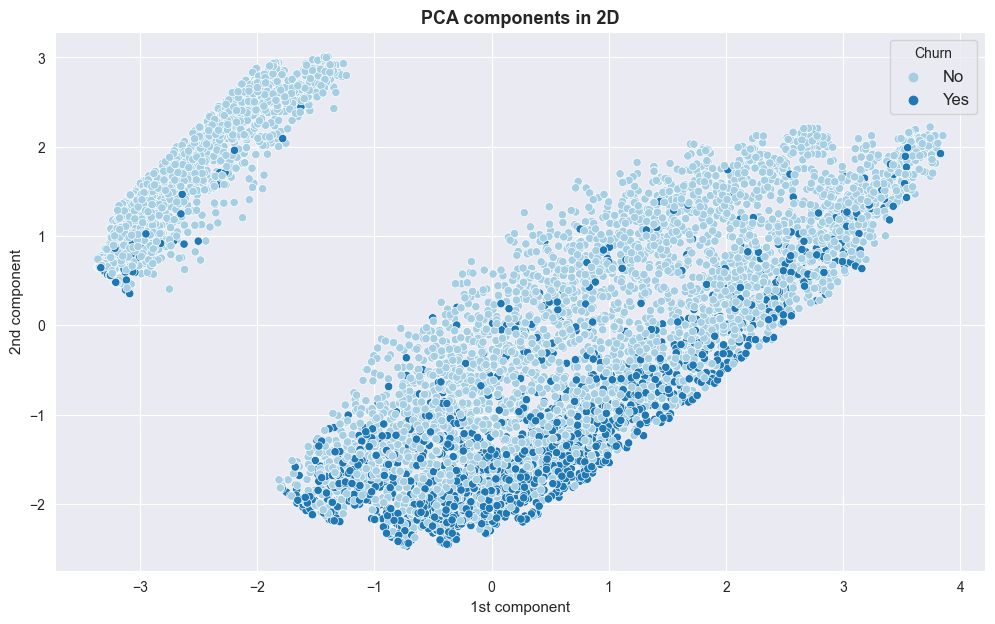

In [278]:
# Visualization in 2D for two dimensions with highest variance explained ratio
sns.set_palette('Paired')
plt.figure(figsize = (12, 7))

sns.scatterplot(x = 0, y = 1, data = pca_red_df, hue = 'Churn')

plt.xlabel('1st component', fontsize = 11)
plt.ylabel('2nd component', fontsize = 11)
plt.title('PCA components in 2D', fontsize = 13, weight = 'bold')

plt.legend(title = 'Churn', fontsize = 12)
plt.show()

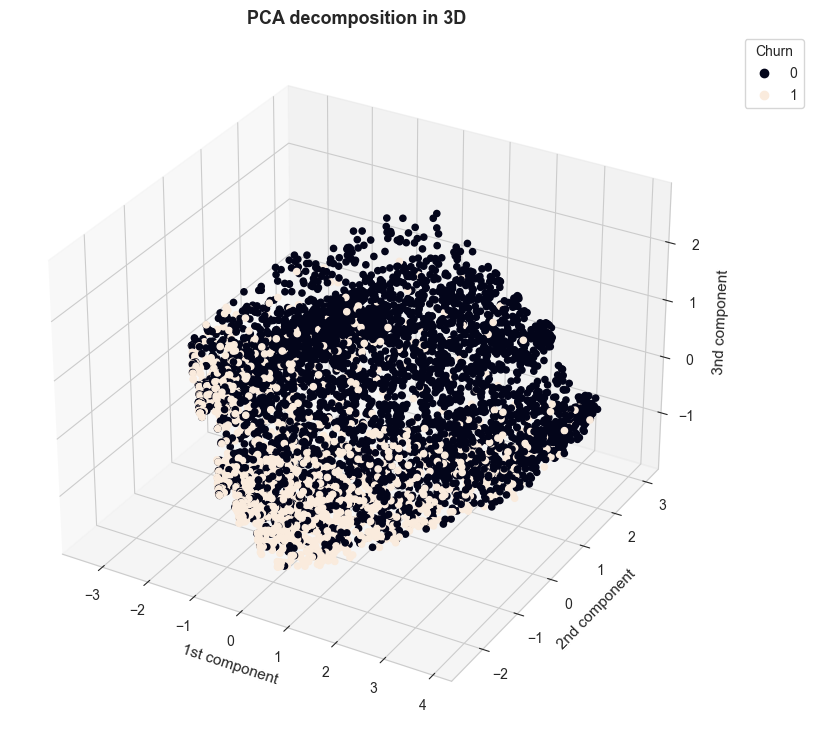

In [280]:
# Visualization in 3D
sns.set_style('whitegrid')

fig = plt.figure(figsize = (16, 9))
ax = fig.add_subplot(111, projection='3d')

pca_red_df['Churn'][pca_red_df['Churn'] == 'No'] = 0
pca_red_df['Churn'][pca_red_df['Churn'] == 'Yes'] = 1

# load some test data for demonstration and plot a wireframe
sc = ax.scatter(pca_red_df[0], pca_red_df[1], pca_red_df[2], c = pca_red_df['Churn'], depthshade=False)

ax.set_xlabel('1st component', fontsize = 11)
ax.set_ylabel('2nd component', fontsize = 11)
ax.set_zlabel('3nd component', fontsize = 11)
ax.set_title('PCA decomposition in 3D', fontsize = 13, weight = 'bold')

plt.legend(title = 'Churn', *sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

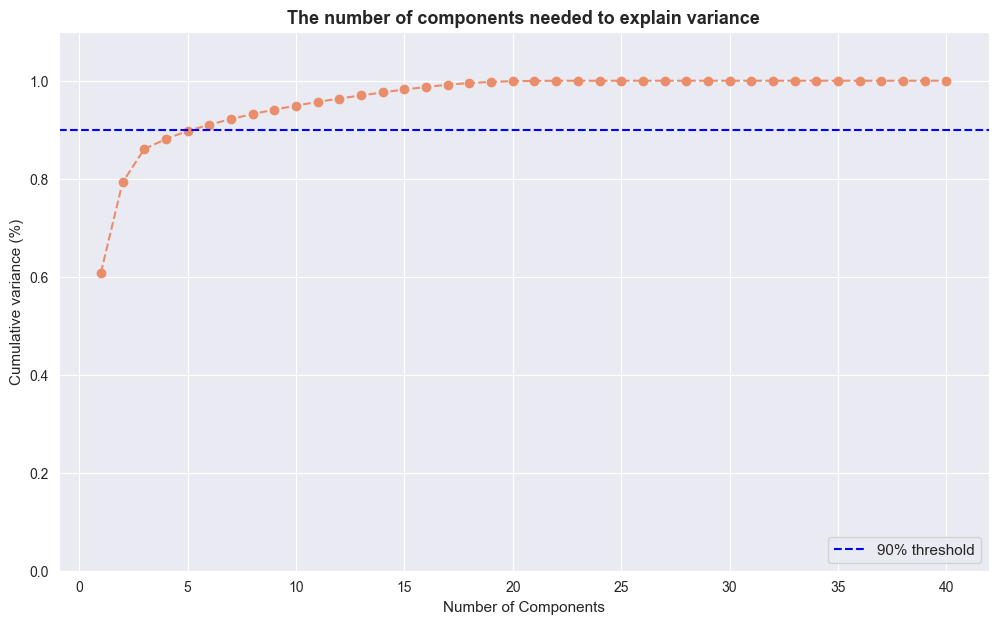

In [282]:
# Second approach
pca = PCA(n_components = 40).fit(distance_matrix)

sns.set_style('darkgrid')
sns.set_palette('flare')
plt.figure(figsize = (12, 7))

# number of features in telco customer after dummies
xi = np.arange(1, 41, step=1)
y = np.cumsum(pca.explained_variance_ratio_)

plt.plot(xi, y, marker = 'o', linestyle='--')
plt.axhline(y = 0.90, color = 'b', linestyle = '--', label = '90% threshold')
plt.ylim(0.0, 1.1)

plt.xlabel('Number of Components', fontsize = 11)
plt.ylabel('Cumulative variance (%)', fontsize = 11)
plt.title('The number of components needed to explain variance', fontsize = 13 , weight = 'bold')

plt.legend(loc = 'lower right', fontsize = 11)
plt.show()

In [283]:
# Transform data by PCA into 2D
pca_red = PCA(n_components = 5)
pca_red_df_gower = pd.DataFrame(pca_red.fit_transform(distance_matrix))
pca_red_df_gower['Churn'] = telco_customer_models['Churn']
pca_red_df_gower.head()

,0,1,2,3,4,Churn
0,-5.290191,-4.391488,3.683179,-1.725278,2.339055,No
1,-1.277985,-2.031490,5.410447,1.285075,-1.153961,No
2,-3.178140,-5.198153,4.585081,-0.500957,-2.410072,Yes
3,-0.605197,2.597960,7.825097,0.476719,2.266388,No
4,-7.231813,-8.668797,-1.052645,0.057803,-1.095761,Yes


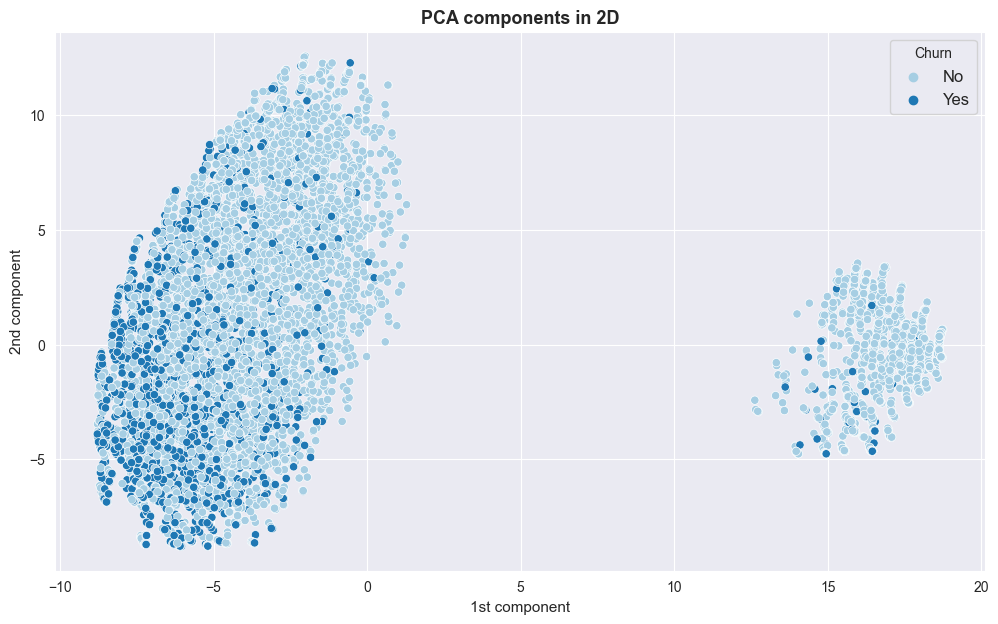

In [284]:
# Visualization in 2D for two dimensions with highest variance explained ratio
sns.set_palette('Paired')
plt.figure(figsize = (12, 7))

sns.scatterplot(x = 0, y = 1, data = pca_red_df_gower, hue = 'Churn')

plt.xlabel('1st component', fontsize = 11)
plt.ylabel('2nd component', fontsize = 11)
plt.title('PCA components in 2D', fontsize = 13, weight = 'bold')

plt.legend(title = 'Churn', fontsize = 12)
plt.show()

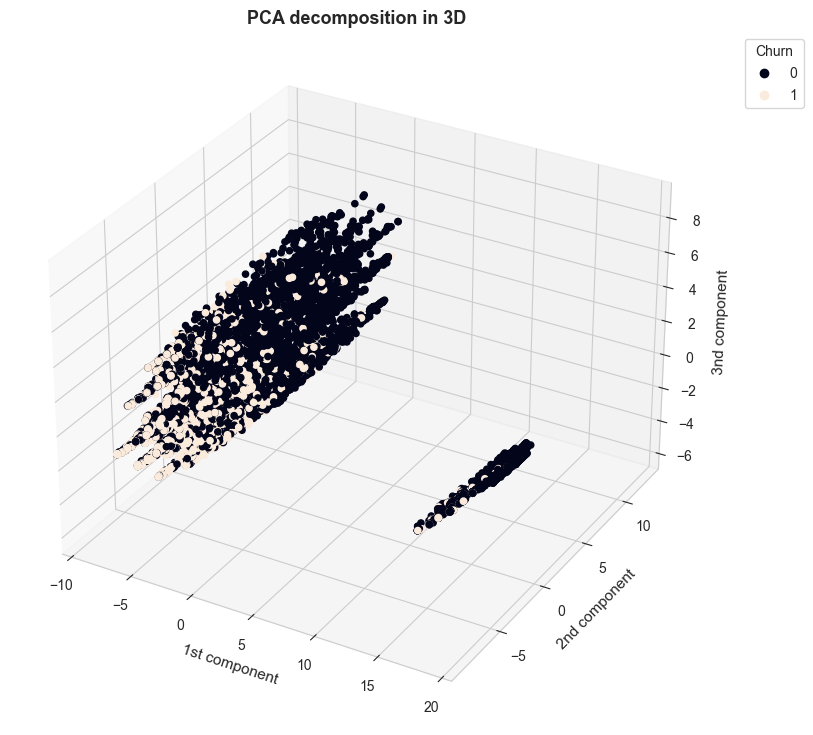

In [285]:
# Visualization in 3D
sns.set_style('whitegrid')

fig = plt.figure(figsize = (16, 9))
ax = fig.add_subplot(111, projection='3d')

pca_red_df_gower['Churn'][pca_red_df_gower['Churn'] == 'No'] = 0
pca_red_df_gower['Churn'][pca_red_df_gower['Churn'] == 'Yes'] = 1

# load some test data for demonstration and plot a wireframe
sc = ax.scatter(pca_red_df_gower[0], pca_red_df_gower[1], pca_red_df_gower[2], 
                c = pca_red_df_gower['Churn'], depthshade=False)

ax.set_xlabel('1st component', fontsize = 11)
ax.set_ylabel('2nd component', fontsize = 11)
ax.set_zlabel('3nd component', fontsize = 11)
ax.set_title('PCA decomposition in 3D', fontsize = 13, weight = 'bold')

plt.legend(title = 'Churn', *sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

<a name = "6.1.2"><h3>6.1.2 Truncated SVD - Truncated Singular Value Decomposition </h3> </a>

<b>Truncated SVD</b> performs linear dimensionality reduction by means of truncated singular value decomposition (SVD). Contrary to PCA, this estimator does not center the data before computing the singular value decomposition. This means it can work with sparse matrices efficiently.

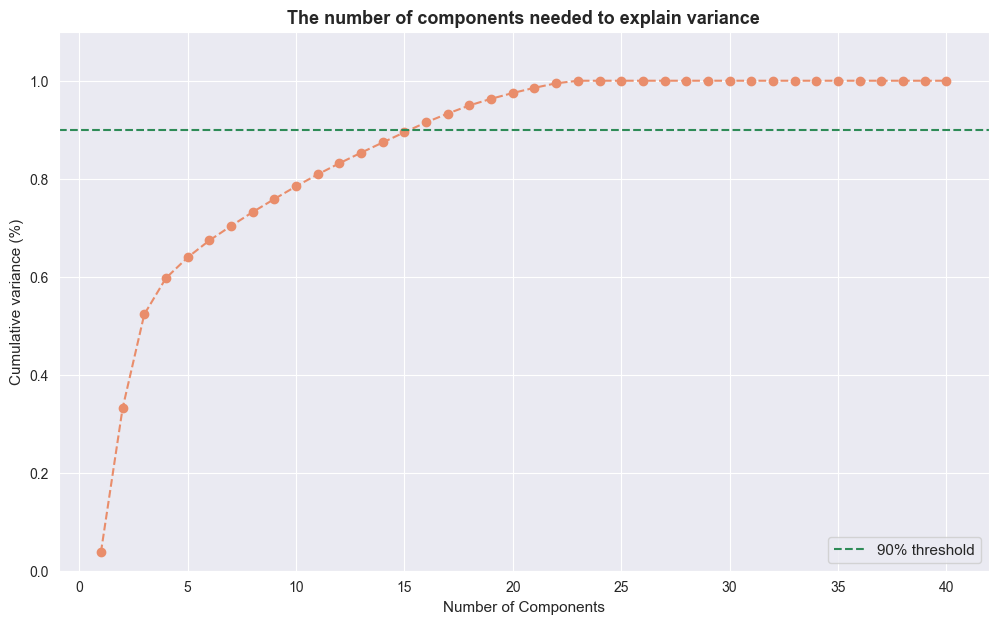

In [293]:
sns.set_style('darkgrid')
sns.set_palette('flare')
plt.figure(figsize = (12, 7))

tsvd = TruncatedSVD(n_components = 40).fit(telco_dimension)

# number of features in telco customer after dummies
xi = np.arange(1, 41, step = 1)
y = np.cumsum(tsvd.explained_variance_ratio_)

plt.plot(xi, y, marker='o', linestyle='--')
plt.axhline(y = 0.9, color = 'seagreen', linestyle = '--', label = '90% threshold')
plt.ylim(0.0, 1.1)

plt.xlabel('Number of Components', fontsize = 11)
plt.ylabel('Cumulative variance (%)', fontsize = 11)
plt.title('The number of components needed to explain variance', fontsize = 13 , weight = 'bold')

plt.legend(loc = 'lower right', fontsize = 11)
plt.show()

As before, we should use <b>15</b> of the features, so we reduce 5 dimensions of the dataset to explain 90% of the variance. 

In [296]:
# Transform data by PCA into 2D
tsvd_red = TruncatedSVD(n_components = 15)
tsvd_red_df = pd.DataFrame(tsvd_red.fit_transform(telco_dimension))
tsvd_red_df['Churn'] = telco_customer_models['Churn']
tsvd_red_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,Churn
0,2.047280,-1.695906,-1.512510,1.269542,-0.515057,0.737858,1.515413,-0.072094,0.482983,0.439182,-0.076037,-0.528778,-0.117469,0.135293,-0.312746,No
1,2.092812,-0.611681,-0.082589,1.468245,0.365643,-0.578417,-0.830394,-0.375633,-1.109313,0.438990,1.008440,0.572766,0.554243,0.203847,0.142781,No
2,2.467540,-1.646588,-1.195830,1.175791,0.176061,-1.130599,0.844781,0.429872,-0.122847,-0.137039,0.957698,0.096744,-0.068017,-0.109712,0.356247,Yes
3,1.431742,-0.209730,0.332592,2.207689,0.313168,0.365408,-0.667055,0.178445,-1.095257,-0.121402,0.236688,0.462357,0.456637,0.164171,0.307548,No
4,2.620187,-1.304796,-2.074991,-0.314634,-0.397536,-0.483165,-0.339895,-0.485189,0.015142,-0.108181,-0.191708,-0.536548,-0.077074,0.195751,-0.251274,Yes


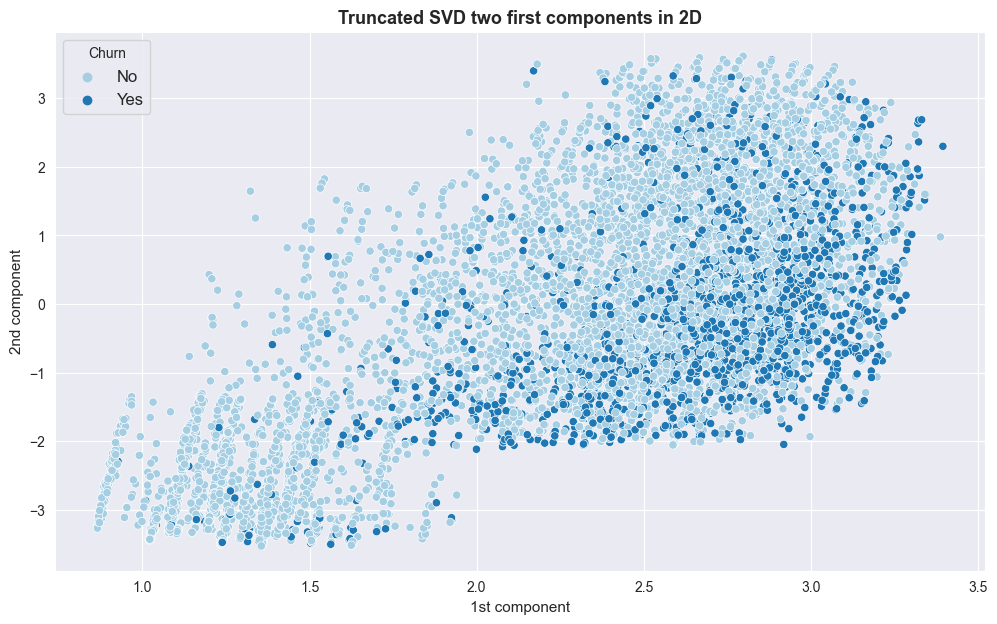

In [297]:
# Visualization in 2D
sns.set_palette('Paired')
plt.figure(figsize = (12, 7))

sns.scatterplot(x = 0, y = 1, data = tsvd_red_df, hue = 'Churn')

plt.xlabel('1st component', fontsize = 11)
plt.ylabel('2nd component', fontsize = 11)
plt.title('Truncated SVD two first components in 2D', fontsize = 13, weight = 'bold')

plt.legend(title = 'Churn', fontsize = 12)
plt.show()

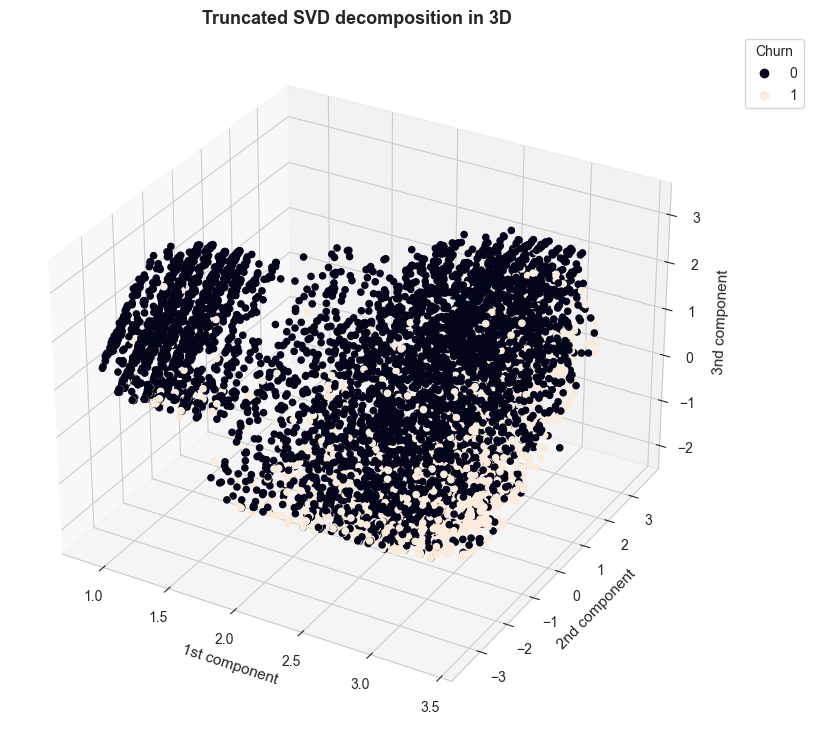

In [298]:
# Visualization in 3D
sns.set_style('whitegrid')

fig = plt.figure(figsize = (16, 9))
ax = fig.add_subplot(111, projection='3d')

tsvd_red_df['Churn'][tsvd_red_df['Churn'] == 'No'] = 0
tsvd_red_df['Churn'][tsvd_red_df['Churn'] == 'Yes'] = 1

# load some test data for demonstration and plot a wireframe
sc = ax.scatter(tsvd_red_df[0], tsvd_red_df[1], tsvd_red_df[2], c = tsvd_red_df['Churn'], depthshade=False)

ax.set_xlabel('1st component', fontsize = 11)
ax.set_ylabel('2nd component', fontsize = 11)
ax.set_zlabel('3nd component', fontsize = 11)
ax.set_title('Truncated SVD decomposition in 3D', fontsize = 13, weight = 'bold')

plt.legend(title = 'Churn', *sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

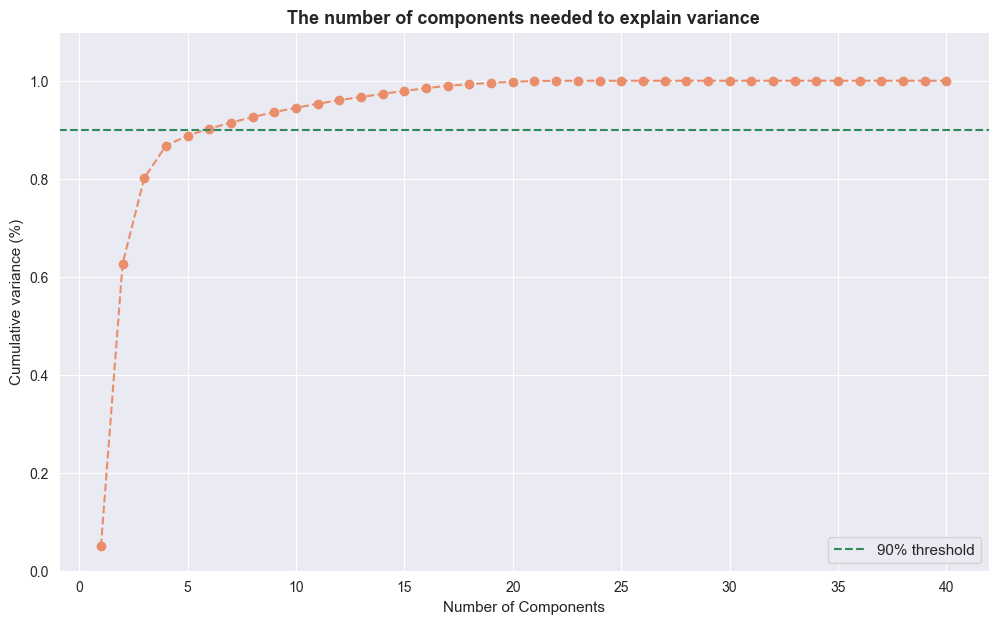

In [299]:
# Second case
sns.set_style('darkgrid')
sns.set_palette('flare')
plt.figure(figsize = (12, 7))

tsvd = TruncatedSVD(n_components = 40).fit(distance_matrix)

# number of features in telco customer after dummies
xi = np.arange(1, 41, step = 1)
y = np.cumsum(tsvd.explained_variance_ratio_)

plt.plot(xi, y, marker='o', linestyle='--')
plt.axhline(y = 0.9, color = 'seagreen', linestyle = '--', label = '90% threshold')
plt.ylim(0.0, 1.1)

plt.xlabel('Number of Components', fontsize = 11)
plt.ylabel('Cumulative variance (%)', fontsize = 11)
plt.title('The number of components needed to explain variance', fontsize = 13 , weight = 'bold')

plt.legend(loc = 'lower right', fontsize = 11)
plt.show()

In [300]:
# Transform data by PCA into 2D
tsvd_red = TruncatedSVD(n_components = 6)
tsvd_red_df_gower = pd.DataFrame(tsvd_red.fit_transform(distance_matrix))
tsvd_red_df_gower['Churn'] = telco_customer_models['Churn']
tsvd_red_df_gower.head()

,0,1,2,3,4,5,Churn
0,34.264782,-5.943862,-5.248631,3.019192,-1.309174,-0.435754,No
1,33.102627,-1.607005,-2.244641,5.453413,1.064567,0.348156,No
2,31.842579,-3.192275,-5.312110,4.562408,-0.793434,2.437955,Yes
3,37.277725,-2.001203,1.463982,7.358796,0.770579,-1.867319,No
4,30.073698,-6.843354,-8.626455,-1.259639,-0.026669,1.066771,Yes


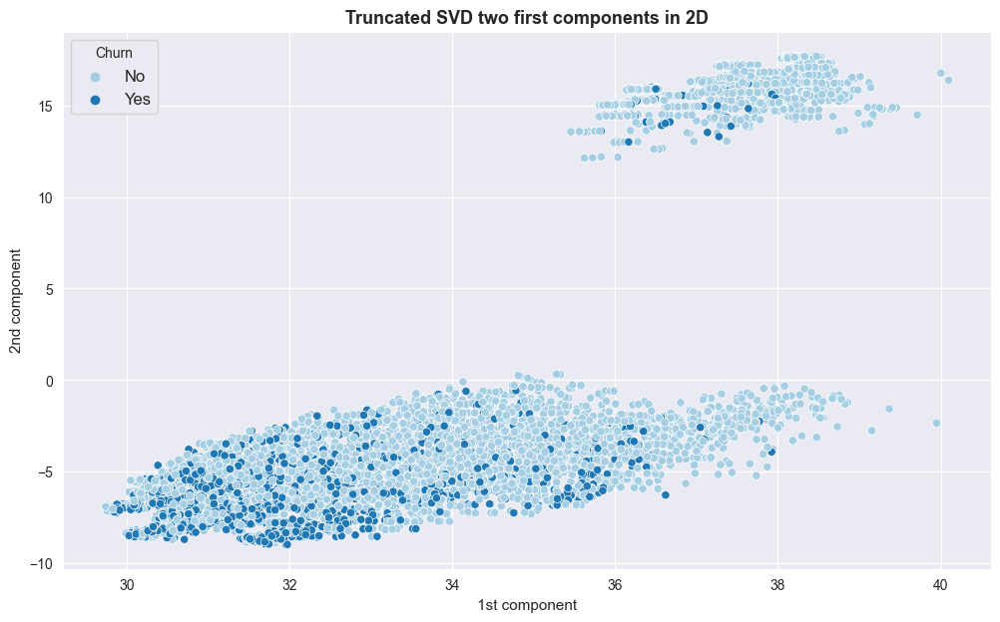

In [302]:
# Visualization in 2D
sns.set_palette('Paired')
plt.figure(figsize = (12, 7))

sns.scatterplot(x = 0, y = 1, data = tsvd_red_df_gower, hue = 'Churn')

plt.xlabel('1st component', fontsize = 11)
plt.ylabel('2nd component', fontsize = 11)
plt.title('Truncated SVD two first components in 2D', fontsize = 13, weight = 'bold')

plt.legend(title = 'Churn', fontsize = 12)
plt.show()

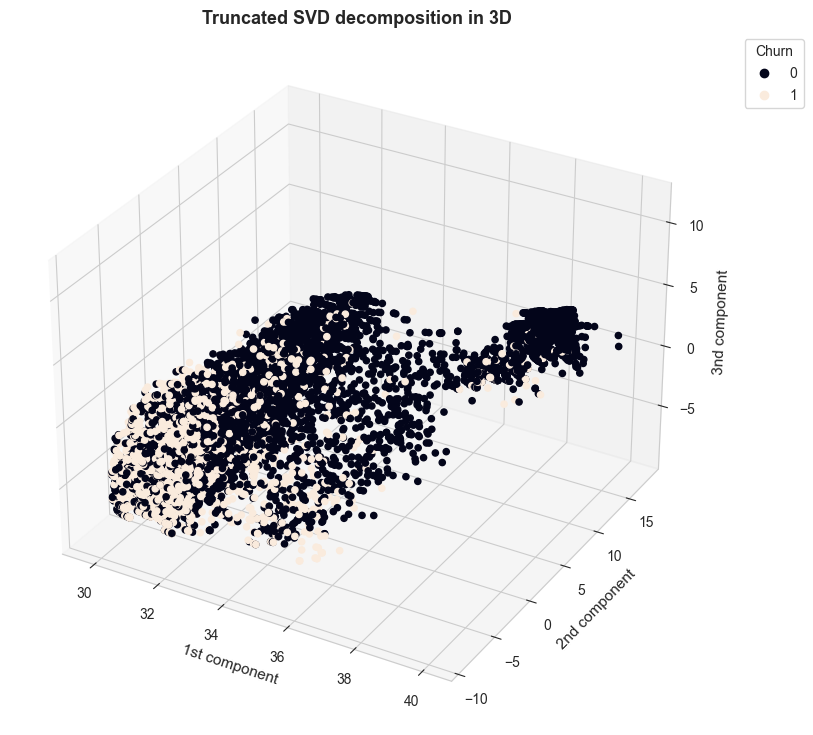

In [303]:
# Visualization in 3D
sns.set_style('whitegrid')

fig = plt.figure(figsize = (16, 9))
ax = fig.add_subplot(111, projection='3d')

tsvd_red_df_gower['Churn'][tsvd_red_df_gower['Churn'] == 'No'] = 0
tsvd_red_df_gower['Churn'][tsvd_red_df_gower['Churn'] == 'Yes'] = 1

# load some test data for demonstration and plot a wireframe
sc = ax.scatter(tsvd_red_df_gower[0], tsvd_red_df_gower[1], tsvd_red_df_gower[2], c = tsvd_red_df_gower['Churn'], depthshade=False)

ax.set_xlabel('1st component', fontsize = 11)
ax.set_ylabel('2nd component', fontsize = 11)
ax.set_zlabel('3nd component', fontsize = 11)
ax.set_title('Truncated SVD decomposition in 3D', fontsize = 13, weight = 'bold')

plt.legend(title = 'Churn', *sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

<a name = "6.1.3"><h3>6.1.3 FAMD - Factor analysis of mixed data</h3> </a>

<b>Factor analysis</b> of mixed data (FAMD) is a principal component method dedicated to analyze a data set containing both quantitative and qualitative variables. It makes it possible to analyze the similarity between individuals by taking into account a mixed types of variables. Additionally, one can explore the association between all variables, both quantitative and qualitative variables.

Roughly speaking, the FAMD algorithm can be seen as a mixed between principal component analysis (PCA) and multiple correspondence analysis (MCA).

In [309]:
famd = prince.FAMD(n_components = 20, n_iter = 3, copy = True, 
                   check_input = True, engine = 'auto', 
                   random_state = 42).fit_transform(telco_dim_cat)

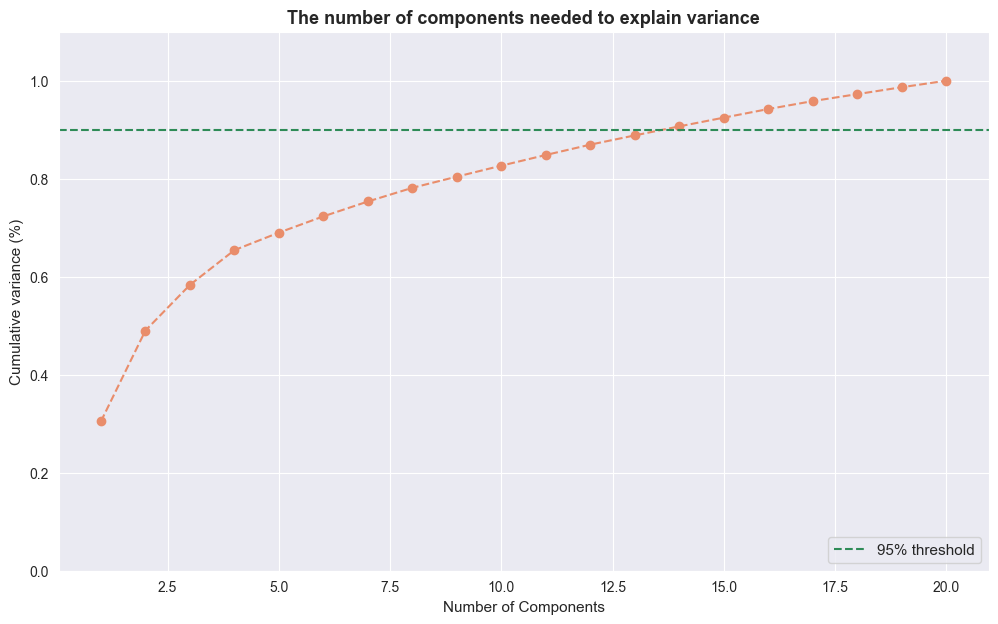

In [312]:
sns.set_style('darkgrid')
sns.set_palette('flare')
plt.figure(figsize = (12, 7))

# number of features in telco customer after dummies
xi = np.arange(1, 21, step = 1)

explained_variance = np.var(famd, axis = 0)
explained_variance_ratio = explained_variance / np.sum(explained_variance)
y = np.cumsum(explained_variance_ratio)

plt.plot(xi, y, marker='o', linestyle='--')
plt.axhline(y = 0.90, color = 'seagreen', linestyle = '--', label = '95% threshold')
plt.ylim(0.0, 1.1)

plt.xlabel('Number of Components', fontsize = 11)
plt.ylabel('Cumulative variance (%)', fontsize = 11)
plt.title('The number of components needed to explain variance', fontsize = 13 , weight = 'bold')

plt.legend(loc = 'lower right', fontsize = 11)
plt.show()

From the graph we could see that we should work with <b>13</b> features which is the biggest reduction (made on telco_dimension) between other methods.

In [313]:
# Transform data by PCA into 2D
famd_red = prince.FAMD(n_components = 13, n_iter = 3, copy = True, 
                   check_input = True, engine = 'auto', 
                   random_state = 42)
famd_red_df = pd.DataFrame(famd_red.fit_transform(telco_dim_cat))
famd_red_df['Churn'] = telco_customer_models['Churn']
famd_red_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,Churn
0,-0.855054,-1.128240,-0.785823,1.170661,0.356175,0.529811,-0.555448,-0.472871,0.209642,-0.116069,-0.217084,0.640656,-0.172917,No
1,-0.179628,-0.152951,-0.599234,0.301051,-0.355053,-0.796921,0.439402,0.484815,0.373365,0.308081,0.477516,-0.206868,0.213763,No
2,-0.699158,-1.025126,-0.581186,0.080322,-0.357227,-0.580686,0.226804,0.330862,0.171561,-0.250903,-0.598496,0.514677,0.181553,Yes
3,-0.107865,0.149292,-0.969631,1.542711,0.410649,-0.480096,0.118283,0.373205,0.183372,0.690307,0.191304,-0.351214,0.290659,No
4,-0.435178,-1.427391,-0.297083,-0.501025,-0.105907,-0.168105,-0.356285,-0.388819,0.063079,-0.083765,-0.030062,-0.175521,-0.157795,Yes


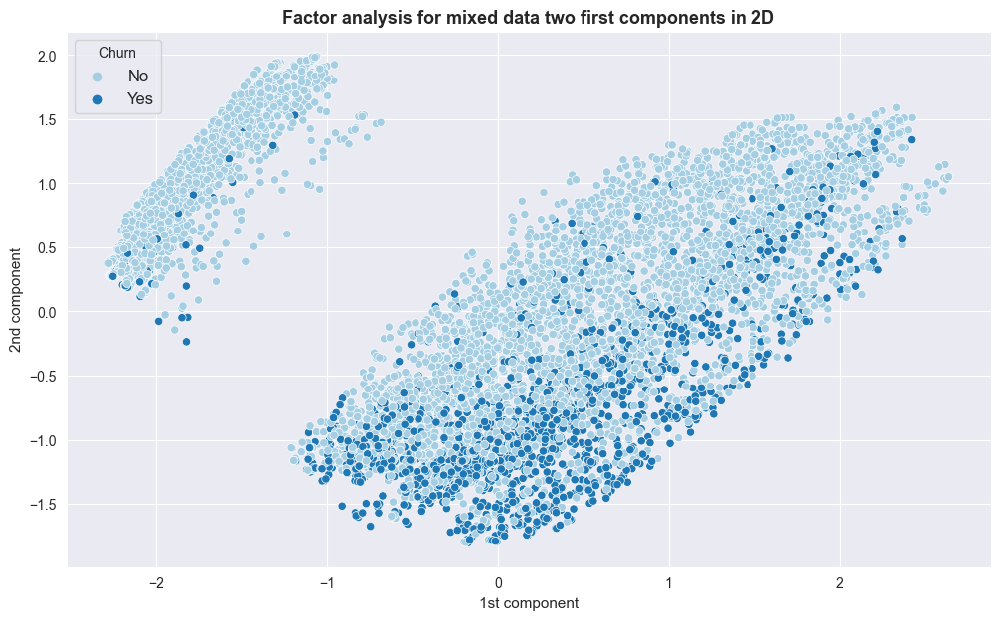

In [314]:
# Visualization in 2D
sns.set_palette('Paired')
plt.figure(figsize = (12, 7))

sns.scatterplot(x = 0, y = 1, data = famd_red_df, hue = 'Churn')

plt.xlabel('1st component', fontsize = 11)
plt.ylabel('2nd component', fontsize = 11)
plt.title('Factor analysis for mixed data two first components in 2D', fontsize = 13, weight = 'bold')

plt.legend(title = 'Churn', fontsize = 12)
plt.show()

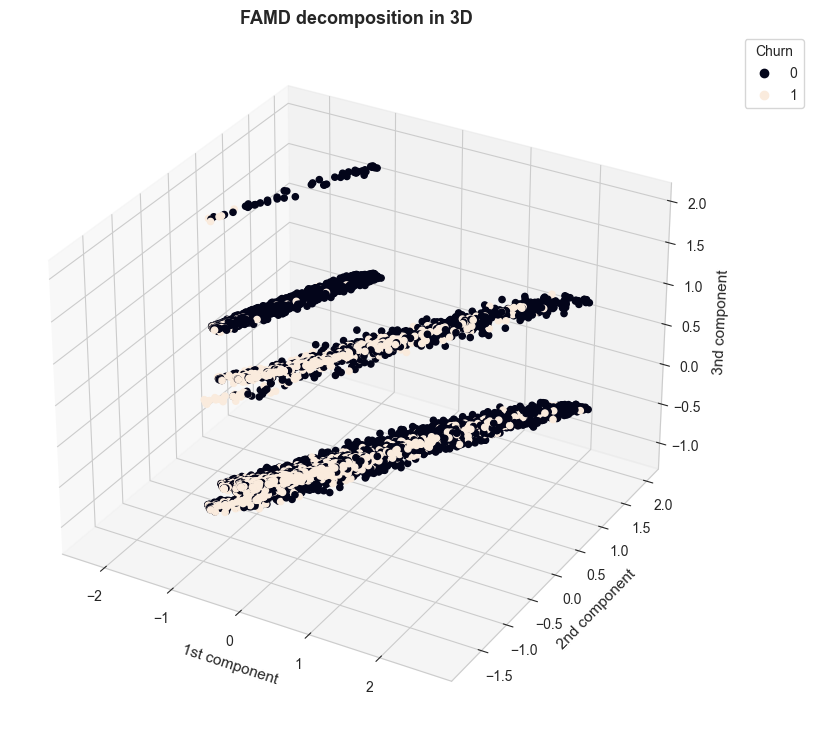

In [316]:
# Visualization in 3D
sns.set_style('whitegrid')

fig = plt.figure(figsize = (16, 9))
ax = fig.add_subplot(111, projection='3d')

famd_red_df['Churn'][famd_red_df['Churn'] == 'No'] = 0
famd_red_df['Churn'][famd_red_df['Churn'] == 'Yes'] = 1

# load some test data for demonstration and plot a wireframe
sc = ax.scatter(famd_red_df[0], famd_red_df[1], famd_red_df[2], c = famd_red_df['Churn'], depthshade=False)

ax.set_xlabel('1st component', fontsize = 11)
ax.set_ylabel('2nd component', fontsize = 11)
ax.set_zlabel('3nd component', fontsize = 11)
ax.set_title('FAMD decomposition in 3D', fontsize = 13, weight = 'bold')

plt.legend(title = 'Churn', *sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

<b>Main conclusions from dimension reduction:</b>

<li><u>The number of components are somteimes quite similar</u> - there is no rule in this case, while we have three alogithms between n components oscilites between 13 and 15;</li>
$\newline$

<li><u>In PCA and FAMD when plotting data in 2D is visible a prat of points which are far from others and consists mainly of non-churned clients</u> - maybe it is an coincidence, but even in Truncated SVD there is a part of light blue (conntcted to loyal clients) points, which can be separated from others.</li>

<a name = "6.2."><h3>6.2 Application in connection with classification  </h3> </a>

Now we use these feature reduction methods both 2D and 3D to conduct classification algorithms once more. Although we choose the four algorithms (half of all tested in Classification part) which performed the best in the previous point: <b>Logistic Regression</b>, <b>Support Vector Classificator (SVC)</b>, <b>Linear Discriminant Analysis</b> and <b>Bagging</b> (based on Decision Tree Classifier)</b>. With 5 dimension reduction results (3+2) that is 20 models to comparison.

In [16]:
# Function which shows results of the model
def model_results_plots(model, x_train, x_test, y_train):
    '''Function which returns statistics about classification model: 
    confusion matrix, accuracy of the model and graphs with true and 
    false labels and ROC curve course
    
    : param model : fitted model to dataset
    : type model : class sklearn.model
    
    : param x_train : part of dataset which served to training model
    : type x_train : numpy.array
    
    : param x_test : part of dataset on which accuracy is tested
    : type x_test : numpy.array
    
    :returns: ROC curve accuracy, classification report, confusion
    matrix and ROC curve plots'''
    
    # Making predictions on train and test data
    train_class_predictions = model.predict(x_train)
    test_class_predictions = model.predict(x_test)

    # Get the probabilities on train and test
    train_prob_predictions = model.predict_proba(x_train)[:,1]
    test_prob_predictions = model.predict_proba(x_test)[:,1]
    
    # Comparison of accuracy score and AUC score for train and test datasets
    print('Train dataset accuracy: ', accuracy_score(y_train, train_class_predictions))
    print('Train dataset AUC:', roc_auc_score(y_train, train_prob_predictions))
    print()
    print('Test dataset accuracy: ', accuracy_score(y_test, test_class_predictions))
    print('Test dataset AUC:', roc_auc_score(y_test, test_prob_predictions))
    print()

    # Get the classification report
    print('Classification report:')
    print(classification_report(y_test, test_class_predictions))
    print()

    # Statistics for classification problems (Precision, Recall and F1 score)
    F1_score = f1_score(y_test, test_class_predictions)
    precision = precision_score(y_test, test_class_predictions)
    recall = recall_score(y_test, test_class_predictions)

    # Graphs for confusion matrix and roc curve course
    sns.set_style('white')
    fig = plt.figure(figsize = (12, 6))
    
    # Confuson matrix
    ax1 = fig.add_subplot(121)
    
    y_pred = model.predict(x_test)
    
    #ConfusionMatrixDisplay(y_test,  y_pred, display_labels = ['0', '1'], ax = ax1, 
    #                                        cmap = 'flare', colorbar = False)#.plot(ax = ax1, colorbar = False)
    ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred), display_labels = ['0', '1']).plot(ax = ax1, colorbar = False, cmap = 'flare')
    ax1.set_xlabel('Predicted label', fontsize = 11)
    ax1.set_ylabel('True label', fontsize = 11)
    ax1.set_title('Confusion matrix for model', fontsize = 12)
    
    # ROC Curve
    sns.set_style('darkgrid')
    ax2 = fig.add_subplot(122)
    
    fpr, tpr, thresholds = roc_curve(y_test,  test_prob_predictions)
    
    ax2.plot([0, 1], [0, 1], linestyle = '--')
    ax2.plot(fpr, tpr, label = 'ROC curve')
    ax2.set_xlabel('False Positive Rate', fontsize = 11)
    ax2.set_ylabel('True Positive Rate', fontsize = 11)
    ax2.set_title('ROC curve course', fontsize = 12)
    ax2.legend(loc = 'lower right', fontsize = 10)
    
    fig.suptitle('Graphs for selected model', fontsize = 14, weight = 'bold')
    
    graphs_stats = (fpr, tpr, thresholds)
    
    return model, precision, recall, F1_score, accuracy_score(y_test, test_class_predictions), roc_auc_score(y_test, test_prob_predictions), graphs_stats


In [17]:
# Apply cross validation to model 
CV = KFold(n_splits = 10, random_state = 0, shuffle = True)

For every dimension reduction method we repeat the steps of data prepearation and balancing as we did in the first part of the project. Then we test four classification algorithms with finding optimum parameters to get 4 different results.

<h4>a) PCA - Principal Component Analysis</h4>

In [18]:
features = telco_customer_dummy.drop(['Churn'], axis = 1)
target = telco_customer_dummy['Churn'].astype('int')

In [19]:
# Dataset splitting into train and test data
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size = 0.2, random_state = 42, stratify = target)

# Balancing only train dataset with SMOTE method
oversample = SMOTE(random_state = 42)
X_train, y_train = oversample.fit_resample(X_train, y_train)

X_train.shape, y_train.shape, X_test.shape, y_test.shape

((8278, 40), (8278,), (1409, 40), (1409,))

In [20]:
# Scaling Tenure and Monthly Charges
scaler = StandardScaler()
scaler.fit(X_train)

X_train_std, X_test_std = scaler.transform(X_train), scaler.transform(X_test)

In [28]:
# Transform data by PCA into 2D
pca_red = PCA(n_components = 15)
pca_red.fit(X_train_std)

# Transform X_test with mean and std from train set
X_train_standard, X_test_standard = pca_red.transform(X_train_std), pca_red.transform(X_test_std)

X_train_standard.shape, X_test_standard[0]

((8278, 15),
 array([-1.38501369,  6.72948501,  0.0298524 , -1.13098458, -0.18112591,
         0.53294961, -1.02768082,  0.4940818 , -1.82691647, -1.03215638,
        -0.35431433,  0.30885041, -1.12042119,  0.13724334, -0.29978823]))

<b>Logistic Regression</b>

In logistic regression we searcg for the best parametrs of:

* <b>C</b> - Inverse of regularization strength; must be a positive float. Like in support vector machines, smaller values specify stronger regularization,

* <b>Penalty</b> ('l1', 'l2' or None) - Specify the norm of the penalty. None - no penalty is added; 'l1' - add a L1 (lasso) penelty term, 'l2' - add a L2 (ridge) penalty term,

* <b>Class weight</b> ('balanced' or None) - If not given, all classes are supposed to have weight one. The 'balanced' mode uses the values of y to automatically adjust weights inversely proportional to class frequencies in the input data.

In [30]:
# Defined and create simple logistic regression model
logistic_regression = LogisticRegression(random_state = 42, solver = 'saga')

# Grid (dictionary) for the hyperparameters of the model like C - regularization strength or penalty
params_log_reg = {'C': list(np.arange(1, 10)), 'penalty': ['none', 'l2', 'l1'] , 
                  'class_weight': ['balanced', None]}

# Using Random Search algorithm for finding best parameters
random_search_log_reg = RandomizedSearchCV(logistic_regression, param_distributions = params_log_reg, cv = CV, 
                                           n_jobs = -1, n_iter = 30, random_state = 42, return_train_score = True,
                                           error_score = 'raise')

# Fitting the model to trained data
random_search_log_reg.fit(X_train_standard, y_train)
print('Best score:', random_search_log_reg.best_score_)
print('Best parameters:', random_search_log_reg.best_params_)

Best score: 0.7670979151697831
Best parameters: {'penalty': 'l2', 'class_weight': None, 'C': 9}


In [31]:
# Fitting model ones more, but with the best parameters
log_reg_optimal_model= LogisticRegression(random_state = 42, penalty= 'l2', class_weight = None, C = 9)
log_reg_optimal_model.fit(X_train_standard, y_train)

LogisticRegression(C=9, random_state=42)

Train dataset accuracy:  0.7692679391157284
Train dataset AUC: 0.8504163222439179

Test dataset accuracy:  0.7345635202271115
Test dataset AUC: 0.8203802733214498

Classification report:
              precision    recall  f1-score   support

           0       0.88      0.74      0.80      1035
           1       0.50      0.73      0.59       374

    accuracy                           0.73      1409
   macro avg       0.69      0.73      0.70      1409
weighted avg       0.78      0.73      0.75      1409




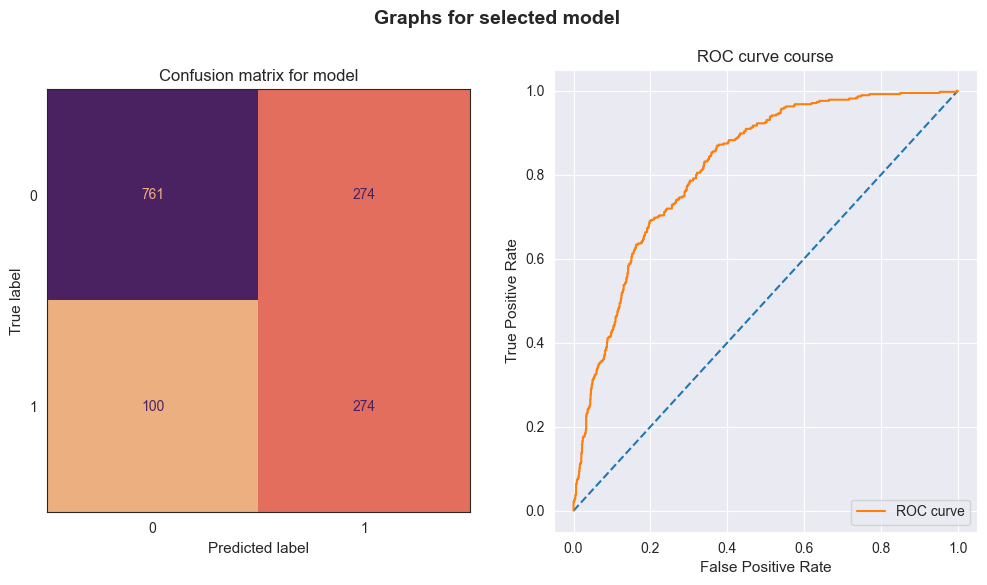

In [32]:
# Getting classification report and plots
logreg_results = model_results_plots(log_reg_optimal_model, X_train_standard, X_test_standard, y_train)

pca_logreg_model, pca_logreg_precision = logreg_results[0], logreg_results[1]
pca_logreg_recall, pca_logreg_f1_score = logreg_results[2], logreg_results[3]
pca_logreg_test_accuracy, pca_logreg_roc_score = logreg_results[4], logreg_results[5]
pca_logreg_roc = logreg_results[6]

<b>Support Vector Classificator (SVC)</b>

In SVC algorithm we are looking for the best model in demanding on different parameters of:

* <b>Kernel</b> ('linear', 'poly', 'rbf', 'sigmoid') - Specifies the kernel type to be used in the algorithm. If a callable is given it is used to pre-compute the kernel matrix from data matrices; that matrix should be an array of shape (n_samples, n_samples).

* <b>C</b> - Regularization parameter. The strength of the regularization is inversely proportional to C. Must be strictly positive. The penalty is a squared l2 penalty. We chose values between 1 and 5.

* <b>Gamma</b> ('scale', 'auto') - Coefficient for kernels: 'rbf', 'poly' and 'sigmoid'. When 'scale' is passed then gamma is equal to 1 / (number of features * X.var()) as value of gamma, when ‘auto’, uses (1 / number of features).

In [338]:
# Defined and create simple random forest classiefier model
linear_svc = SVC()

# Grid (dictionary) for the hyperparameters of the model like C - regularization strength or penalty
params_linear_svc = {'kernel' : ['linear', 'poly', 'rbf', 'sigmoid'], 'C' : list(range(1, 5)), 
                     'gamma' : ['scale', 'auto']}

# Using Random Search algorithm for finding best parameters
random_search_linear_svc = RandomizedSearchCV(linear_svc, param_distributions = params_linear_svc, cv = CV, 
                                           n_jobs = -1, n_iter = 20, random_state = 42, return_train_score = True)

# Fitting the model to trained data
random_search_linear_svc.fit(X_train_standard, y_train)
print('Best score:', random_search_linear_svc.best_score_)
print('Best parameters:', random_search_linear_svc.best_params_)

Best score: 0.8270129798059453
Best parameters: {'kernel': 'rbf', 'gamma': 'auto', 'C': 4}


In [33]:
# Fitting model ones more, but with the best parameters
svc_optimal_model = SVC(kernel = 'rbf', gamma = 'auto', C = 4, probability = True)
svc_optimal_model.fit(X_train_standard, y_train)

SVC(C=4, gamma='auto', probability=True)

Train dataset accuracy:  0.8923653056293791
Train dataset AUC: 0.9515259798120648

Test dataset accuracy:  0.7345635202271115
Test dataset AUC: 0.7725051021726214

Classification report:
              precision    recall  f1-score   support

           0       0.85      0.77      0.81      1035
           1       0.50      0.63      0.56       374

    accuracy                           0.73      1409
   macro avg       0.68      0.70      0.68      1409
weighted avg       0.76      0.73      0.74      1409




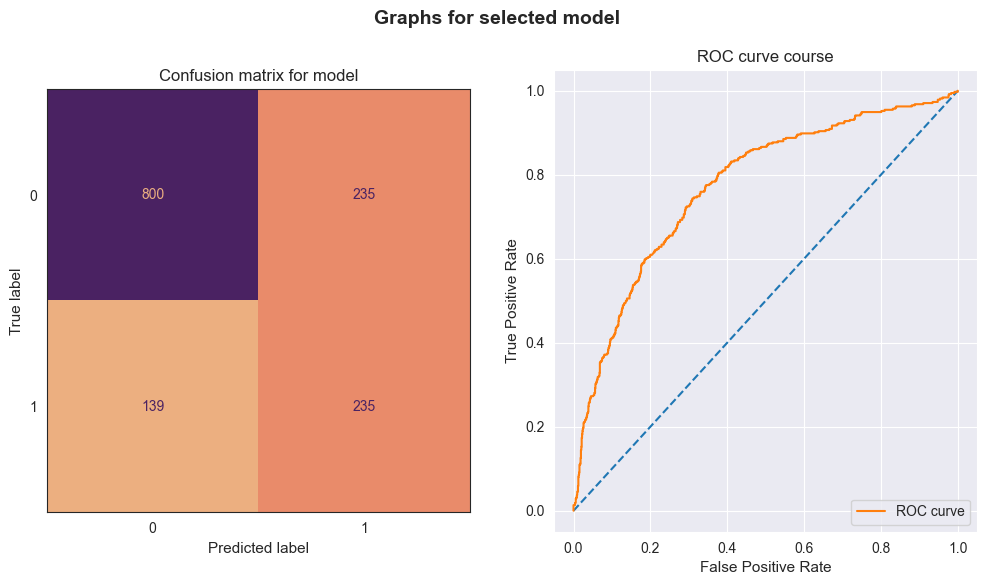

In [34]:
# Getting classification report and plots
svc_results = model_results_plots(svc_optimal_model, X_train_standard, X_test_standard, y_train)

pca_svc_model, pca_svc_precision = svc_results[0], svc_results[1]
pca_svc_recall, pca_svc_f1_score = svc_results[2], svc_results[3]
pca_svc_test_accuracy, pca_svc_roc_score = svc_results[4], svc_results[5]
pca_svc_roc = svc_results[6]

<b>Bagging (based on Decision Tree Classifier)</b>

For Bagging we use base of Decision Tree Clasiffier and we are changing the parameters:

* max_samples - The number of samples to draw from X to train each base estimator (with replacement),

* n_estimators - The number of base estimators in the ensemble.

In [341]:
# Defined and create simple random forest classiefier model
bagging = BaggingClassifier(DecisionTreeClassifier())

# Grid (dictionary) for the hyperparameters of the model like C - regularization strength or penalty
params_bagging = {'n_estimators' : [300, 500, 800], 'max_samples' : [300, 500]}

# Using Random Search algorithm for finding best parameters
random_search_bagging = RandomizedSearchCV(bagging, param_distributions = params_bagging, cv = CV, 
                                           n_jobs = -1, n_iter = 20, random_state = 42, return_train_score = True)

# Fitting the model to trained data
random_search_bagging.fit(X_train_standard, y_train)
print('Best score:', random_search_bagging.best_score_)
print('Best parameters:', random_search_bagging.best_params_)

Best score: 0.7878717382542103
Best parameters: {'n_estimators': 800, 'max_samples': 500}


In [35]:
bagging_optimal_model = BaggingClassifier(estimator = DecisionTreeClassifier(), n_estimators = 800, max_samples = 500)
bagging_optimal_model.fit(X_train_standard, y_train)

BaggingClassifier(estimator=DecisionTreeClassifier(), max_samples=500,
                  n_estimators=800)

Train dataset accuracy:  0.8175887895626963
Train dataset AUC: 0.9007756027687532

Test dataset accuracy:  0.7459190915542938
Test dataset AUC: 0.817289260895399

Classification report:
              precision    recall  f1-score   support

           0       0.89      0.75      0.81      1035
           1       0.52      0.73      0.60       374

    accuracy                           0.75      1409
   macro avg       0.70      0.74      0.71      1409
weighted avg       0.79      0.75      0.76      1409




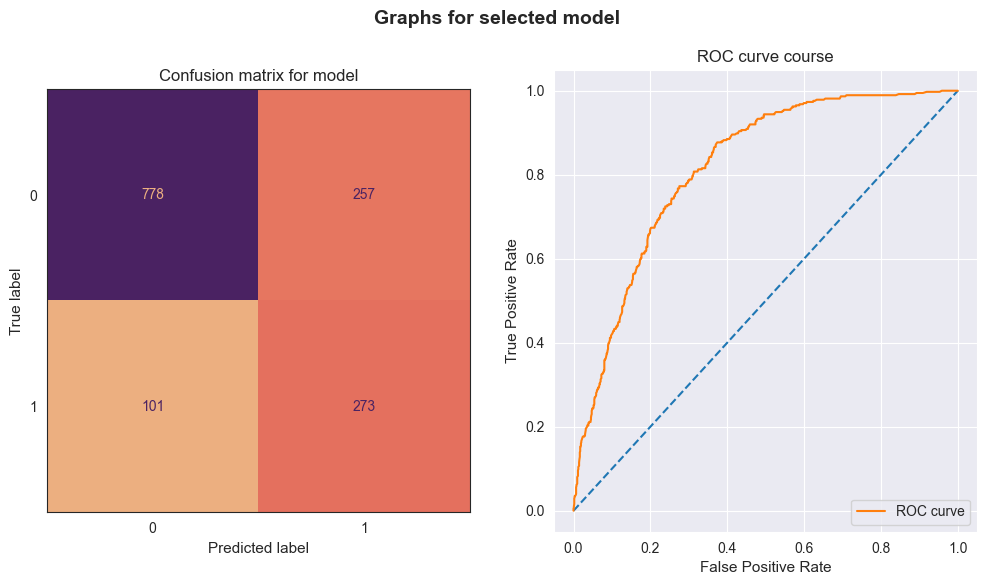

In [36]:
# Getting classification report and plots
bagging_results = model_results_plots(bagging_optimal_model, X_train_standard, X_test_standard, y_train)

pca_bagging_model, pca_bagging_precision = bagging_results[0], bagging_results[1]
pca_bagging_recall, pca_bagging_f1_score = bagging_results[2], bagging_results[3]
pca_bagging_test_accuracy, pca_bagging_roc_score = bagging_results[4], bagging_results[5]
pca_bagging_roc = bagging_results[6]

<b>Linear Discriminant Analysis (LDA)</b>

For LDA we are checking the performance with cahnging parameters:

* Solver ('svd', ‘lsqr’, ‘eigen’}, default=’svd’) - Solver to use, possible values:
    
    * 'svd' - Singular value decomposition (default). Does not compute the covariance matrix, therefore this solver is recommended for data with a large number of features.
    
    * 'lsqr' - Least squares solution. Can be combined with shrinkage or custom covariance estimator.
    
    * 'eigen' - Eigenvalue decomposition. Can be combined with shrinkage or custom covariance estimator.

* Shrinkage ('auto' or float) - Shrinkage parameter, possible values: None which means no shrinkage or 'auto' which set automatic shrinkage using the Ledoit-Wolf lemma.

In [344]:
# Defined and create simple random forest classiefier model
lda = LinearDiscriminantAnalysis()

# Grid (dictionary) for the hyperparameters of the model like C - regularization strength or penalty
params_lda = {'solver' : ['svd', 'lsqr', 'eigen'], 'shrinkage' : ['auto', 'None']}

# Using Random Search algorithm for finding best parameters
random_search_lda = RandomizedSearchCV(lda, param_distributions = params_lda, cv = CV, 
                                           n_jobs = -1, n_iter = 20, random_state = 42, return_train_score = True)

# Fitting the model to trained data
random_search_lda.fit(X_train_standard, y_train)
print('Best score:', random_search_lda.best_score_)
print('Best parameters:', random_search_lda.best_params_)

Best score: 0.7673387308763997
Best parameters: {'solver': 'lsqr', 'shrinkage': 'auto'}


In [37]:
# Fitting model ones more, but with the best parameters
lda_optimal_model = LinearDiscriminantAnalysis(solver = 'lsqr', shrinkage = 'auto')
lda_optimal_model.fit(X_train_standard, y_train)

LinearDiscriminantAnalysis(shrinkage='auto', solver='lsqr')

Train dataset accuracy:  0.7695095433679633
Train dataset AUC: 0.8502532291584518

Test dataset accuracy:  0.7288857345635202
Test dataset AUC: 0.8223126404712082

Classification report:
              precision    recall  f1-score   support

           0       0.89      0.72      0.80      1035
           1       0.49      0.75      0.60       374

    accuracy                           0.73      1409
   macro avg       0.69      0.74      0.70      1409
weighted avg       0.78      0.73      0.74      1409




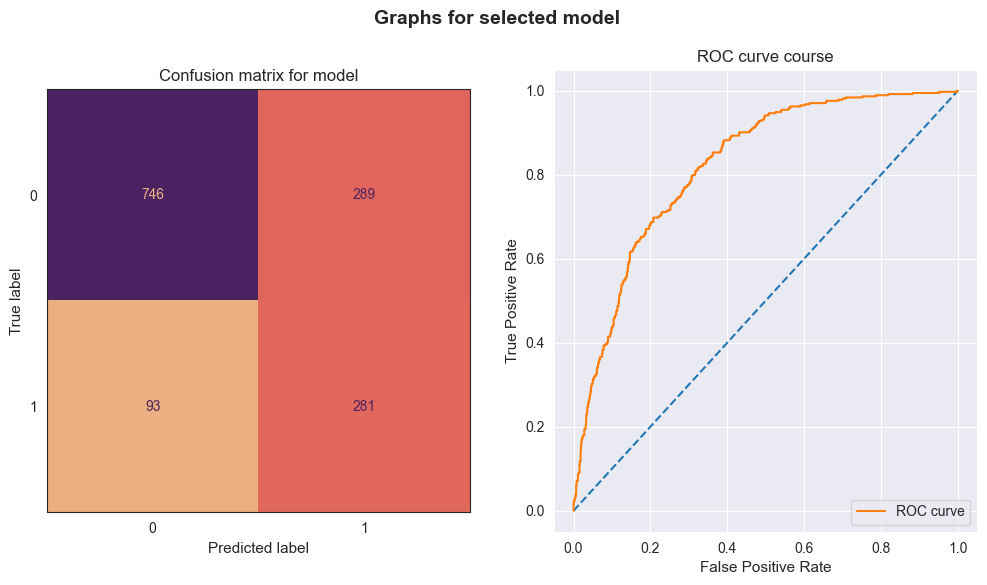

In [38]:
# Getting classification report and plots
lda_results = model_results_plots(lda_optimal_model, X_train_standard, X_test_standard, y_train)

pca_lda_model, pca_lda_precision = lda_results[0], lda_results[1]
pca_lda_recall, pca_lda_f1_score = lda_results[2], lda_results[3]
pca_lda_test_accuracy, pca_lda_roc_score = lda_results[4], lda_results[5]
pca_lda_roc = lda_results[6]

<h4>b) Truncated SVD - Truncated Principal Component Analysis</h4>

In [39]:
features = telco_customer_dummy.drop(['Churn'], axis = 1)
target = telco_customer_dummy['Churn'].astype('int')

In [40]:
# Dataset splitting into train and test data
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size = 0.2, random_state = 42, stratify = target)

# Balancing only train dataset with SMOTE method
oversample = SMOTE(random_state = 42)
X_train, y_train = oversample.fit_resample(X_train, y_train)

X_train.shape, y_train.shape, X_test.shape, y_test.shape

((8278, 40), (8278,), (1409, 40), (1409,))

In [41]:
# Scaling Tenure and Monthly Charges
scaler = StandardScaler()
scaler.fit(X_train)

X_train_std, X_test_std = scaler.transform(X_train), scaler.transform(X_test)

In [49]:
tsvd_red =  TruncatedSVD(n_components = 15)
tsvd_red.fit(X_train_std)

# Transform X_test with mean and std from train set
X_train_standard, X_test_standard = tsvd_red.transform(X_train_std), tsvd_red.transform(X_test_std)

X_train_standard.shape, X_test_standard[0]

((8278, 15),
 array([-1.53417293,  2.05973227, -1.7724764 ,  1.91559599, -1.26245054,
         1.89252059,  2.5783715 ,  1.91886268, -0.55517303,  1.76500185,
         1.96672219,  1.77026015,  0.92935588,  0.0515104 ,  1.58368244]))

Like above, we are going to find the best parametrs and we check possible combinations on the same range as in the PCA subsection.

<b>Logistic Regression</b>

In [50]:
# Defined and create simple logistic regression model
logistic_regression = LogisticRegression(random_state = 42, solver = 'saga')

# Grid (dictionary) for the hyperparameters of the model like C - regularization strength or penalty
params_log_reg = {'C': list(np.arange(1, 10)), 'penalty': ['none', 'l2', 'l1'] , 
                  'class_weight': ['balanced', None]}

# Using Random Search algorithm for finding best parameters
random_search_log_reg = RandomizedSearchCV(logistic_regression, param_distributions = params_log_reg, cv = CV, 
                                           n_jobs = -1, n_iter = 30, random_state = 42, return_train_score = True,
                                           error_score = 'raise')

# Fitting the model to trained data
random_search_log_reg.fit(X_train_standard, y_train)
print('Best score:', random_search_log_reg.best_score_)
print('Best parameters:', random_search_log_reg.best_params_)

Best score: 0.766250898130137
Best parameters: {'penalty': 'l2', 'class_weight': None, 'C': 9}


In [51]:
# Fitting model ones more, but with the best parameters
log_reg_optimal_model= LogisticRegression(random_state = 42, penalty= 'l2', class_weight = None, C = 9)
log_reg_optimal_model.fit(X_train_standard, y_train)

LogisticRegression(C=9, random_state=42)

Train dataset accuracy:  0.7679391157284369
Train dataset AUC: 0.8492704678173971

Test dataset accuracy:  0.7366926898509581
Test dataset AUC: 0.8182670696737193

Classification report:
              precision    recall  f1-score   support

           0       0.88      0.74      0.81      1035
           1       0.50      0.73      0.59       374

    accuracy                           0.74      1409
   macro avg       0.69      0.73      0.70      1409
weighted avg       0.78      0.74      0.75      1409




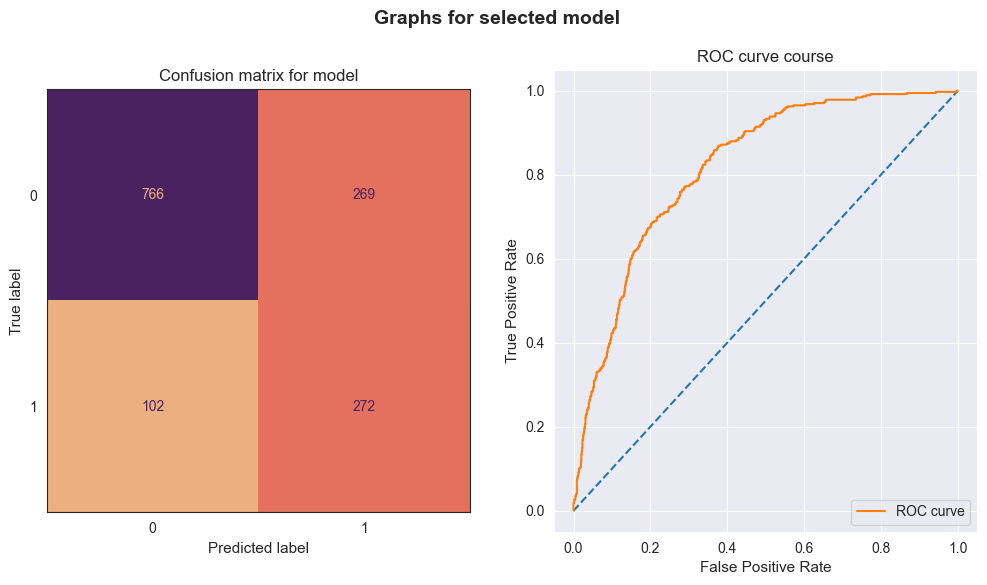

In [52]:
# Getting classification report and plots
logreg_results = model_results_plots(log_reg_optimal_model, X_train_standard, X_test_standard, y_train)

tsvd_logreg_model, tsvd_logreg_precision = logreg_results[0], logreg_results[1]
tsvd_logreg_recall, tsvd_logreg_f1_score = logreg_results[2], logreg_results[3]
tsvd_logreg_test_accuracy, tsvd_logreg_roc_score = logreg_results[4], logreg_results[5]
tsvd_logreg_roc = logreg_results[6]

<b>Support Vector Classificator (SVC)</b>

In [373]:
# Defined and create simple random forest classiefier model
linear_svc = SVC()

# Grid (dictionary) for the hyperparameters of the model like C - regularization strength or penalty
params_linear_svc = {'kernel' : ['linear', 'poly', 'rbf', 'sigmoid'], 'C' : list(range(1, 5)), 
                     'gamma' : ['scale', 'auto']}

# Using Random Search algorithm for finding best parameters
random_search_linear_svc = RandomizedSearchCV(linear_svc, param_distributions = params_linear_svc, cv = CV, 
                                           n_jobs = -1, n_iter = 20, random_state = 42, return_train_score = True)

# Fitting the model to trained data
random_search_linear_svc.fit(X_train_standard, y_train)
print('Best score:', random_search_linear_svc.best_score_)
print('Best parameters:', random_search_linear_svc.best_params_)

Best score: 0.8243545146008213
Best parameters: {'kernel': 'rbf', 'gamma': 'auto', 'C': 4}


In [53]:
# Fitting model ones more, but with the best parameters
svc_optimal_model= SVC(kernel = 'rbf', gamma = 'auto', C = 4, probability = True)
svc_optimal_model.fit(X_train_standard, y_train)

SVC(C=4, gamma='auto', probability=True)

Train dataset accuracy:  0.89091568011597
Train dataset AUC: 0.9497941810792058

Test dataset accuracy:  0.7352732434350603
Test dataset AUC: 0.7718127567232426

Classification report:
              precision    recall  f1-score   support

           0       0.85      0.78      0.81      1035
           1       0.50      0.62      0.56       374

    accuracy                           0.74      1409
   macro avg       0.68      0.70      0.68      1409
weighted avg       0.76      0.74      0.74      1409




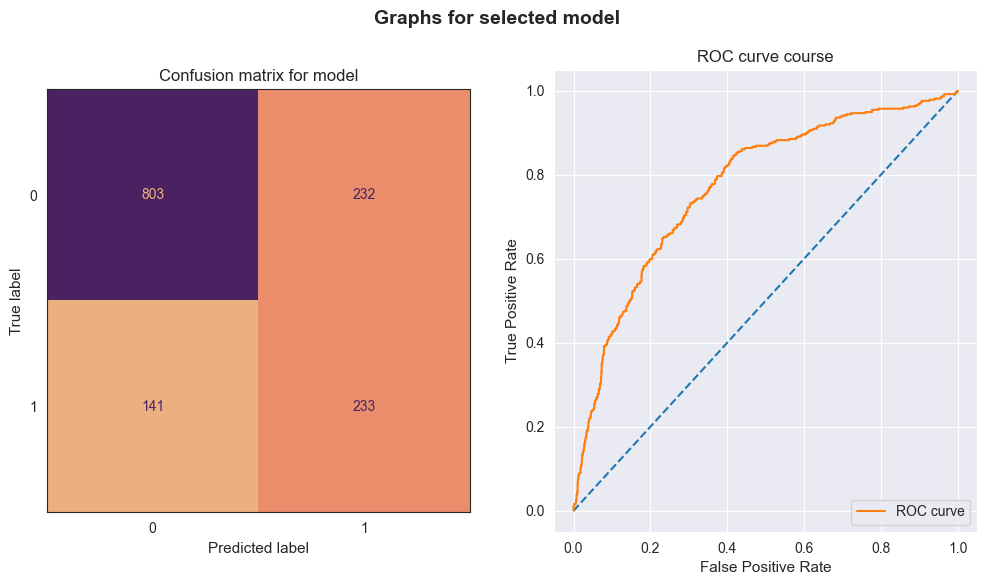

In [54]:
# Getting classification report and plots
svc_results = model_results_plots(svc_optimal_model, X_train_standard, X_test_standard, y_train)

tsvd_svc_model, tsvd_svc_precision = svc_results[0], svc_results[1]
tsvd_svc_recall, tsvd_svc_f1_score = svc_results[2], svc_results[3]
tsvd_svc_test_accuracy, tsvd_svc_roc_score = svc_results[4], svc_results[5]
tsvd_svc_roc = svc_results[6]

<b>Bagging (based on Decision Tree Classifier)</b>

In [377]:
# Defined and create simple random forest classiefier model
bagging = BaggingClassifier(DecisionTreeClassifier())

# Grid (dictionary) for the hyperparameters of the model like C - regularization strength or penalty
params_bagging = {'n_estimators' : [300, 500, 800], 'max_samples' : [300, 500]}

# Using Random Search algorithm for finding best parameters
random_search_bagging = RandomizedSearchCV(bagging, param_distributions = params_bagging, cv = CV, 
                                           n_jobs = -1, n_iter = 20, random_state = 42, return_train_score = True)

# Fitting the model to trained data
random_search_bagging.fit(X_train_standard, y_train)
print('Best score:', random_search_bagging.best_score_)
print('Best parameters:', random_search_bagging.best_params_)

Best score: 0.8086534473593513
Best parameters: {'n_estimators': 800, 'max_samples': 500}


In [55]:
bagging_optimal_model = BaggingClassifier(estimator = DecisionTreeClassifier(), n_estimators = 800, max_samples = 500)
bagging_optimal_model.fit(X_train_standard, y_train)

BaggingClassifier(estimator=DecisionTreeClassifier(), max_samples=500,
                  n_estimators=800)

Train dataset accuracy:  0.8357091084803092
Train dataset AUC: 0.9140385904858126

Test dataset accuracy:  0.7629524485450674
Test dataset AUC: 0.8294556821411041

Classification report:
              precision    recall  f1-score   support

           0       0.88      0.79      0.83      1035
           1       0.54      0.70      0.61       374

    accuracy                           0.76      1409
   macro avg       0.71      0.74      0.72      1409
weighted avg       0.79      0.76      0.77      1409




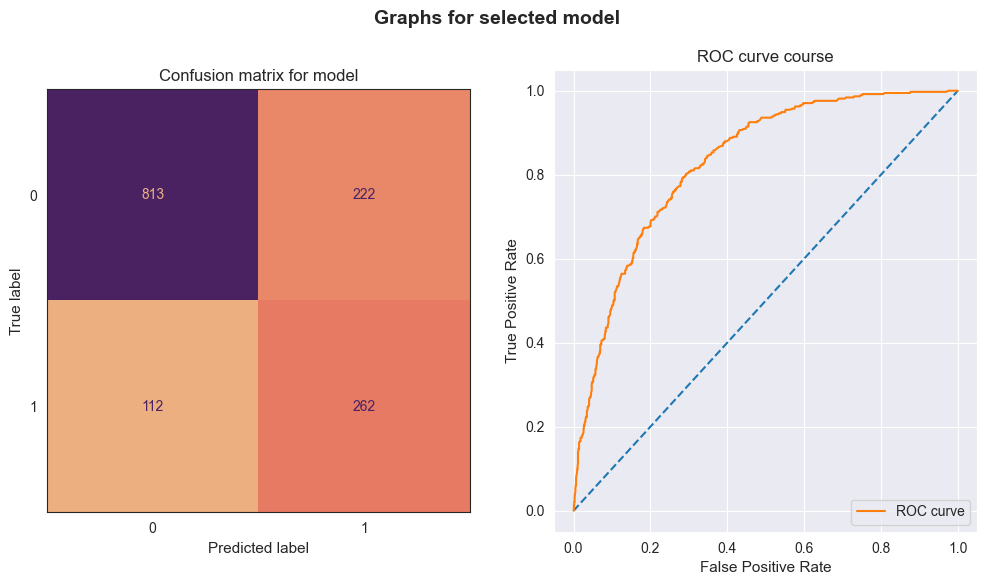

In [56]:
# Getting classification report and plots
bagging_results = model_results_plots(bagging_optimal_model, X_train_standard, X_test_standard, y_train)

tsvd_bagging_model, tsvd_bagging_precision = bagging_results[0], bagging_results[1]
tsvd_bagging_recall, tsvd_bagging_f1_score = bagging_results[2], bagging_results[3]
tsvd_bagging_test_accuracy, tsvd_bagging_roc_score = bagging_results[4], bagging_results[5]
tsvd_bagging_roc = bagging_results[6]

<b>Linear Discriminant Analysis (LDA)</b>

In [380]:
# Defined and create simple random forest classiefier model
lda = LinearDiscriminantAnalysis()

# Grid (dictionary) for the hyperparameters of the model like C - regularization strength or penalty
params_lda = {'solver' : ['svd', 'lsqr', 'eigen'], 'shrinkage' : ['auto', 'None']}

# Using Random Search algorithm for finding best parameters
random_search_lda = RandomizedSearchCV(lda, param_distributions = params_lda, cv = CV, 
                                           n_jobs = -1, n_iter = 20, random_state = 42, return_train_score = True)

# Fitting the model to trained data
random_search_lda.fit(X_train_standard, y_train)
print('Best score:', random_search_lda.best_score_)
print('Best parameters:', random_search_lda.best_params_)

Best score: 0.7652842764429957
Best parameters: {'solver': 'lsqr', 'shrinkage': 'auto'}


In [57]:
# Fitting model ones more, but with the best parameters
lda_optimal_model = LinearDiscriminantAnalysis(solver = 'lsqr', shrinkage = 'auto')
lda_optimal_model.fit(X_train_standard, y_train)

LinearDiscriminantAnalysis(shrinkage='auto', solver='lsqr')

Train dataset accuracy:  0.76685189659338
Train dataset AUC: 0.84911531340753

Test dataset accuracy:  0.7288857345635202
Test dataset AUC: 0.8205404427910822

Classification report:
              precision    recall  f1-score   support

           0       0.89      0.72      0.80      1035
           1       0.49      0.75      0.60       374

    accuracy                           0.73      1409
   macro avg       0.69      0.74      0.70      1409
weighted avg       0.78      0.73      0.74      1409




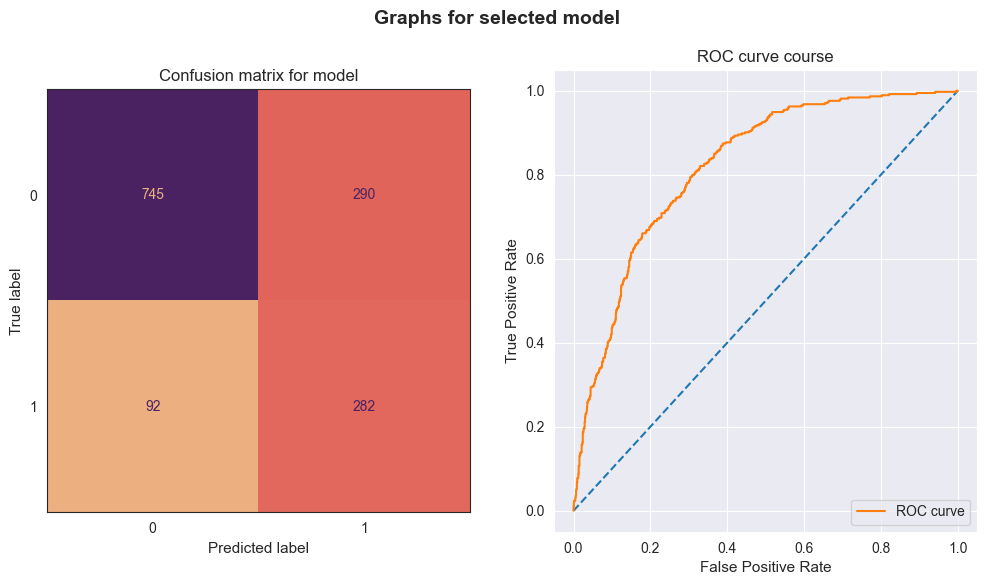

In [58]:
# Getting classification report and plots
lda_results = model_results_plots(lda_optimal_model, X_train_standard, X_test_standard, y_train)

tsvd_lda_model, tsvd_lda_precision = lda_results[0], lda_results[1]
tsvd_lda_recall, tsvd_lda_f1_score = lda_results[2], lda_results[3]
tsvd_lda_test_accuracy, tsvd_lda_roc_score = lda_results[4], lda_results[5]
tsvd_lda_roc = lda_results[6]

<h4>c) FAMD - Factor analysis of mixed data</h4>

In [72]:
telco_dim_cat.columns

Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure',
       'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod',
       'MonthlyCharges', 'TotalCharges'],
      dtype='object')

In [73]:
features = telco_dim_cat
target = telco_customer_dummy['Churn'].astype('int')

In this method we must change the order of our data preprocessing before conducting classification algorithms.

In [74]:
import prince
# Dataset splitting into train and test data
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size = 0.2, random_state = 42, stratify = target)

famd_red = prince.FAMD(n_components = 13, n_iter = 3, copy = True, 
                   check_input = True, engine = 'auto', 
                   random_state = 42)

famd_red.fit(X_train)
X_train, X_test = famd_red.transform(X_train), famd_red.transform(X_test)

In [69]:
scaler = StandardScaler()
scaler.fit(X_train)

X_train_std, X_test_std = scaler.transform(X_train), scaler.transform(X_test)

In [75]:
# Balancing only train dataset with SMOTE method
oversample = SMOTE(random_state = 42)
X_train, y_train = oversample.fit_resample(X_train, y_train)

X_train.shape, y_train.shape, X_test_std.shape, y_test.shape

((8278, 13), (8278,), (1409, 13), (1409,))

In [76]:
X_train_standard, X_test_standard = X_train, X_test

<b>Logistic Regression</b>

In [77]:
# Defined and create simple logistic regression model
logistic_regression = LogisticRegression(random_state = 42)

# Grid (dictionary) for the hyperparameters of the model like C - regularization strength or penalty
params_log_reg = {'C': list(np.arange(1, 10)), 'penalty': ['none', 'l2'] , 
                  'class_weight': ['balanced', None]}

# Using Random Search algorithm for finding best parameters
random_search_log_reg = RandomizedSearchCV(logistic_regression, param_distributions = params_log_reg, cv = CV, 
                                           n_jobs = -1, n_iter = 30, random_state = 42, return_train_score = True,
                                           error_score = 'raise')

# Fitting the model to trained data
random_search_log_reg.fit(X_train_standard, y_train)
print('Best score:', random_search_log_reg.best_score_)
print('Best parameters:', random_search_log_reg.best_params_)

Best score: 0.7686660649924937
Best parameters: {'penalty': 'l2', 'class_weight': 'balanced', 'C': 1}


In [78]:
# Fitting model ones more, but with the best parameters
log_reg_optimal_model= LogisticRegression(random_state = 42, penalty= 'l2', class_weight = 'balanced', C = 1)
log_reg_optimal_model.fit(X_train_standard, y_train)

LogisticRegression(C=1, class_weight='balanced', random_state=42)

Train dataset accuracy:  0.7697511476201981
Train dataset AUC: 0.8480522313486508

Test dataset accuracy:  0.7366926898509581
Test dataset AUC: 0.8344829367847271

Classification report:
              precision    recall  f1-score   support

           0       0.89      0.74      0.80      1035
           1       0.50      0.74      0.60       374

    accuracy                           0.74      1409
   macro avg       0.69      0.74      0.70      1409
weighted avg       0.78      0.74      0.75      1409




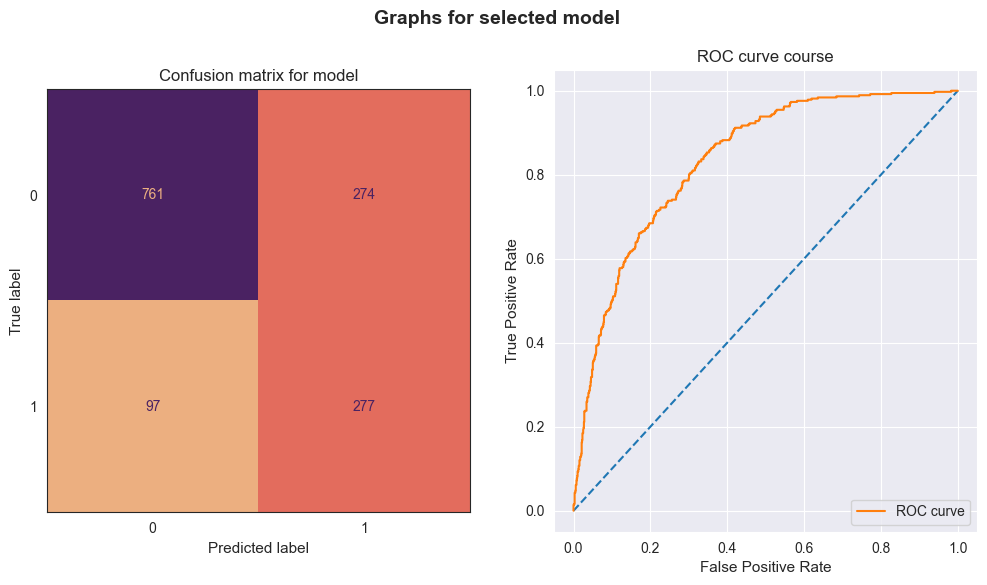

In [79]:
# Getting classification report and plots
logreg_results = model_results_plots(log_reg_optimal_model, X_train_standard, X_test_standard, y_train)

famd_logreg_model, famd_logreg_precision = logreg_results[0], logreg_results[1]
famd_logreg_recall, famd_logreg_f1_score = logreg_results[2], logreg_results[3]
famd_logreg_test_accuracy, famd_logreg_roc_score = logreg_results[4], logreg_results[5]
famd_logreg_roc = logreg_results[6]

<b>Support Vector Classificator (SVC)</b>

In [80]:
# Defined and create simple random forest classiefier model
linear_svc = SVC()

# Grid (dictionary) for the hyperparameters of the model like C - regularization strength or penalty
params_linear_svc = {'kernel' : ['linear', 'poly', 'rbf', 'sigmoid'], 'C' : list(range(1, 5)), 
                     'gamma' : ['scale', 'auto']}

# Using Random Search algorithm for finding best parameters
random_search_linear_svc = RandomizedSearchCV(linear_svc, param_distributions = params_linear_svc, cv = CV, 
                                           n_jobs = -1, n_iter = 20, random_state = 42, return_train_score = True)

# Fitting the model to trained data
random_search_linear_svc.fit(X_train_standard, y_train)
print('Best score:', random_search_linear_svc.best_score_)
print('Best parameters:', random_search_linear_svc.best_params_)

Best score: 0.7923448644480662
Best parameters: {'kernel': 'rbf', 'gamma': 'scale', 'C': 4}


In [81]:
# Fitting model ones more, but with the best parameters
svc_optimal_model= SVC(kernel = 'rbf', gamma = 'scale', C = 4, probability = True)
svc_optimal_model.fit(X_train_standard, y_train)

SVC(C=4, probability=True)

Train dataset accuracy:  0.8225416767335105
Train dataset AUC: 0.8981229176664193

Test dataset accuracy:  0.7494677075940384
Test dataset AUC: 0.8129608101475109

Classification report:
              precision    recall  f1-score   support

           0       0.89      0.75      0.82      1035
           1       0.52      0.74      0.61       374

    accuracy                           0.75      1409
   macro avg       0.70      0.75      0.71      1409
weighted avg       0.79      0.75      0.76      1409




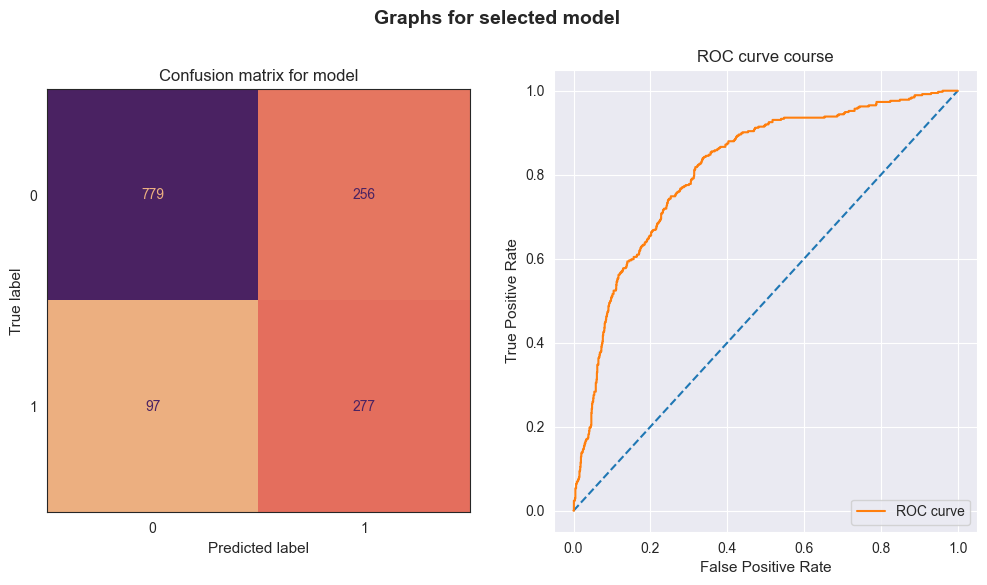

In [82]:
# Getting classification report and plots
svc_results = model_results_plots(svc_optimal_model, X_train_standard, X_test_standard, y_train)

famd_svc_model, famd_svc_precision = svc_results[0], svc_results[1]
famd_svc_recall, famd_svc_f1_score = svc_results[2], svc_results[3]
famd_svc_test_accuracy, famd_svc_roc_score = svc_results[4], svc_results[5]
famd_svc_roc = svc_results[6]

<b>Bagging (based on Decision Tree Classifier)</b>

In [83]:
# Defined and create simple random forest classiefier model
bagging = BaggingClassifier(DecisionTreeClassifier())

# Grid (dictionary) for the hyperparameters of the model like C - regularization strength or penalty
params_bagging = {'n_estimators' : [300, 500, 800], 'max_samples' : [300, 500]}

# Using Random Search algorithm for finding best parameters
random_search_bagging = RandomizedSearchCV(bagging, param_distributions = params_bagging, cv = CV, 
                                           n_jobs = -1, n_iter = 20, random_state = 42, return_train_score = True)

# Fitting the model to trained data
random_search_bagging.fit(X_train_standard, y_train)
print('Best score:', random_search_bagging.best_score_)
print('Best parameters:', random_search_bagging.best_params_)

Best score: 0.7972967013067429
Best parameters: {'n_estimators': 800, 'max_samples': 500}


In [84]:
bagging_optimal_model = BaggingClassifier(estimator = DecisionTreeClassifier(), n_estimators = 800, max_samples = 500)
bagging_optimal_model.fit(X_train_standard, y_train)

BaggingClassifier(estimator=DecisionTreeClassifier(), max_samples=500,
                  n_estimators=800)

Train dataset accuracy:  0.8204880405895144
Train dataset AUC: 0.9032014227040635

Test dataset accuracy:  0.7537260468417317
Test dataset AUC: 0.8319228086491512

Classification report:
              precision    recall  f1-score   support

           0       0.89      0.76      0.82      1035
           1       0.53      0.74      0.61       374

    accuracy                           0.75      1409
   macro avg       0.71      0.75      0.72      1409
weighted avg       0.79      0.75      0.76      1409




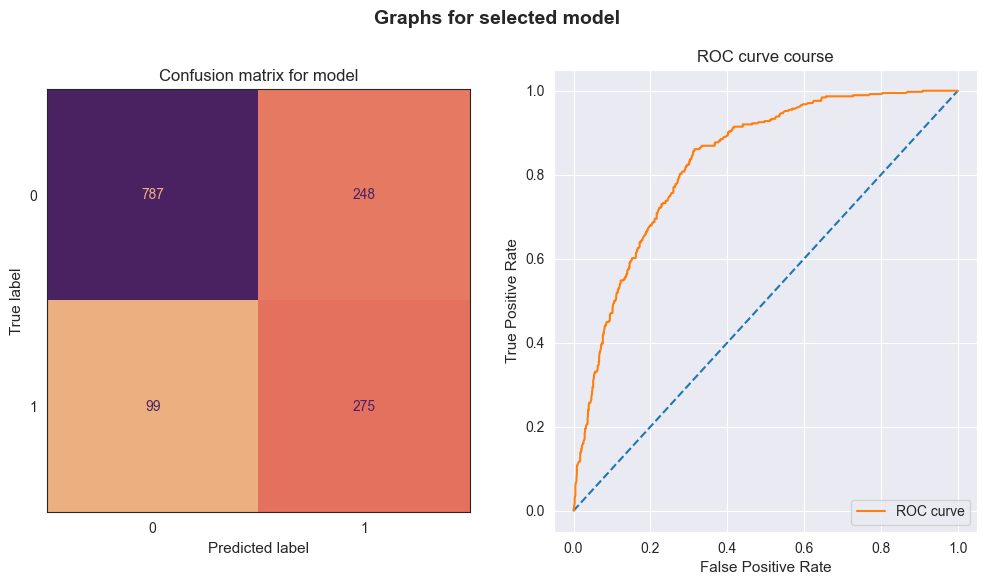

In [85]:
# Getting classification report and plots
bagging_results = model_results_plots(bagging_optimal_model, X_train_standard, X_test_standard, y_train)

famd_bagging_model, famd_bagging_precision = bagging_results[0], bagging_results[1]
famd_bagging_recall, famd_bagging_f1_score = bagging_results[2], bagging_results[3]
famd_bagging_test_accuracy, famd_bagging_roc_score = bagging_results[4], bagging_results[5]
famd_bagging_roc = bagging_results[6]

<b>Linear Discriminant Analysis (LDA)</b>

In [86]:
# Defined and create simple random forest classiefier model
lda = LinearDiscriminantAnalysis()

# Grid (dictionary) for the hyperparameters of the model like C - regularization strength or penalty
params_lda = {'solver' : ['svd', 'lsqr', 'eigen'], 'shrinkage' : ['auto', 'None']}

# Using Random Search algorithm for finding best parameters
random_search_lda = RandomizedSearchCV(lda, param_distributions = params_lda, cv = CV, 
                                           n_jobs = -1, n_iter = 20, random_state = 42, return_train_score = True)

# Fitting the model to trained data
random_search_lda.fit(X_train_standard, y_train)
print('Best score:', random_search_lda.best_score_)
print('Best parameters:', random_search_lda.best_params_)

Best score: 0.7703570322859531
Best parameters: {'solver': 'lsqr', 'shrinkage': 'auto'}


In [87]:
# Fitting model ones more, but with the best parameters
lda_optimal_model = LinearDiscriminantAnalysis(solver = 'lsqr', shrinkage = 'auto')
lda_optimal_model.fit(X_train_standard, y_train)

LinearDiscriminantAnalysis(shrinkage='auto', solver='lsqr')

Train dataset accuracy:  0.7713215752597246
Train dataset AUC: 0.8476623022824685

Test dataset accuracy:  0.7381121362668559
Test dataset AUC: 0.8348678601875531

Classification report:
              precision    recall  f1-score   support

           0       0.89      0.73      0.80      1035
           1       0.50      0.76      0.61       374

    accuracy                           0.74      1409
   macro avg       0.70      0.74      0.71      1409
weighted avg       0.79      0.74      0.75      1409




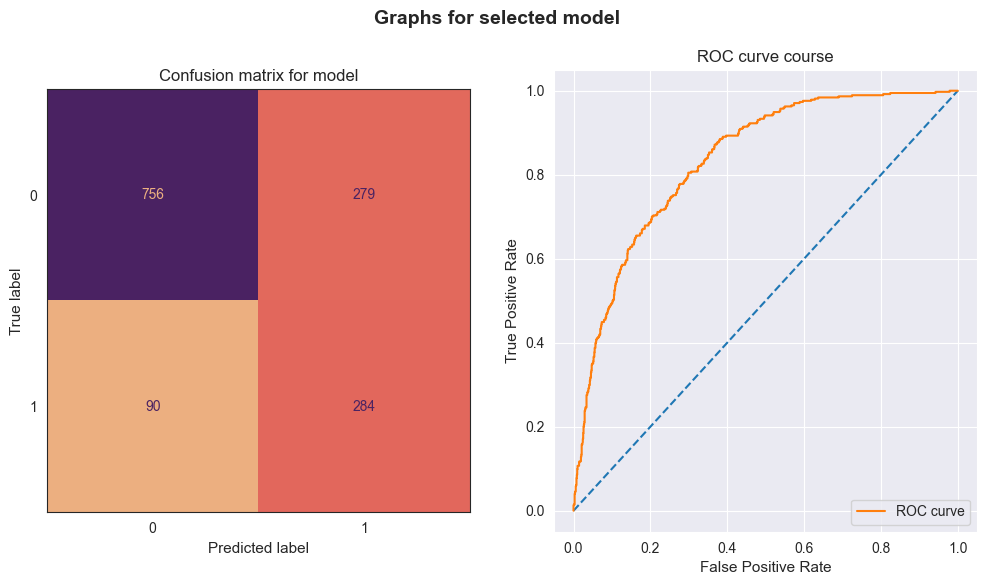

In [88]:
# Getting classification report and plots
lda_results = model_results_plots(lda_optimal_model, X_train_standard, X_test_standard, y_train)

famd_lda_model, famd_lda_precision = lda_results[0], lda_results[1]
famd_lda_recall, famd_lda_f1_score = lda_results[2], lda_results[3]
famd_lda_test_accuracy, famd_lda_roc_score = lda_results[4], lda_results[5]
famd_lda_roc = lda_results[6]

<h3>Methods comparison </h3>

After providing a few models we can compare them with each other on the statistics we gathered earlier and choose the best suited one. We use these ones which was shown during plotting graphs (precision, recall, f1-score, accuracy and ROC AUC score) and also draw a chart with all ROC Curves.

In [89]:
# Creating empty DataFrame to compare all models
results_comparison = pd.DataFrame()

# Single list with results for every statistic
models = ['PCA - Logistic regression', 'PCA - Support Vector Classificator (SVC)', 
          'PCA - Bagging (based on Decison Tree) ', 'PCA - Linear Discriminant Analysis',
          
          'Truncated SVD - Logistic regression', 'Truncated SVD - Support Vector Classificator (SVC)', 
          'Truncated SVD - Bagging (based on Decison Tree) ', 'Truncated SVD - Linear Discriminant Analysis',
          
          'FAMD - Logistic regression', 'FAMD - Support Vector Classificator (SVC)', 
          'FAMD - Bagging (based on Decison Tree) ', 'FAMD - Linear Discriminant Analysis']

In [90]:
precision = [pca_logreg_precision, pca_svc_precision,
             pca_bagging_precision, pca_lda_precision,
             
             tsvd_logreg_precision, tsvd_svc_precision,
             tsvd_bagging_precision, tsvd_lda_precision,
             
             famd_logreg_precision, famd_svc_precision,
             famd_bagging_precision, famd_lda_precision]

In [91]:
recall = [pca_logreg_recall, pca_svc_recall,
          pca_bagging_recall, pca_lda_recall,
             
          tsvd_logreg_recall, tsvd_svc_recall,
          tsvd_bagging_recall, tsvd_lda_recall,
             
          famd_logreg_recall, famd_svc_recall,
          famd_bagging_recall, famd_lda_recall]

In [92]:
f1_score = [pca_logreg_f1_score, pca_svc_f1_score,
             pca_bagging_f1_score, pca_lda_f1_score,
             
             tsvd_logreg_f1_score, tsvd_svc_f1_score,
             tsvd_bagging_f1_score, tsvd_lda_f1_score,
             
             famd_logreg_f1_score, famd_svc_f1_score,
             famd_bagging_f1_score, famd_lda_f1_score]

In [96]:
test_accuracy = [pca_logreg_test_accuracy, pca_svc_test_accuracy,
                 pca_bagging_test_accuracy, pca_lda_test_accuracy,
             
                 tsvd_logreg_test_accuracy, tsvd_svc_test_accuracy,
                 tsvd_bagging_test_accuracy, tsvd_lda_test_accuracy,
             
                 famd_logreg_test_accuracy, famd_svc_test_accuracy,
                 famd_bagging_test_accuracy, famd_lda_test_accuracy]

In [97]:
roc_auc_score = [pca_logreg_roc_score, pca_svc_roc_score,
                 pca_bagging_roc_score, pca_lda_roc_score,
             
                 tsvd_logreg_roc_score, tsvd_svc_roc_score,
                 tsvd_bagging_roc_score, tsvd_lda_roc_score,
             
                 famd_logreg_roc_score, famd_svc_roc_score,
                 famd_bagging_roc_score, famd_lda_roc_score]

In [93]:
# Graphical part
roc_auc_plot = [pca_logreg_roc, pca_svc_roc,
                pca_bagging_roc, pca_lda_roc,
             
                tsvd_logreg_roc, tsvd_svc_roc,
                tsvd_bagging_roc, tsvd_lda_roc,
             
                famd_logreg_roc, famd_svc_roc,
                famd_bagging_roc, famd_lda_roc]

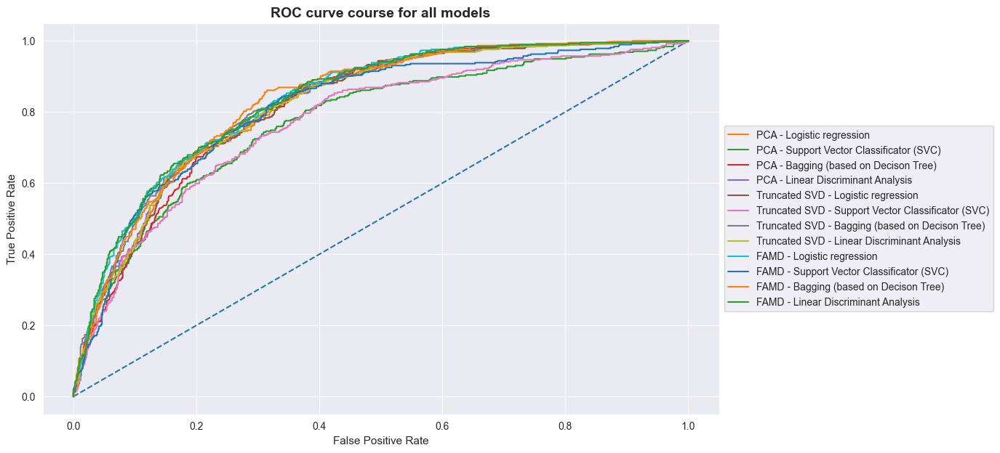

In [94]:
# ROC Curve
sns.set_style('darkgrid')
fig = plt.figure(figsize = (12, 7)) 

plt.plot([0, 1], [0, 1], linestyle = '--')

for i in range(len(roc_auc_plot)):
    fpr, tpr, thresholds = roc_auc_plot[i]
    label = models[i]
    plt.plot(fpr, tpr, label = label)

plt.xlabel('False Positive Rate', fontsize = 11)
plt.ylabel('True Positive Rate', fontsize = 11)
plt.title('ROC curve course for all models', fontsize = 14, weight = 'bold')

plt.legend(loc = 'center left', bbox_to_anchor = (1, 0.5), fontsize = 10)
plt.show()

In [98]:
# Completing the information about all models
results_comparison['Model'] = models

results_comparison['Precision'] = precision
results_comparison['Recall'] = recall
results_comparison['F1 Score'] = f1_score

results_comparison['Test accuracy'] = test_accuracy
results_comparison['Test ROC AUC Score'] = roc_auc_score

In [99]:
# Presenting results
results_comparison.style.background_gradient(cmap = 'Greens')

,Model,Precision,Recall,F1 Score,Test accuracy,Test ROC AUC Score
0,PCA - Logistic regression,0.500000,0.732620,0.594360,0.734564,0.820380
1,PCA - Support Vector Classificator (SVC),0.500000,0.628342,0.556872,0.734564,0.772505
2,PCA - Bagging (based on Decison Tree),0.515094,0.729947,0.603982,0.745919,0.817289
3,PCA - Linear Discriminant Analysis,0.492982,0.751337,0.595339,0.728886,0.822313
4,Truncated SVD - Logistic regression,0.502773,0.727273,0.594536,0.736693,0.818267
5,Truncated SVD - Support Vector Classificator (SVC),0.501075,0.622995,0.555423,0.735273,0.771813
6,Truncated SVD - Bagging (based on Decison Tree),0.541322,0.700535,0.610723,0.762952,0.829456
7,Truncated SVD - Linear Discriminant Analysis,0.493007,0.754011,0.596195,0.728886,0.820540
8,FAMD - Logistic regression,0.502722,0.740642,0.598919,0.736693,0.834483
9,FAMD - Support Vector Classificator (SVC),0.519700,0.740642,0.610805,0.749468,0.812961


In our case choosing the right metric is not as clear as we thought about it earlier. The easiest way would be choice the mothid which gives us the highest accuracy on the test set, but it is not the best one. Also both precision and recall are not enough, because of the fact that because precision informs us to what extent we can trust our positive predictions in a given class, and recall informs us how many observations we lost for a given class.

However, in our case we more focus on the <b>F1-score</b> and <b>ROC AUC Score</b> metrics, which combine in some way the results between precision and recall and calculate the harmonic mean based on these two statistics to respect both. ROC AUC Score is often used to comparison the classification models, beacuse it the diagnostic capacity of the binary classifier system because its discrimination threshold varies. 

<b>Choice of the best metric</b>

Using these two metrics the best results are given by <b>Factor Analysis of Mixed Data</b>, which is not a suprise, because in comparison to PCA and Truncated SVD this is a method dedicated to work with categorical data. For two other methods we must convert categorical columns into dummy column using One Hot or Label encoders in Python, what was not necessery in FAMD. The F1-Score is for FAMD in every case is bigger than <b>0.595</b> and ROC AUC Score is bigger than <b>0.81</b> - in both it has the lowest level of this two stats. The best performance was for FAMD and Bagging, when we obtained <b>0.613</b> F1-Score and <b>0.832</b> It is worth to mark that for every dimension reduction method Bagging usually is the best model, but models based on <b>Logistic Regrresson</b> and Linear Discrimient Analysis are very close to it.

The results for us are very similar to the these before performing dimension reduction - sometimes the results are lower in test accuracy and precision, but the recall is usually higher. In regard of ROC AUC score the results are also similar, but there has been a change in our approach. In the previous part of project we train the data scaler on the whole dataset, when now we have trained StandardScaler (for normalization) only on the train set, not on train set plus test set. So we assumed before training models in this part that the results can be a little bit worse (but there are similar what is ok).

What is interesting, as we consider telecominucation company, one of the most important metrics in predicting churning is number of clients which we predict to stay, but in reality the decide to give up our services. In this regard we can observe some decrese in this metric what is a surprising fact. In only two cases we are above 110 bad classified clients (who churn bu are predicted to stay with Telco) and often algorithms are between 90 and 110, when in the first part of the project only for <b>Categorical Native Bayes</b> this numbers was so good - only 89 bad decisions (but Categorical Native Bayes did not perform well in other stats).

To summary, however the algorithms did not perform very successfully, we can see an improvement in ROC Score and F1-Score for mostly used methods of dimension reduction and classification. As we can assume before, the best dimension method was FAMD which is stricty recommended for mixed datasets. But there were a little improvment also for PCA and Truncated SVD, so dimension reduction was helpful with increasing effectivness of our approach.

<a name = "6.3."><h3>6.3 Application in connection to cluster analysis</h3> </a>

Now we will perform cluster analysis after dimension reduction. We use two methods of dimension reduction - Principal Component Analysis and Factor Analysis of Mixed Data and two types of cluster analysis - Hierarchical Clustering (Agglomarative Propagation) and Fuzzy Clustering, so we created four analysis.

<a name = "6.3.1"><h3>6.3.1 PCA - Principal Component Analysis </h3> </a>

In [103]:
# Transform data by PCA into 2D
pca_red = PCA(n_components = 15)
pca_red_df = pd.DataFrame(pca_red.fit_transform(telco_dimension))
#pca_red_df['Churn'] = telco_customer_models['Churn']
pca_red_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,-1.305397,-1.750881,1.274963,-0.486746,0.776941,-1.309948,-0.668390,0.641477,0.222085,0.146137,0.524333,-0.286339,0.108816,-0.326200,-0.323349
1,-0.313214,-0.259353,1.452300,0.326482,-0.599183,0.721826,0.125148,-1.098804,0.728662,0.839319,-0.675251,0.717509,0.192299,0.119238,-0.155197
2,-1.161696,-1.536964,1.128760,0.104526,-1.134781,-0.899696,0.111740,0.126597,-0.014909,0.688192,-0.689446,-0.177963,-0.108800,0.344723,0.277686
3,-0.120675,0.345857,2.259566,0.370151,0.407286,0.358947,0.643903,-1.072994,0.267306,0.055723,-0.419350,0.598631,0.164737,0.286773,-0.936991
4,-0.747447,-2.398935,-0.332220,-0.408366,-0.475676,0.355202,-0.241297,-0.312712,-0.200935,-0.001835,0.565591,-0.229036,0.173661,-0.267533,-0.217800


<h4>a) Hierarchical Clustering</h4>

In [116]:
# Agglomerative Clustering for different K
K = range(2, 10)

# List with distortions of the results of clustering
distortions, avg_ss, avg_ch, avg_db = [], [], [], []

# Loop over K to find the best parameter to the model
for i in range(2, 10):
    # K-Means cluster analysis
    agglo = AgglomerativeClustering(n_clusters = i, linkage = 'average')
    #agglo.fit(telco_customer_dummy)

    cluster_labels = agglo.fit_predict(pca_red_df)
    
    silhouette_avg = silhouette_score(pca_red_df, cluster_labels)
    avg_ss.append(silhouette_avg)
    calinski_harabasz = calinski_harabasz_score(pca_red_df, cluster_labels)
    avg_ch.append(calinski_harabasz)
    davies_bouldin = davies_bouldin_score(pca_red_df, cluster_labels)
    avg_db.append(davies_bouldin)
    
    # Printing a summary for every cluster
    print('\nFor n_clusters = {0}: \n--> average silhouette_score is: {1}'.
          format(i, silhouette_avg) +
         '\n--> average calinski_harabasz_score: {0}'.format(calinski_harabasz) +
         '\n--> average davies_bouldin_score: {0}'.format(davies_bouldin))



For n_clusters = 2: 
--> average silhouette_score is: 0.3023622346693265
--> average calinski_harabasz_score: 2678.1363155966383
--> average davies_bouldin_score: 1.1265660813636234

For n_clusters = 3: 
--> average silhouette_score is: 0.29095855157954664
--> average calinski_harabasz_score: 2874.364202840348
--> average davies_bouldin_score: 1.436682065958859

For n_clusters = 4: 
--> average silhouette_score is: 0.2534633355484036
--> average calinski_harabasz_score: 2197.0402613696983
--> average davies_bouldin_score: 1.8311279979255504

For n_clusters = 5: 
--> average silhouette_score is: 0.21277847613266315
--> average calinski_harabasz_score: 1663.8412178222939
--> average davies_bouldin_score: 1.9966422501900536

For n_clusters = 6: 
--> average silhouette_score is: 0.20394466061062716
--> average calinski_harabasz_score: 1383.2761938475396
--> average davies_bouldin_score: 2.1303170485004546

For n_clusters = 7: 
--> average silhouette_score is: 0.19606867392749255
--> avera

In [117]:
# Creating DtaFrame for quick graphical summary
clusters_df = pd.DataFrame()

clusters_df['Number of clusters'] = range(2, 10)
clusters_df['Silhouette score'] = avg_ss
clusters_df['Calinski-Harabasz score'] = avg_ch
clusters_df['Davies-Bouldin score'] = avg_db

clusters_df

,Number of clusters,Silhouette score,Calinski-Harabasz score,Davies-Bouldin score
0,2,0.302362,2678.136316,1.126566
1,3,0.290959,2874.364203,1.436682
2,4,0.253463,2197.040261,1.831128
3,5,0.212778,1663.841218,1.996642
4,6,0.203945,1383.276194,2.130317
5,7,0.196069,1376.104208,2.155848
6,8,0.194248,1193.358537,2.222375
7,9,0.191894,1078.221049,2.379548


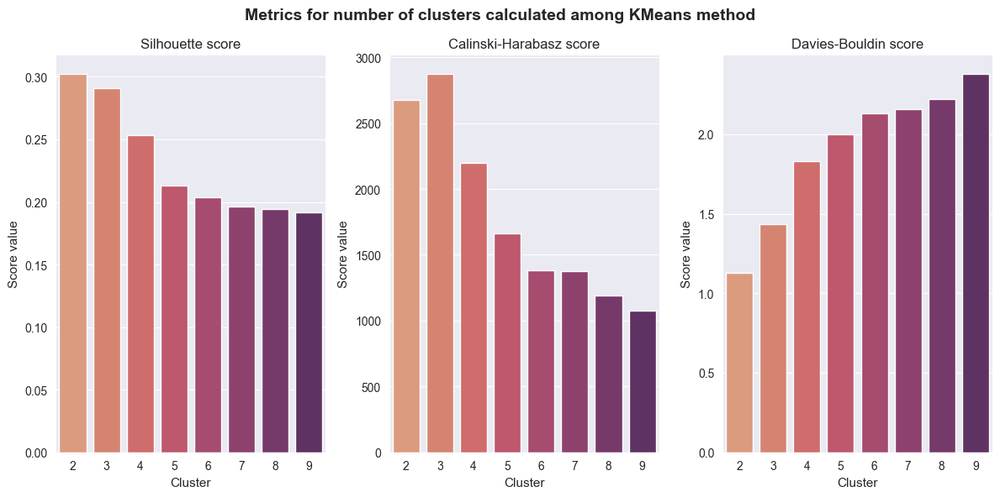

In [118]:
# Subplot for cluster details
sns.set_palette('Spectral')
fig = plt.figure(figsize = (12, 6))

ax1 = fig.add_subplot(131)
sns.barplot(data = clusters_df, x = 'Number of clusters', y = 'Silhouette score', ax = ax1, palette = 'flare')
ax1.set_xlabel('Cluster', fontsize = 11)
ax1.set_ylabel('Score value', fontsize = 11)
ax1.set_title('Silhouette score', fontsize = 12)

ax2 = fig.add_subplot(132)
sns.barplot(data = clusters_df, x = 'Number of clusters', y = 'Calinski-Harabasz score', 
            ax = ax2, palette = 'flare')
ax2.set_xlabel('Cluster', fontsize = 11)
ax2.set_ylabel('Score value', fontsize = 11)
ax2.set_title('Calinski-Harabasz score', fontsize = 12)

ax3 = fig.add_subplot(133)
sns.barplot(data = clusters_df, x = 'Number of clusters', y = 'Davies-Bouldin score', 
            ax = ax3, palette = 'flare')
ax3.set_xlabel('Cluster', fontsize = 11)
ax3.set_ylabel('Score value', fontsize = 11)
ax3.set_title('Davies-Bouldin score', fontsize = 12)

fig.suptitle('Metrics for number of clusters calculated among KMeans method', fontsize = 14, weight = 'bold')
plt.tight_layout()
plt.show()

We can see that in this situation <b>2</b> number of clusters could be optimal. It may be also consider to work with <b>3</b>, so we also look at the dendogram. For three Calinski-Harabiasz score is better, when for two are better other scores.

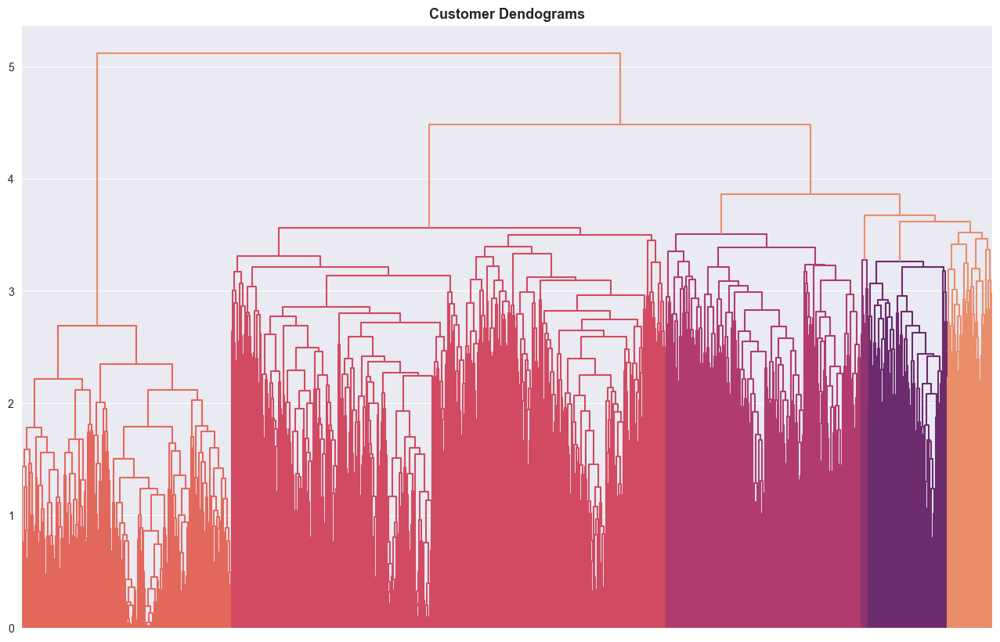

In [110]:
# Create dendogram to find correct number of clusters
sns.set_palette('flare')
import scipy.cluster.hierarchy as shc

plt.figure(figsize = (16, 10))

dend = shc.dendrogram(shc.linkage(pca_red_df, method = 'average'), no_labels = True)
plt.title('Customer Dendograms', fontsize = 13, weight = 'bold')

plt.show()

After plotting dendogram we decide to work with <b>3</b> clusters.

In [119]:
# Aglomaritve cluster analysis
agglo = AgglomerativeClustering(n_clusters = 3, linkage = 'average')
agglo.fit(telco_customer_dummy)

# Save cluster group as a column value in our data_frame
telco_customer_dummy['Cluster'] = agglo.labels_

In [120]:
# Creating temporary DataFrame to counts size of clusters
telco_temp = pd.DataFrame(telco_customer_dummy['Cluster'].value_counts())

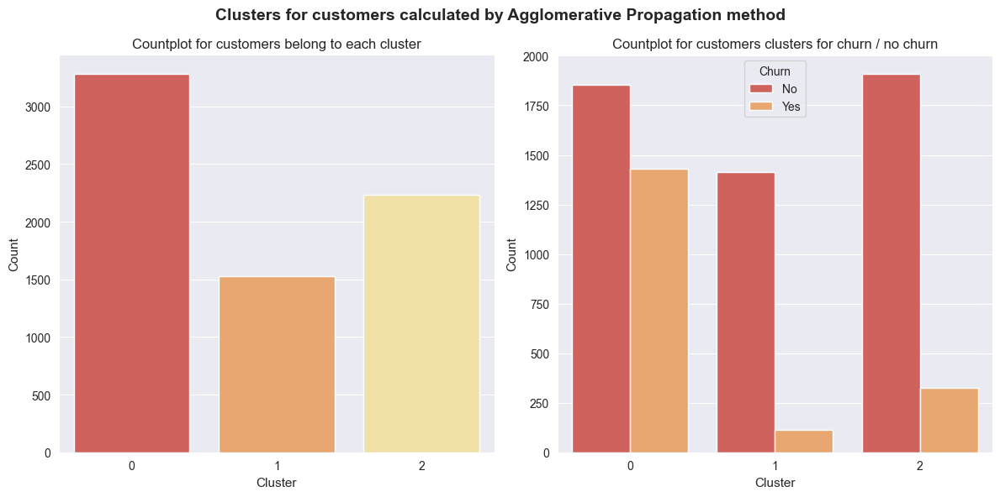

In [122]:
# Subplot for cluster details
sns.set_palette('Spectral')
fig = plt.figure(figsize = (12, 6))

ax1 = fig.add_subplot(121)
sns.barplot(data = telco_temp, x = telco_temp.index, y = 'Cluster', ax = ax1)
ax1.set_xlabel('Cluster', fontsize = 11)
ax1.set_ylabel('Count', fontsize = 11)
ax1.set_title('Countplot for customers belong to each cluster', fontsize = 12)

ax2 = fig.add_subplot(122)
sns.countplot(data = telco_customer_dummy, x = 'Cluster', hue = 'Churn', ax = ax2)
ax2.set_xlabel('Cluster', fontsize = 11)
ax2.set_ylabel('Count', fontsize = 11)
ax2.legend(['No', 'Yes'], title = 'Churn', loc = 'upper center')
ax2.set_title('Countplot for customers clusters for churn / no churn', fontsize = 12)

fig.suptitle('Clusters for customers calculated by Agglomerative Propagation method', fontsize = 14, weight = 'bold')
plt.tight_layout()
plt.show()

In [124]:
telco_customer_dummy.groupby('Cluster')['Churn'].value_counts(normalize = True)

Cluster  Churn
0        0        0.564290
         1        0.435710
1        0        0.925950
         1        0.074050
2        0        0.854139
         1        0.145861
Name: Churn, dtype: float64

We have different number of clusters and different partition. In the previous hierarchical clustering we had a very discrepancy in the number of clients in each cluster. Also we have a cluster, in which there is 43% of churned clients, what is a rarely and little bit suprising thing.

In [125]:
telco_customer_models['Cluster'] = telco_customer_dummy['Cluster']
telco_customer_models.head(1)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,Cluster
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,...,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No,0


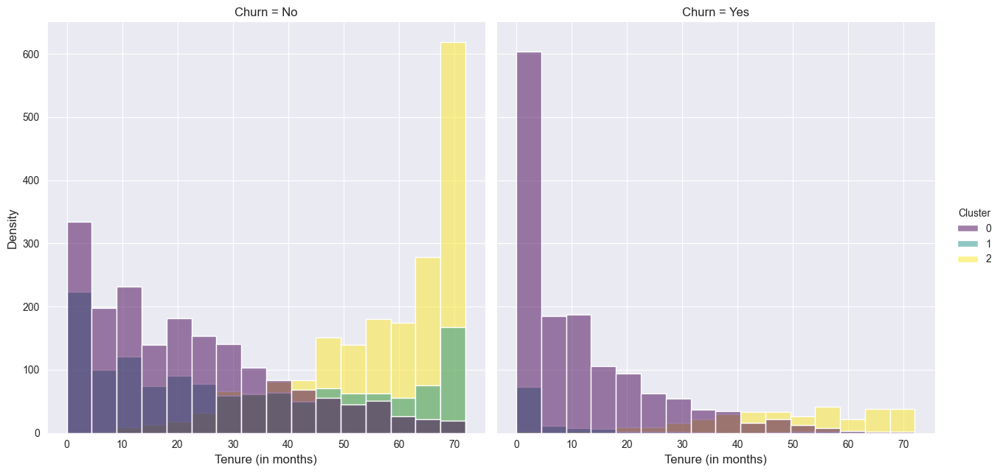

In [126]:
# KDE plots for each Payment Method
d = sns.displot(data = telco_customer_models, x = 'tenure', hue = 'Cluster', 
                col = 'Churn', col_wrap = 2, kind = 'hist', height = 6.5, palette = 'viridis')

d.set_axis_labels('Tenure (in months)', 'Density', fontsize = 12)
d.set_titles('Churn = {col_name}', size = 12)

plt.show()

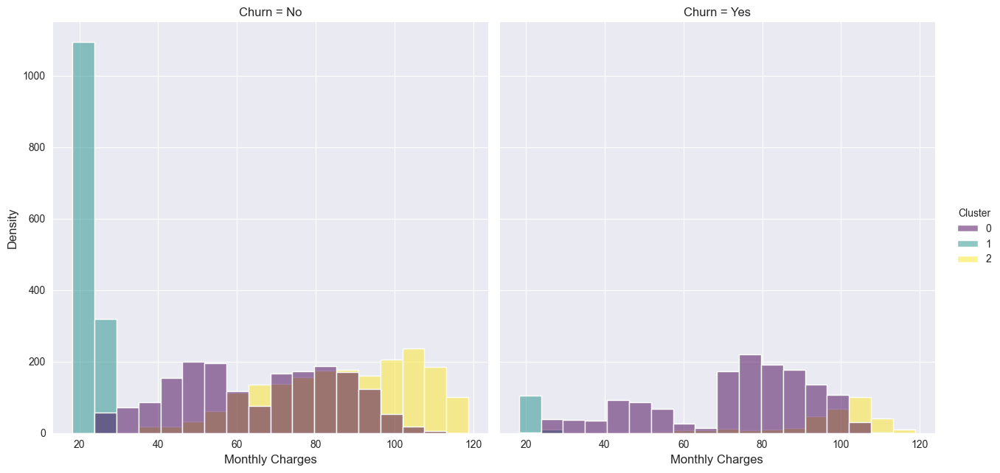

In [127]:
# KDE plots for each Monthly Charges
d = sns.displot(data = telco_customer_models, x = 'MonthlyCharges', hue = 'Cluster', 
                col = 'Churn', col_wrap = 2, kind = 'hist', height = 6.5, palette = 'viridis')

d.set_axis_labels('Monthly Charges', 'Density', fontsize = 12)
d.set_titles('Churn = {col_name}', size = 12)

plt.show()

In [129]:
# Mean of Monthly Charges by cluster
telco_customer_models.groupby(['Cluster', 'Churn'])[['MonthlyCharges', 'tenure']].mean()

MonthlyCharges     tenure
Cluster Churn                           
0       No          65.402943  21.465443
        Yes         73.484441  11.730070
1       No          21.136058  32.331210
        Yes         20.368142   8.238938
2       No          86.953510  57.071241
        Yes         97.381902  48.766871

We see that to the cluster '1' are assigned people with lowest monthly charges - the mean for churned and non-churned clients is about 20,5 months, when for '0' and '1' mean reaches minimum 65 months. In case of tenure, loyal customers'' tenure are mixing between range of all months, when for churned customers '1' is located only at the beginning, and '2' at the end.

For every cluster like in the previous clusterization methods the tenure for churned clients is significantly shorter than for non-churned.

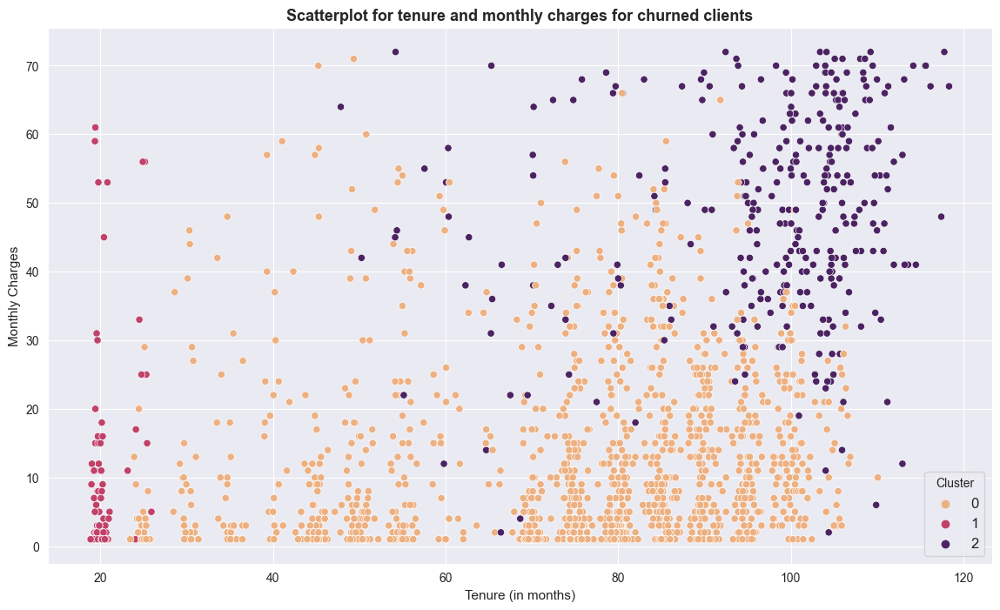

In [131]:
# Tenure vs Monthly Charges graph
sns.set_palette('flare')
plt.figure(figsize = (14, 8))

sns.scatterplot(x = 'MonthlyCharges', y = 'tenure', data = telco_customer_models[telco_customer_models['Churn'] == 'Yes'], 
                hue = 'Cluster', palette = 'flare')

plt.xlabel('Tenure (in months)', fontsize = 11)
plt.ylabel('Monthly Charges', fontsize = 11)
plt.title('Scatterplot for tenure and monthly charges for churned clients', fontsize = 13, weight = 'bold')

plt.legend(title = 'Cluster', loc = 'lower right', fontsize = 12)
plt.show()

As we said before, for clients who decide to leave Telco services the people from cluster '1' are located only on the very left side of the graph with the lowest values of tenure. Cluster '0' is the biggest one and their points are located mainly below 30 of monthly charges, when most of points of '2' are located in the upper right part of the graph with the highest tenure and charges.

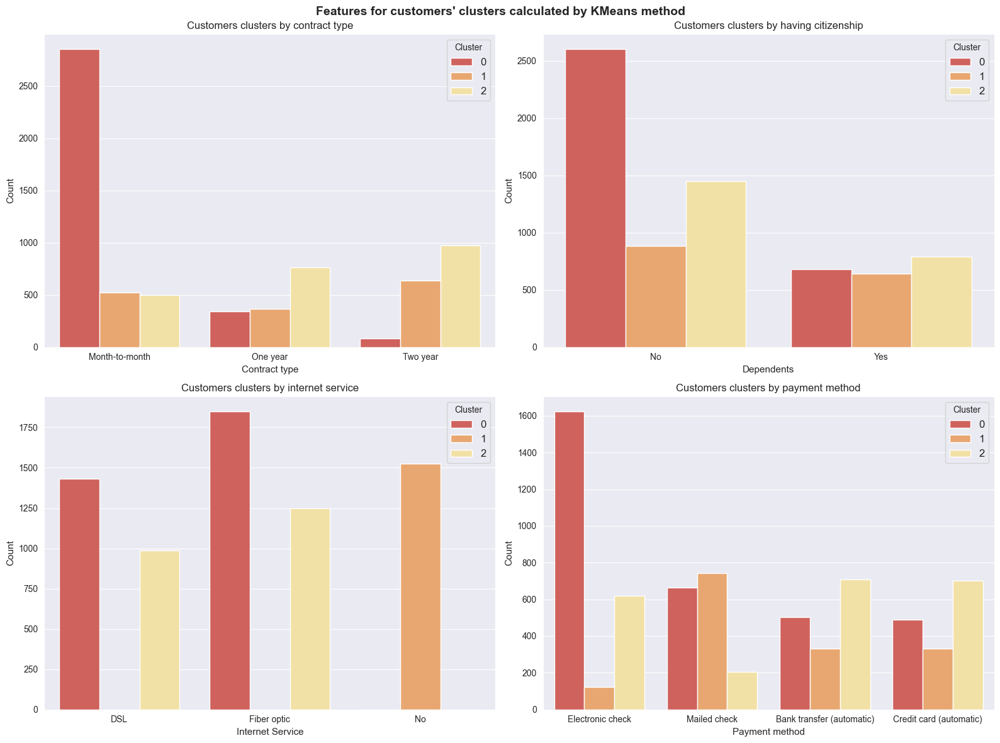

In [132]:
# Subplot for cluster details
sns.set_palette('Spectral')
fig = plt.figure(figsize = (16, 12))

ax1 = fig.add_subplot(221)
sns.countplot(data = telco_customer_models, x = 'Contract', hue = 'Cluster', ax = ax1)
ax1.set_xlabel('Contract type', fontsize = 11)
ax1.set_ylabel('Count', fontsize = 11)
ax1.set_title('Customers clusters by contract type', fontsize = 12)
ax1.legend(title = 'Cluster', fontsize = 12)

ax2 = fig.add_subplot(222)
sns.countplot(data = telco_customer_models, x = 'Dependents', hue = 'Cluster', ax = ax2)
ax2.set_xlabel('Dependents', fontsize = 11)
ax2.set_ylabel('Count', fontsize = 11)
ax2.legend(title = 'Cluster', fontsize = 12)
ax2.set_title('Customers clusters by having citizenship', fontsize = 12)

ax3 = fig.add_subplot(223)
sns.countplot(data = telco_customer_models, x = 'InternetService', hue = 'Cluster', ax = ax3)
ax3.set_xlabel('Internet Service', fontsize = 11)
ax3.set_ylabel('Count', fontsize = 11)
ax3.set_title('Customers clusters by internet service', fontsize = 12)
ax3.legend(title = 'Cluster', fontsize = 12)

ax4 = fig.add_subplot(224)
sns.countplot(data = telco_customer_models, x = 'PaymentMethod', hue = 'Cluster', ax = ax4)
ax4.set_xlabel('Payment method', fontsize = 11)
ax4.set_ylabel('Count', fontsize = 11)
ax4.legend(title = 'Cluster', fontsize = 12)
ax4.set_title('Customers clusters by payment method', fontsize = 12)

fig.suptitle('Features for customers\' clusters calculated by KMeans method', fontsize = 14, weight = 'bold')
plt.tight_layout()
plt.show()

The cluster '1' from 5.2 is very similar to this cluster '1'. Mostly of clients decide to sign two years agreement, there are similar fraction of seniors and younger people. They also do not use Internet services and their most favourable payment method is Mailed Check. Everything agrees in this situation.

People from cluster '0' mostly choose the month-to-month contracts, which is the consequnce what we clearly saw in the histograms of tenure - people who decide to churn has mean of 11 months and they are 43% of all clients assigned to this cluster. Customers from '2' like to sign longer contracts - one-year or two-year.

In '0' and '2' group seniors are not as frequent as in the cluster '1'. They also decide always to use Internet services and most of them decide to use Fibric optic. In case of payment method '0' goes with Electronic check, when '2' goes with also Bank transfer or Credit Card many times.

In [134]:
from sklearn.metrics import rand_score, homogeneity_score, completeness_score
rand = rand_score(telco_customer_dummy['Churn'], agglo.labels_)
homo = homogeneity_score(telco_customer_dummy['Churn'], agglo.labels_)
complete = completeness_score(telco_customer_dummy['Churn'], agglo.labels_)

print('Clustering stats:')
print('--> Rand score        : {0}'.format(rand))
print('--> Homogeneity_score : {0}'.format(homo))
print('--> Completeness score: {0}'.format(complete))

Clustering stats:
--> Rand score        : 0.47800138581504625
--> Homogeneity_score : 0.1217060960267162
--> Completeness score: 0.06697443988587663


However, the rand score is lower than previously using this kind of clustering method (by 0.03), we increased the homogenity socre from 0.05 to 0.12 which is noticeable improvement towards a better classification of data points which are members of a single class.

<h4>b) Fuzzy clustering</h4>

In [160]:
# Affinity Propagation for different K
K = range(2, 6)

# List with distortions of the results of clustering
distortions, avg_ss, avg_ch, avg_db = [], [], [], []

# Loop over K to find the best parameter to the model
for i in range(2, 8):
    # K-Means cluster analysis
    fuzzy = FCM(n_clusters = i, m = 8, random_state = 10)
    fuzzy.fit(pca_red_df.values)

    cluster_labels = fuzzy.predict(pca_red_df.values)
    
    silhouette_avg = silhouette_score(pca_red_df, cluster_labels)
    avg_ss.append(silhouette_avg)
    calinski_harabasz = calinski_harabasz_score(pca_red_df, cluster_labels)
    avg_ch.append(calinski_harabasz)
    davies_bouldin = davies_bouldin_score(pca_red_df, cluster_labels)
    avg_db.append(davies_bouldin)
    
    # Printing a summary for every cluster
    print('\nFor n_clusters = {0}: \n--> average silhouette_score is: {1}'.
          format(i, silhouette_avg) +
         '\n--> average calinski_harabasz_score: {0}'.format(calinski_harabasz) +
         '\n--> average davies_bouldin_score: {0}'.format(davies_bouldin))


For n_clusters = 2: 
--> average silhouette_score is: 0.2122136571823361
--> average calinski_harabasz_score: 2173.0933416937833
--> average davies_bouldin_score: 1.7881473187304553

For n_clusters = 3: 
--> average silhouette_score is: 0.030329167184624476
--> average calinski_harabasz_score: 1100.4297701559124
--> average davies_bouldin_score: 1.9302765708372958

For n_clusters = 4: 
--> average silhouette_score is: 0.038005444754458044
--> average calinski_harabasz_score: 1104.142077434379
--> average davies_bouldin_score: 1.9921921812555672

For n_clusters = 5: 
--> average silhouette_score is: 0.02682172131658566
--> average calinski_harabasz_score: 738.574876943637
--> average davies_bouldin_score: 3.62473086188265

For n_clusters = 6: 
--> average silhouette_score is: 0.04864936184312569
--> average calinski_harabasz_score: 732.6441234681546
--> average davies_bouldin_score: 1.5702913964893892

For n_clusters = 7: 
--> average silhouette_score is: 0.06118417063117743
--> averag

In [161]:
# Creating DtaFrame for quick graphical summary
clusters_df = pd.DataFrame()

clusters_df['Number of clusters'] = range(2, 8)
clusters_df['Silhouette score'] = avg_ss
clusters_df['Calinski-Harabasz score'] = avg_ch
clusters_df['Davies-Bouldin score'] = avg_db

clusters_df

,Number of clusters,Silhouette score,Calinski-Harabasz score,Davies-Bouldin score
0,2,0.212214,2173.093342,1.788147
1,3,0.030329,1100.429770,1.930277
2,4,0.038005,1104.142077,1.992192
3,5,0.026822,738.574877,3.624731
4,6,0.048649,732.644123,1.570291
5,7,0.061184,751.844204,1.821040


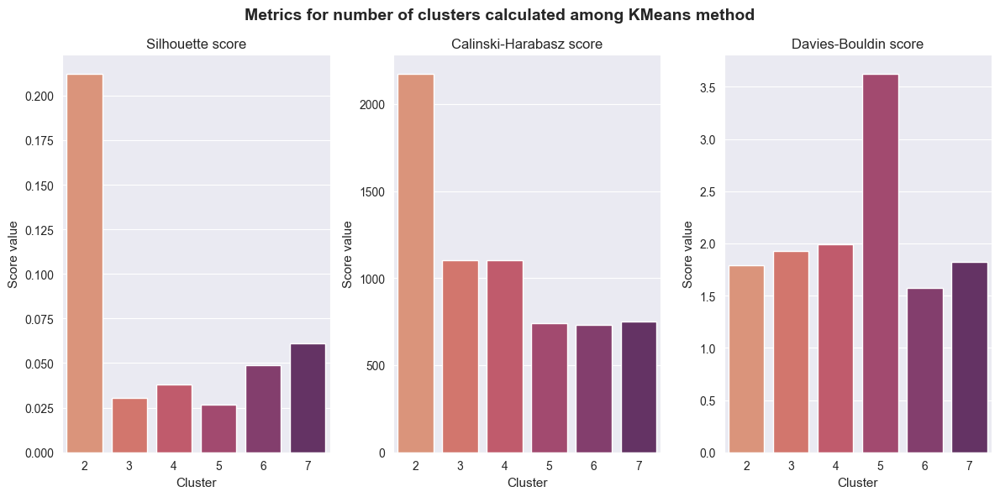

In [162]:
# Subplot for cluster details
sns.set_palette('Spectral')
fig = plt.figure(figsize = (12, 6))

ax1 = fig.add_subplot(131)
sns.barplot(data = clusters_df, x = 'Number of clusters', y = 'Silhouette score', ax = ax1, palette = 'flare')
ax1.set_xlabel('Cluster', fontsize = 11)
ax1.set_ylabel('Score value', fontsize = 11)
ax1.set_title('Silhouette score', fontsize = 12)

ax2 = fig.add_subplot(132)
sns.barplot(data = clusters_df, x = 'Number of clusters', y = 'Calinski-Harabasz score', 
            ax = ax2, palette = 'flare')
ax2.set_xlabel('Cluster', fontsize = 11)
ax2.set_ylabel('Score value', fontsize = 11)
ax2.set_title('Calinski-Harabasz score', fontsize = 12)

ax3 = fig.add_subplot(133)
sns.barplot(data = clusters_df, x = 'Number of clusters', y = 'Davies-Bouldin score', 
            ax = ax3, palette = 'flare')
ax3.set_xlabel('Cluster', fontsize = 11)
ax3.set_ylabel('Score value', fontsize = 11)
ax3.set_title('Davies-Bouldin score', fontsize = 12)

fig.suptitle('Metrics for number of clusters calculated among KMeans method', fontsize = 14, weight = 'bold')
plt.tight_layout()
plt.show()

After reviewing the graphs we decide to use <b>2</b> cluster as the optimal number.

In [187]:
# Aglomaritve cluster analysis
fuzzy = FCM(n_clusters = 2, m = 8, random_state = 10)
fuzzy.fit(pca_red_df.values)

# Save cluster group as a column value in our data_frame
cluster_labels = fuzzy.predict(pca_red_df.values)
telco_customer_dummy['Cluster'] = cluster_labels

In [167]:
# Creating temporary DataFrame to counts size of clusters
telco_temp = pd.DataFrame(telco_customer_dummy['Cluster'].value_counts())

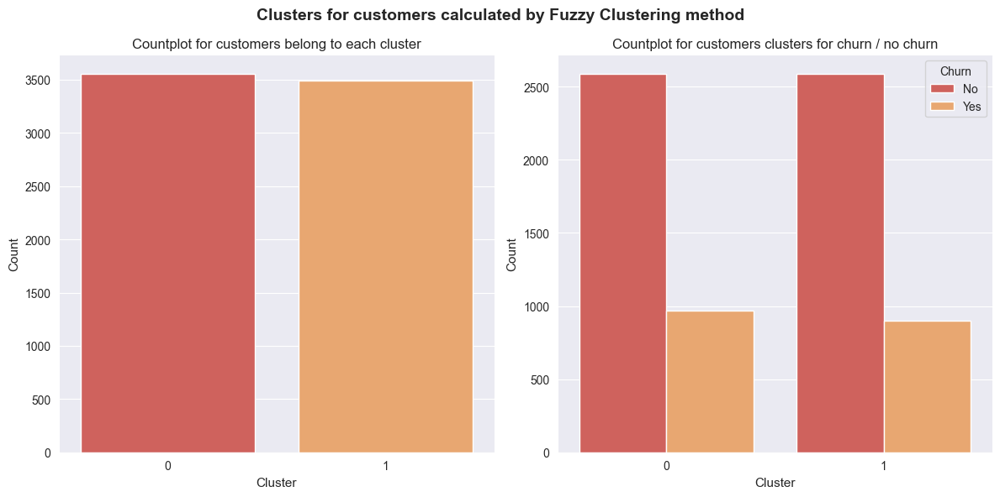

In [184]:
# Subplot for cluster details
sns.set_palette('Spectral')
fig = plt.figure(figsize = (12, 6))

ax1 = fig.add_subplot(121)
sns.barplot(data = telco_temp, x = telco_temp.index, y = 'Cluster', ax = ax1)
ax1.set_xlabel('Cluster', fontsize = 11)
ax1.set_ylabel('Count', fontsize = 11)
ax1.set_title('Countplot for customers belong to each cluster', fontsize = 12)

ax2 = fig.add_subplot(122)
sns.countplot(data = telco_customer_dummy, x = 'Cluster', hue = 'Churn', ax = ax2)
ax2.set_xlabel('Cluster', fontsize = 11)
ax2.set_ylabel('Count', fontsize = 11)
ax2.legend(['No', 'Yes'], title = 'Churn', loc = 'best')
ax2.set_title('Countplot for customers clusters for churn / no churn', fontsize = 12)

fig.suptitle('Clusters for customers calculated by Fuzzy Clustering method', fontsize = 14, weight = 'bold')
plt.tight_layout()
plt.show()

In [169]:
telco_customer_dummy.groupby('Cluster')['Churn'].value_counts(normalize = True)

Cluster  Churn
0        0        0.727989
         1        0.272011
1        0        0.741399
         1        0.258601
Name: Churn, dtype: float64

In comaprison to Hierarchical Clustering, this time the number of cluster is the same as before dimension reduction. This is also the first time when clusterized algorithm ascribes similar number of clients to clusters with similar fraction of churning. The difference is only of 2%, when usually we have cluster with 1/3 - 1/4 of lcients churned and other clusters with a very little fraction of leaving Telco.

In [172]:
telco_customer_models['Cluster'] = telco_customer_dummy['Cluster']
telco_customer_models.head(1)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,Cluster
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,...,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No,0


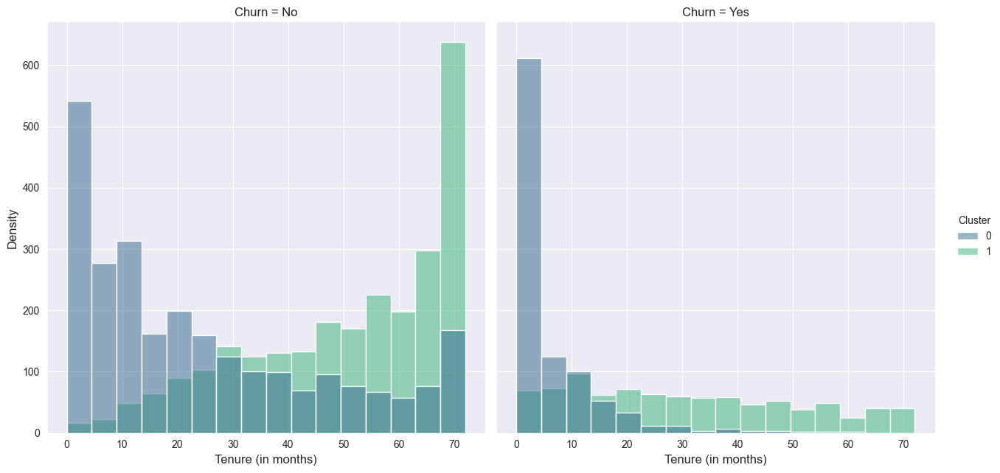

In [173]:
# KDE plots for each Payment Method
d = sns.displot(data = telco_customer_models, x = 'tenure', hue = 'Cluster', 
                col = 'Churn', col_wrap = 2, kind = 'hist', height = 6.5, palette = 'viridis')

d.set_axis_labels('Tenure (in months)', 'Density', fontsize = 12)
d.set_titles('Churn = {col_name}', size = 12)

plt.show()

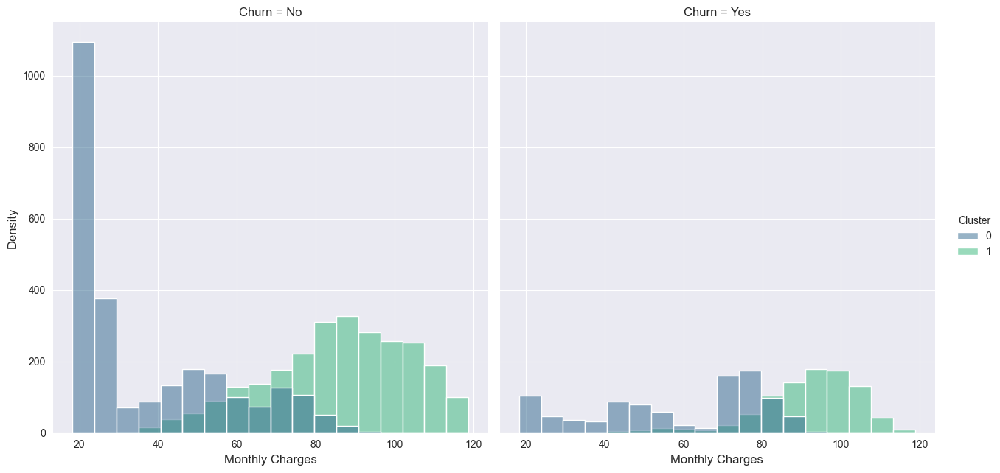

In [174]:
# KDE plots for each Monthly Charges
d = sns.displot(data = telco_customer_models, x = 'MonthlyCharges', hue = 'Cluster', 
                col = 'Churn', col_wrap = 2, kind = 'hist', height = 6.5, palette = 'viridis')

d.set_axis_labels('Monthly Charges', 'Density', fontsize = 12)
d.set_titles('Churn = {col_name}', size = 12)

plt.show()

In [175]:
# Mean of Monthly Charges by cluster
telco_customer_models.groupby(['Cluster', 'Churn'])[['MonthlyCharges', 'tenure']].mean()

MonthlyCharges     tenure
Cluster Churn                           
0       No          36.680004  24.306028
        Yes         58.053464   6.216132
1       No          85.869258  50.844161
        Yes         92.010144  30.589800

We can call this clustering as 'unusal' - the mena of the tenure is the lowest between all the clustering performances. It also rarely situation when Monthly charges (in '0') for churned clients are so higher than for the non-churned clients. It is clearly to see that to the cluster '1' mainly bumpted clients with very high charges - 85 for loyal and 92 for leaving customers, even the range of this metric is for them very width.

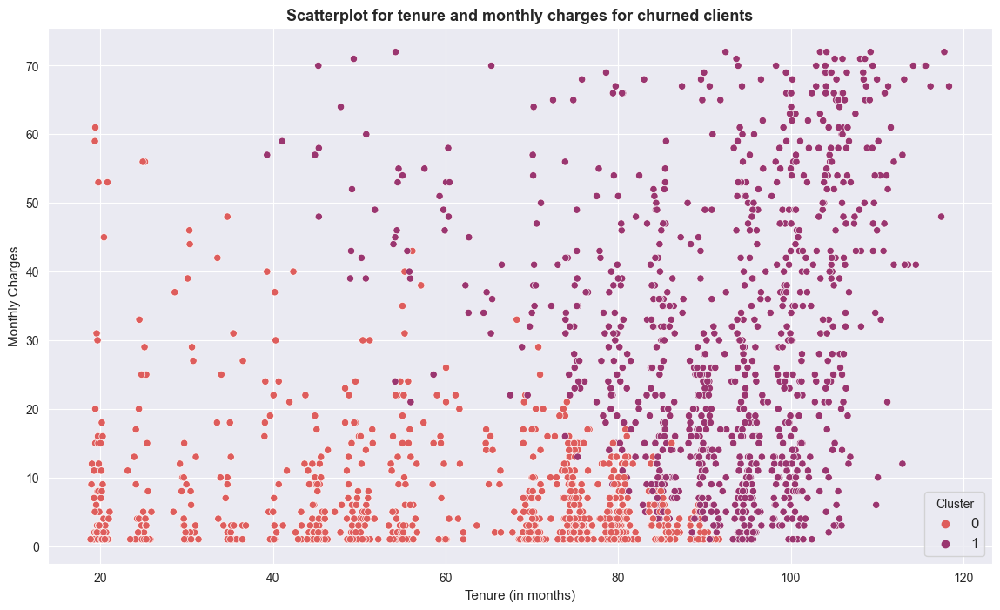

In [176]:
# Tenure vs Monthly Charges graph
sns.set_palette('flare')
plt.figure(figsize = (14, 8))

sns.scatterplot(x = 'MonthlyCharges', y = 'tenure', data = telco_customer_models[telco_customer_models['Churn'] == 'Yes'], 
                hue = 'Cluster', palette = 'flare')

plt.xlabel('Tenure (in months)', fontsize = 11)
plt.ylabel('Monthly Charges', fontsize = 11)
plt.title('Scatterplot for tenure and monthly charges for churned clients', fontsize = 13, weight = 'bold')

plt.legend(title = 'Cluster', loc = 'lower right', fontsize = 12)
plt.show()

We can see that for churned clients from cluster '0' we have frequently lower tenure values, but the range is width (there are values above 80 months). The cluster '1' is located more on the roght side of the graph, but we can observe some points with lower tenure values and high monthly charges.

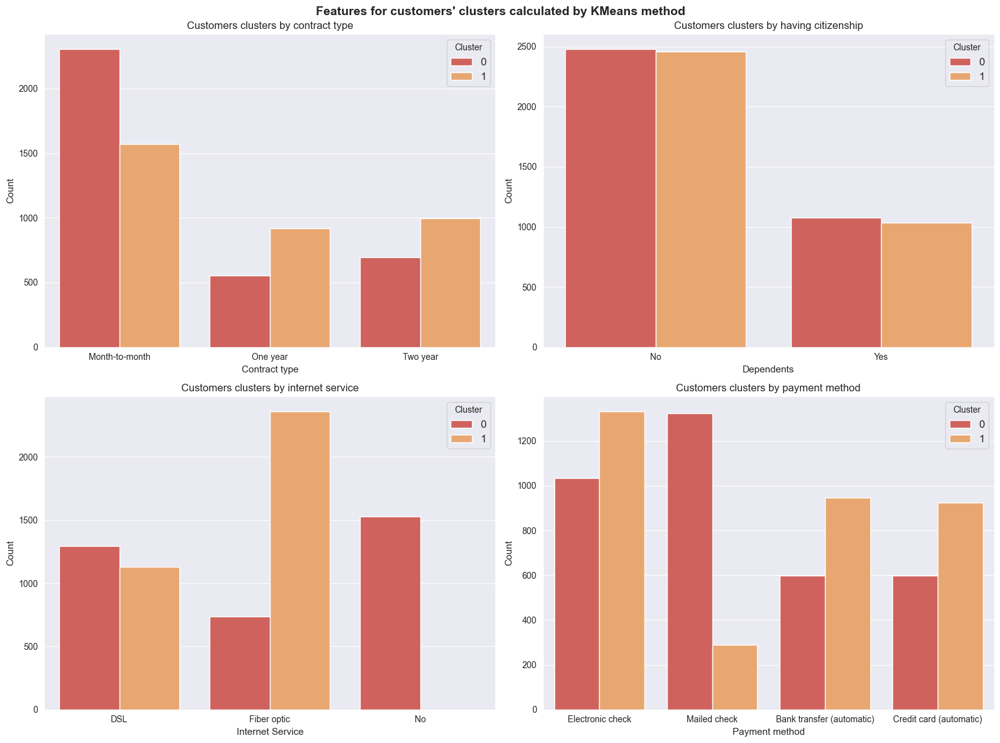

In [177]:
# Subplot for cluster details
sns.set_palette('Spectral')
fig = plt.figure(figsize = (16, 12))

ax1 = fig.add_subplot(221)
sns.countplot(data = telco_customer_models, x = 'Contract', hue = 'Cluster', ax = ax1)
ax1.set_xlabel('Contract type', fontsize = 11)
ax1.set_ylabel('Count', fontsize = 11)
ax1.set_title('Customers clusters by contract type', fontsize = 12)
ax1.legend(title = 'Cluster', fontsize = 12)

ax2 = fig.add_subplot(222)
sns.countplot(data = telco_customer_models, x = 'Dependents', hue = 'Cluster', ax = ax2)
ax2.set_xlabel('Dependents', fontsize = 11)
ax2.set_ylabel('Count', fontsize = 11)
ax2.legend(title = 'Cluster', fontsize = 12)
ax2.set_title('Customers clusters by having citizenship', fontsize = 12)

ax3 = fig.add_subplot(223)
sns.countplot(data = telco_customer_models, x = 'InternetService', hue = 'Cluster', ax = ax3)
ax3.set_xlabel('Internet Service', fontsize = 11)
ax3.set_ylabel('Count', fontsize = 11)
ax3.set_title('Customers clusters by internet service', fontsize = 12)
ax3.legend(title = 'Cluster', fontsize = 12)

ax4 = fig.add_subplot(224)
sns.countplot(data = telco_customer_models, x = 'PaymentMethod', hue = 'Cluster', ax = ax4)
ax4.set_xlabel('Payment method', fontsize = 11)
ax4.set_ylabel('Count', fontsize = 11)
ax4.legend(title = 'Cluster', fontsize = 12)
ax4.set_title('Customers clusters by payment method', fontsize = 12)

fig.suptitle('Features for customers\' clusters calculated by KMeans method', fontsize = 14, weight = 'bold')
plt.tight_layout()
plt.show()

Clients from cluster '0' more times decide to choose month-to-month contracts with a huge difference. For people from cluster '1' there is similar percentage of one and two years contracts. In the case of seniors, the fractions are identical.

When we look at internet services, '1' likes mostly to go with fibric optic, but in comparison to '0' never decides to resign from this kind of services, For group '0' most favourable options with significantly adventage are Electroni check and Mailed check. For group '1' Electronic check is also the most popular option, but many people use also Bank transfer or Credit Card.

In general, we do not see signifinalty differences between clusters, what is not the best signs, becuase we wanted the groups to be different from each other. Meanwhile, the given algorithm created quite similar clusters, which are difficult to distinguish. We will confirm it with statistics, but the results are very medium. Even if in Fuzzy Clustering an observation can belong to more than one cluster (but the algorithm choose the most proferable) it is strange. We predict that homegenity score would be very low. 

In [188]:
from sklearn.metrics import rand_score, homogeneity_score, completeness_score
rand = rand_score(telco_customer_dummy['Churn'], cluster_labels)
homo = homogeneity_score(telco_customer_dummy['Churn'], cluster_labels)
complete = completeness_score(telco_customer_dummy['Churn'], cluster_labels)

print('Clustering stats:')
print('--> Rand score        : {0}'.format(rand))
print('--> Homogeneity_score : {0}'.format(homo))
print('--> Completeness score: {0}'.format(complete))

Clustering stats:
--> Rand score        : 0.49996901010117467
--> Homogeneity_score : 0.00019931129182144684
--> Completeness score: 0.00016638435757362045


Rand score is similar to the first Fuzzy Clustering, but homegenity and completeness score are really bad. It means what we showed above - clusters are very similar to each other, what is not we want to expect. 

<a name = "6.3.2"><h3>6.3.2 FAMD - Factor Analysis of Mixed Data </h3> </a>

In [192]:
# Transform data by PCA into 2D
famd_red = prince.FAMD(n_components = 13, n_iter = 3, copy = True, 
                   check_input = True, engine = 'auto', 
                   random_state = 42)
famd_red_df = pd.DataFrame(famd_red.fit_transform(telco_dim_cat))
#famd_red_df['Churn'] = telco_customer_models['Churn']
famd_red_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-0.855054,-1.128240,-0.785823,1.170661,0.356175,0.529811,-0.555448,-0.472871,0.209642,-0.116069,-0.217084,0.640656,-0.172917
1,-0.179628,-0.152951,-0.599234,0.301051,-0.355053,-0.796921,0.439402,0.484815,0.373365,0.308081,0.477516,-0.206868,0.213763
2,-0.699158,-1.025126,-0.581186,0.080322,-0.357227,-0.580686,0.226804,0.330862,0.171561,-0.250903,-0.598496,0.514677,0.181553
3,-0.107865,0.149292,-0.969631,1.542711,0.410649,-0.480096,0.118283,0.373205,0.183372,0.690307,0.191304,-0.351214,0.290659
4,-0.435178,-1.427391,-0.297083,-0.501025,-0.105907,-0.168105,-0.356285,-0.388819,0.063079,-0.083765,-0.030062,-0.175521,-0.157795


<h4>a) Hierarchical Clustering</h4>

In [200]:
# Agglomerative Clustering for different K
K = range(2, 10)

# List with distortions of the results of clustering
distortions, avg_ss, avg_ch, avg_db = [], [], [], []

# Loop over K to find the best parameter to the model
for i in range(2, 10):
    # K-Means cluster analysis
    agglo = AgglomerativeClustering(n_clusters = i, linkage = 'average')
    #agglo.fit(telco_customer_dummy)

    cluster_labels = agglo.fit_predict(famd_red_df)
    
    silhouette_avg = silhouette_score(famd_red_df, cluster_labels)
    avg_ss.append(silhouette_avg)
    calinski_harabasz = calinski_harabasz_score(famd_red_df, cluster_labels)
    avg_ch.append(calinski_harabasz)
    davies_bouldin = davies_bouldin_score(famd_red_df, cluster_labels)
    avg_db.append(davies_bouldin)
    
    # Printing a summary for every cluster
    print('\nFor n_clusters = {0}: \n--> average silhouette_score is: {1}'.
          format(i, silhouette_avg) +
         '\n--> average calinski_harabasz_score: {0}'.format(calinski_harabasz) +
         '\n--> average davies_bouldin_score: {0}'.format(davies_bouldin))



For n_clusters = 2: 
--> average silhouette_score is: 0.30649722875889923
--> average calinski_harabasz_score: 2661.0111167481127
--> average davies_bouldin_score: 1.1464519031052662

For n_clusters = 3: 
--> average silhouette_score is: 0.2699371020038034
--> average calinski_harabasz_score: 1885.6477617005414
--> average davies_bouldin_score: 1.499850042710234

For n_clusters = 4: 
--> average silhouette_score is: 0.2799758893306612
--> average calinski_harabasz_score: 1848.3084844682764
--> average davies_bouldin_score: 1.5053270188509031

For n_clusters = 5: 
--> average silhouette_score is: 0.2706346269288144
--> average calinski_harabasz_score: 1445.5349388212746
--> average davies_bouldin_score: 1.4813143504806778

For n_clusters = 6: 
--> average silhouette_score is: 0.2971458563957766
--> average calinski_harabasz_score: 1873.6005646748124
--> average davies_bouldin_score: 1.3259114382327573

For n_clusters = 7: 
--> average silhouette_score is: 0.2855206826842993
--> average

In [195]:
# Creating DtaFrame for quick graphical summary
clusters_df = pd.DataFrame()

clusters_df['Number of clusters'] = range(2, 10)
clusters_df['Silhouette score'] = avg_ss
clusters_df['Calinski-Harabasz score'] = avg_ch
clusters_df['Davies-Bouldin score'] = avg_db

clusters_df

,Number of clusters,Silhouette score,Calinski-Harabasz score,Davies-Bouldin score
0,2,0.306497,2661.011117,1.146452
1,3,0.269937,1885.647762,1.499850
2,4,0.279976,1848.308484,1.505327
3,5,0.270635,1445.534939,1.481314
4,6,0.297146,1873.600565,1.325911
5,7,0.285521,1731.689909,1.335931
6,8,0.264414,1521.369408,1.355717
7,9,0.253636,1392.962844,1.383151


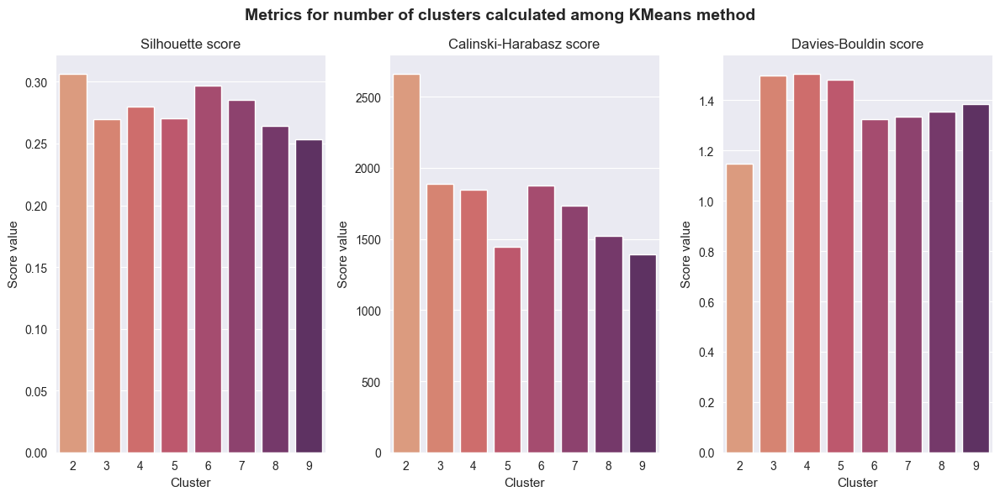

In [196]:
# Subplot for cluster details
sns.set_palette('Spectral')
fig = plt.figure(figsize = (12, 6))

ax1 = fig.add_subplot(131)
sns.barplot(data = clusters_df, x = 'Number of clusters', y = 'Silhouette score', ax = ax1, palette = 'flare')
ax1.set_xlabel('Cluster', fontsize = 11)
ax1.set_ylabel('Score value', fontsize = 11)
ax1.set_title('Silhouette score', fontsize = 12)

ax2 = fig.add_subplot(132)
sns.barplot(data = clusters_df, x = 'Number of clusters', y = 'Calinski-Harabasz score', 
            ax = ax2, palette = 'flare')
ax2.set_xlabel('Cluster', fontsize = 11)
ax2.set_ylabel('Score value', fontsize = 11)
ax2.set_title('Calinski-Harabasz score', fontsize = 12)

ax3 = fig.add_subplot(133)
sns.barplot(data = clusters_df, x = 'Number of clusters', y = 'Davies-Bouldin score', 
            ax = ax3, palette = 'flare')
ax3.set_xlabel('Cluster', fontsize = 11)
ax3.set_ylabel('Score value', fontsize = 11)
ax3.set_title('Davies-Bouldin score', fontsize = 12)

fig.suptitle('Metrics for number of clusters calculated among KMeans method', fontsize = 14, weight = 'bold')
plt.tight_layout()
plt.show()

We should probably work with <b>2</b> clusters, but we also look at at dendogram to see if our expectacions are right.

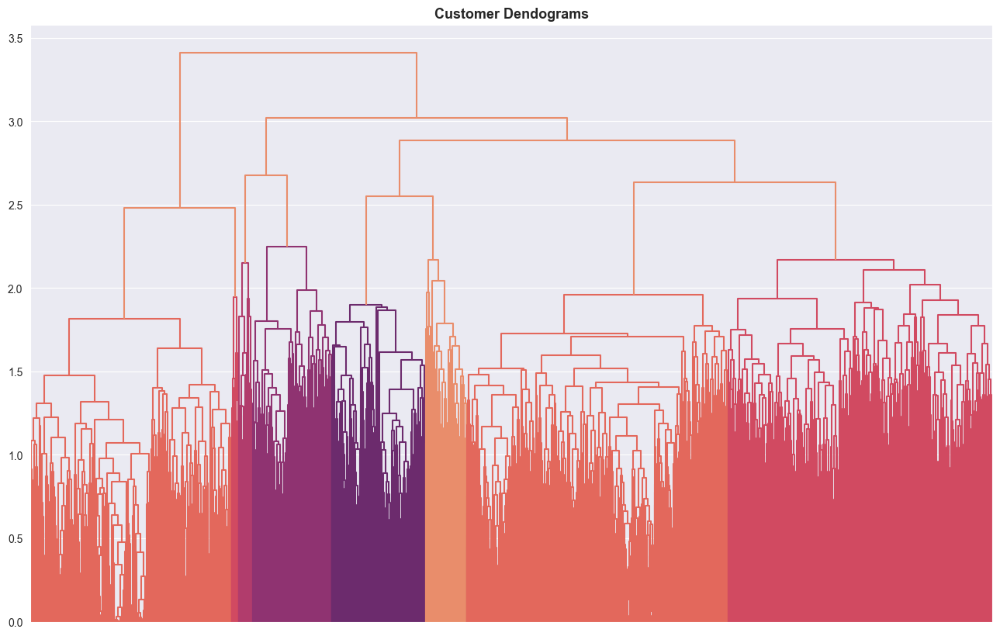

In [212]:
# Create dendogram to find correct number of clusters
sns.set_palette('flare')
import scipy.cluster.hierarchy as shc

plt.figure(figsize = (16, 10))

dend = shc.dendrogram(shc.linkage(famd_red_df, method = 'average'), no_labels = True)
plt.title('Customer Dendograms', fontsize = 13, weight = 'bold')

plt.show()

Despite the initial guesses to work with <b>2</b> clusters, analyzing the previous results and the dendogram, we decided to work with <b>4</b>. This is two times more than we got in the subsection 5.2.

In [215]:
# Aglomaritve cluster analysis
agglo = AgglomerativeClustering(n_clusters = 4, linkage = 'average')
agglo.fit(famd_red_df)

# Save cluster group as a column value in our data_frame
telco_customer_dummy['Cluster'] = agglo.labels_

In [217]:
# Creating temporary DataFrame to counts size of clusters
telco_temp = pd.DataFrame(telco_customer_dummy['Cluster'].value_counts())

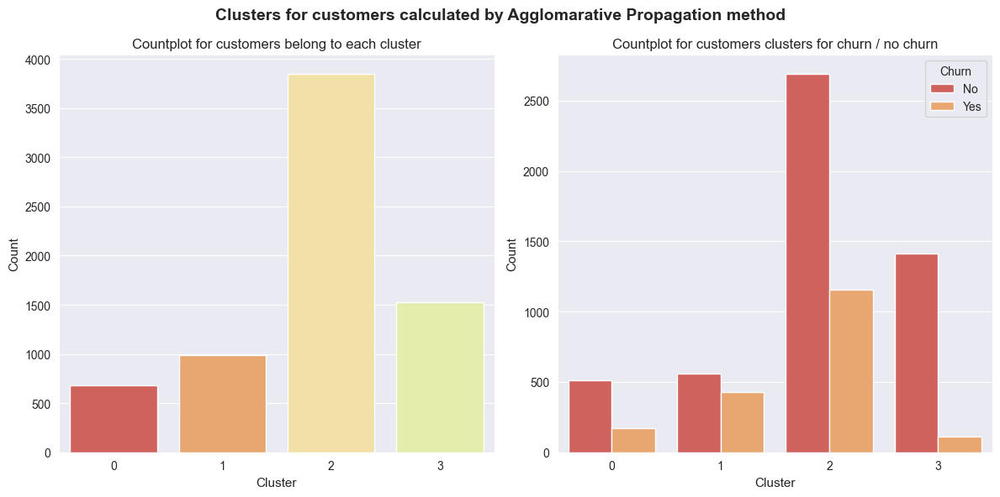

In [218]:
# Subplot for cluster details
sns.set_palette('Spectral')
fig = plt.figure(figsize = (12, 6))

ax1 = fig.add_subplot(121)
sns.barplot(data = telco_temp, x = telco_temp.index, y = 'Cluster', ax = ax1)
ax1.set_xlabel('Cluster', fontsize = 11)
ax1.set_ylabel('Count', fontsize = 11)
ax1.set_title('Countplot for customers belong to each cluster', fontsize = 12)

ax2 = fig.add_subplot(122)
sns.countplot(data = telco_customer_dummy, x = 'Cluster', hue = 'Churn', ax = ax2)
ax2.set_xlabel('Cluster', fontsize = 11)
ax2.set_ylabel('Count', fontsize = 11)
ax2.legend(['No', 'Yes'], title = 'Churn', loc = 'best')
ax2.set_title('Countplot for customers clusters for churn / no churn', fontsize = 12)

fig.suptitle('Clusters for customers calculated by Agglomarative Propagation method', fontsize = 14, weight = 'bold')
plt.tight_layout()
plt.show()

In [219]:
telco_customer_dummy.groupby('Cluster')['Churn'].value_counts(normalize = True)

Cluster  Churn
0        0        0.750733
         1        0.249267
1        0        0.566937
         1        0.433063
2        0        0.698883
         1        0.301117
3        0        0.925950
         1        0.074050
Name: Churn, dtype: float64

This is the first time when we work with 4 groups instead of 3 or 2. However, another time we got a one cluster, to which are assigned the most clients and significantly smaller others. What is intyguing, the biggest cluster does not have the highest churn ratio, because the most clients who decide to leave Telco (in percentage) was assigned to cluster '1' - 43% of them leaves. Also only for one cluster ('3') this ratio is below 10% - '0' an '1' have properly 25% and 30%. That is the difference between this case and others shown before.

In [221]:
telco_customer_models['Cluster'] = telco_customer_dummy['Cluster']
telco_customer_models.head(1)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,Cluster
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,...,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No,0


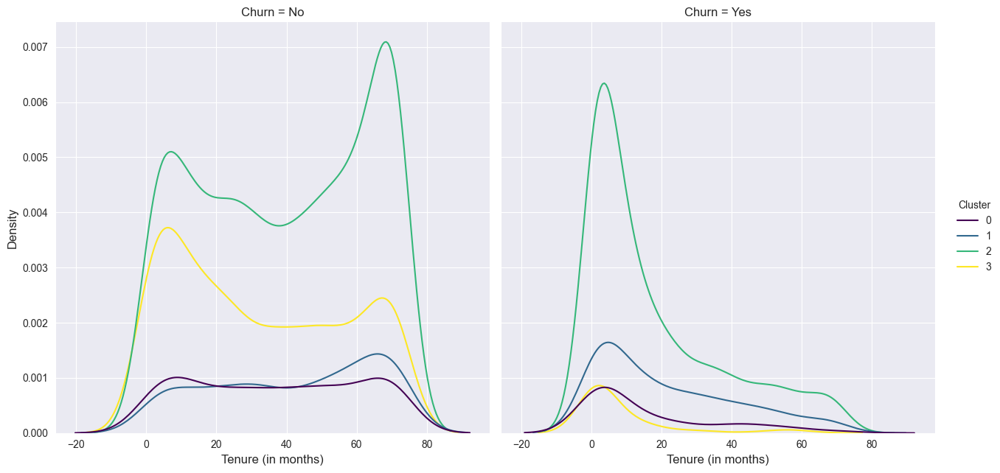

In [225]:
# KDE plots for each Payment Method
d = sns.displot(data = telco_customer_models, x = 'tenure', hue = 'Cluster', 
                col = 'Churn', col_wrap = 2, kind = 'kde', height = 6.5, palette = 'viridis')

d.set_axis_labels('Tenure (in months)', 'Density', fontsize = 12)
d.set_titles('Churn = {col_name}', size = 12)

plt.show()

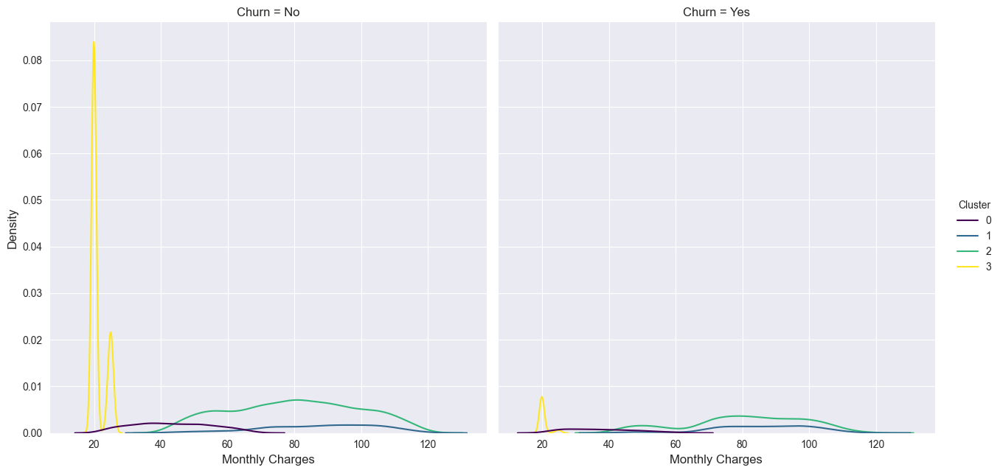

In [226]:
# KDE plots for each Monthly Charges
d = sns.displot(data = telco_customer_models, x = 'MonthlyCharges', hue = 'Cluster', 
                col = 'Churn', col_wrap = 2, kind = 'kde', height = 6.5, palette = 'viridis')

d.set_axis_labels('Monthly Charges', 'Density', fontsize = 12)
d.set_titles('Churn = {col_name}', size = 12)

plt.show()

In [224]:
# Mean of Monthly Charges by cluster
telco_customer_models.groupby(['Cluster', 'Churn'])[['MonthlyCharges', 'tenure']].mean()

MonthlyCharges     tenure
Cluster Churn                           
0       No          43.520996  37.017578
        Yes         37.533824  15.835294
1       No          87.711717  41.924866
        Yes         85.954918  21.538642
2       No          80.225613  39.521933
        Yes         80.885030  17.931838
3       No          21.136058  32.331210
        Yes         20.368142   8.238938

Because of the fact, that we are working with 4 clusters, we decide to switch from histogram to kde plots to better see differences between groups. In case of tenure, we clearly see that loyal clients has stayed longer than churned ones - the discrepancy in the means is huge and equal to properly 22 months, 21 months, 22 months and 24 months, so very similar to each other. The pick of the kde lines are more or less in similar values. If we consider monthly charges they are high for clusters '1' and '2', medium for cluster '0' and small for cluster '3'. Only in '0' the differences between churned and non-churned clients is visible. It is worth to mention that clusters '1' and '2' are really similar in both condidered metrics.

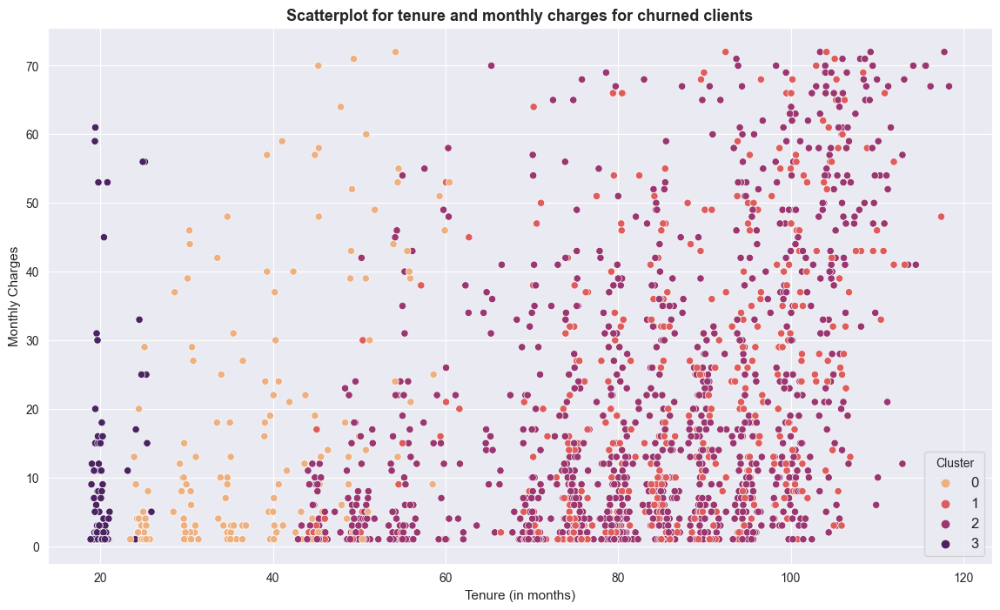

In [227]:
# Tenure vs Monthly Charges graph
sns.set_palette('flare')
plt.figure(figsize = (14, 8))

sns.scatterplot(x = 'MonthlyCharges', y = 'tenure', data = telco_customer_models[telco_customer_models['Churn'] == 'Yes'], 
                hue = 'Cluster', palette = 'flare')

plt.xlabel('Tenure (in months)', fontsize = 11)
plt.ylabel('Monthly Charges', fontsize = 11)
plt.title('Scatterplot for tenure and monthly charges for churned clients', fontsize = 13, weight = 'bold')

plt.legend(title = 'Cluster', loc = 'lower right', fontsize = 12)
plt.show()

Another time we can see churned clients from one cluster located in left side of the scatterplot. On the right side of them (cluster '3') is placed churned group from '0', when we have a higher values of tenure. Points from '1' and '2' are mixed together in the right side of the graph, what confirms our cocnlusions from kde plots.

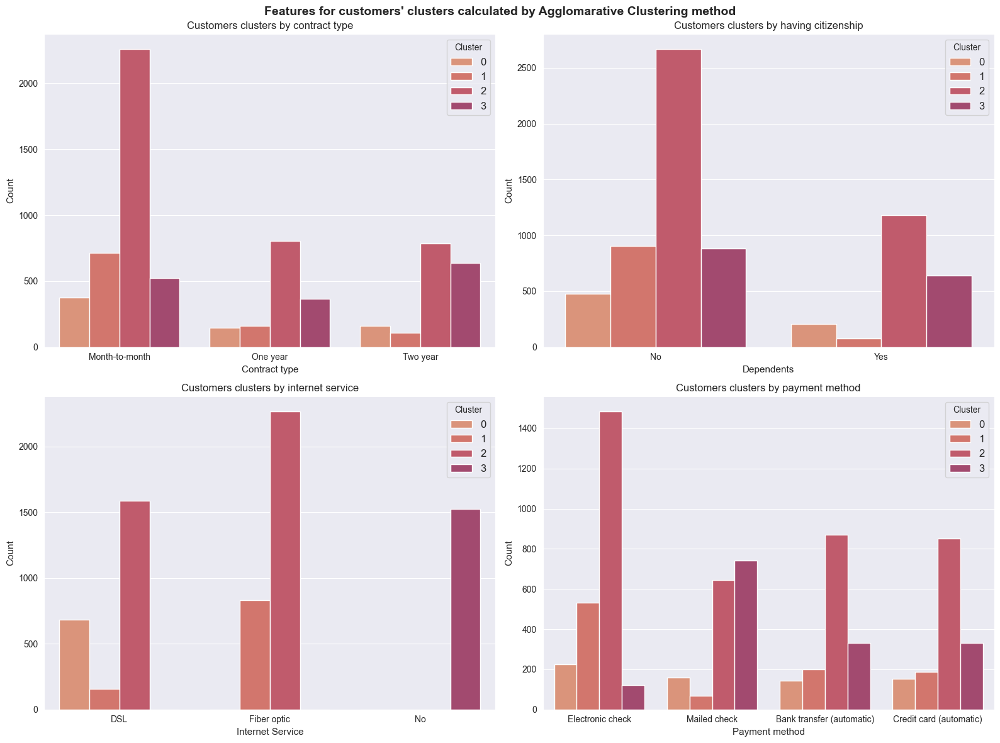

In [232]:
# Subplot for cluster details
sns.set_palette('flare')
fig = plt.figure(figsize = (16, 12))

ax1 = fig.add_subplot(221)
sns.countplot(data = telco_customer_models, x = 'Contract', hue = 'Cluster', ax = ax1)
ax1.set_xlabel('Contract type', fontsize = 11)
ax1.set_ylabel('Count', fontsize = 11)
ax1.set_title('Customers clusters by contract type', fontsize = 12)
ax1.legend(title = 'Cluster', fontsize = 12)

ax2 = fig.add_subplot(222)
sns.countplot(data = telco_customer_models, x = 'Dependents', hue = 'Cluster', ax = ax2)
ax2.set_xlabel('Dependents', fontsize = 11)
ax2.set_ylabel('Count', fontsize = 11)
ax2.legend(title = 'Cluster', fontsize = 12)
ax2.set_title('Customers clusters by having citizenship', fontsize = 12)

ax3 = fig.add_subplot(223)
sns.countplot(data = telco_customer_models, x = 'InternetService', hue = 'Cluster', ax = ax3)
ax3.set_xlabel('Internet Service', fontsize = 11)
ax3.set_ylabel('Count', fontsize = 11)
ax3.set_title('Customers clusters by internet service', fontsize = 12)
ax3.legend(title = 'Cluster', fontsize = 12)

ax4 = fig.add_subplot(224)
sns.countplot(data = telco_customer_models, x = 'PaymentMethod', hue = 'Cluster', ax = ax4)
ax4.set_xlabel('Payment method', fontsize = 11)
ax4.set_ylabel('Count', fontsize = 11)
ax4.legend(title = 'Cluster', fontsize = 12)
ax4.set_title('Customers clusters by payment method', fontsize = 12)

fig.suptitle('Features for customers\' clusters calculated by Agglomarative Clustering method', fontsize = 14, weight = 'bold')
plt.tight_layout()
plt.show()

In terms of length of the contract every clusters have part of clients which signs every type of contracts. Customers from '2' more likely decide to go with month-to-month agreements with clear advantage in regard to one year and two years options. Month-to-month is alos most popular option among clusters '0' and '1', but for cluster '3' two year contracts. In case of fraction of clients the most seniors are in cluster '3', cluster '0' and '2' have a 1/4, where in group '1' the participation of seniors are really low.

In case of Internet services, all people from group '3' resign from this kind of services and whole group '0' decide only to DSL. In cluster '1' and '2' more favourable option is Fibric optic, but there are also users of DSL. If we look at payment methods, there are nearly identical number of clients who use Bank transfer and Credit card, but there are not the most poular options. For cluster '0' this is Electronic check as for '2' and '1'. People from '3' frequently opt for Mailed check.

Cluster '2' is very similar to cluster '0' from subsection 5.2, which means that despite performing Factor Analysis, some results are the same as before dimension reduction.

In [233]:
#rand_score, homogeneity_score, completeness_score
rand = rand_score(telco_customer_dummy['Churn'], agglo.labels_)
homo = homogeneity_score(telco_customer_dummy['Churn'], agglo.labels_)
complete = completeness_score(telco_customer_dummy['Churn'], agglo.labels_)

print('Clustering stats:')
print('--> Rand score        : {0}'.format(rand))
print('--> Homogeneity_score : {0}'.format(homo))
print('--> Completeness score: {0}'.format(complete))

Clustering stats:
--> Rand score        : 0.4738554736770751
--> Homogeneity_score : 0.06376114074533487
--> Completeness score: 0.03172388435691209


When we compare these numbers to the section 5.2, the rand score and completness score are decresing (both about 0.03), but the homogeneity score are increasing (about 0.01). So we can assume that we have now more points which are members of a single class - the decrease of completeness we coulc obtain as we have two times more clusters.

<h4>b) Fuzzy Clustering</h4>

In [234]:
# Affinity Propagation for different K
K = range(2, 6)

# List with distortions of the results of clustering
distortions, avg_ss, avg_ch, avg_db = [], [], [], []

# Loop over K to find the best parameter to the model
for i in range(2, 8):
    # K-Means cluster analysis
    fuzzy = FCM(n_clusters = i, m = 8, random_state = 10)
    fuzzy.fit(famd_red_df.values)

    cluster_labels = fuzzy.predict(famd_red_df.values)
    
    silhouette_avg = silhouette_score(famd_red_df, cluster_labels)
    avg_ss.append(silhouette_avg)
    calinski_harabasz = calinski_harabasz_score(famd_red_df, cluster_labels)
    avg_ch.append(calinski_harabasz)
    davies_bouldin = davies_bouldin_score(famd_red_df, cluster_labels)
    avg_db.append(davies_bouldin)
    
    # Printing a summary for every cluster
    print('\nFor n_clusters = {0}: \n--> average silhouette_score is: {1}'.
          format(i, silhouette_avg) +
         '\n--> average calinski_harabasz_score: {0}'.format(calinski_harabasz) +
         '\n--> average davies_bouldin_score: {0}'.format(davies_bouldin))


For n_clusters = 2: 
--> average silhouette_score is: 0.21152726401863947
--> average calinski_harabasz_score: 2146.28420109623
--> average davies_bouldin_score: 1.7802790188130273

For n_clusters = 3: 
--> average silhouette_score is: 0.0004673367072385459
--> average calinski_harabasz_score: 1075.5299034341272
--> average davies_bouldin_score: 1.8506170179649093

For n_clusters = 4: 
--> average silhouette_score is: 0.05677423782204019
--> average calinski_harabasz_score: 1078.8969244242603
--> average davies_bouldin_score: 1.9788909395058891

For n_clusters = 5: 
--> average silhouette_score is: 0.02323838399437105
--> average calinski_harabasz_score: 718.9650561254422
--> average davies_bouldin_score: 2.7162423469617836

For n_clusters = 6: 
--> average silhouette_score is: 0.10501589832333344
--> average calinski_harabasz_score: 1074.3271350053203
--> average davies_bouldin_score: 1.4616952935179892

For n_clusters = 7: 
--> average silhouette_score is: 0.13149167727597627
--> av

In [235]:
# Creating DtaFrame for quick graphical summary
clusters_df = pd.DataFrame()

clusters_df['Number of clusters'] = range(2, 8)
clusters_df['Silhouette score'] = avg_ss
clusters_df['Calinski-Harabasz score'] = avg_ch
clusters_df['Davies-Bouldin score'] = avg_db

clusters_df

,Number of clusters,Silhouette score,Calinski-Harabasz score,Davies-Bouldin score
0,2,0.211527,2146.284201,1.780279
1,3,0.000467,1075.529903,1.850617
2,4,0.056774,1078.896924,1.978891
3,5,0.023238,718.965056,2.716242
4,6,0.105016,1074.327135,1.461695
5,7,0.131492,1132.289152,1.720304


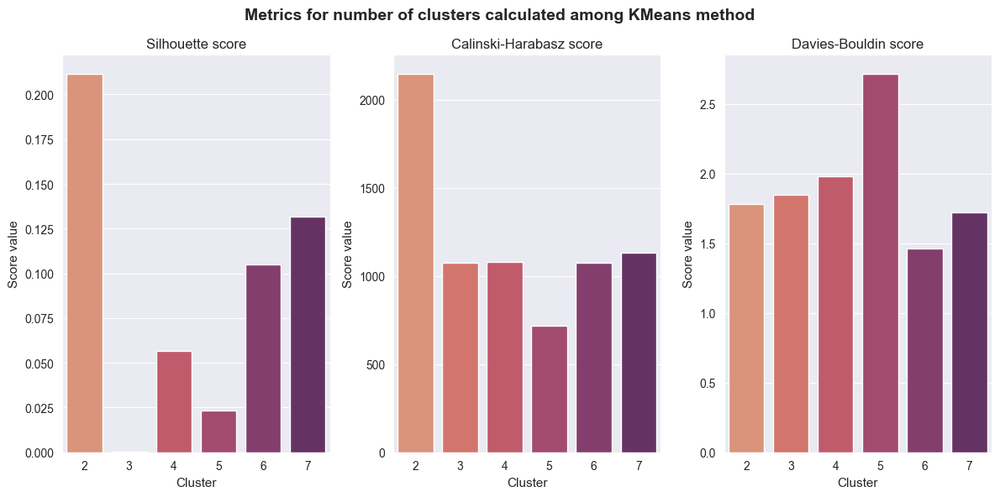

In [236]:
# Subplot for cluster details
sns.set_palette('Spectral')
fig = plt.figure(figsize = (12, 6))

ax1 = fig.add_subplot(131)
sns.barplot(data = clusters_df, x = 'Number of clusters', y = 'Silhouette score', ax = ax1, palette = 'flare')
ax1.set_xlabel('Cluster', fontsize = 11)
ax1.set_ylabel('Score value', fontsize = 11)
ax1.set_title('Silhouette score', fontsize = 12)

ax2 = fig.add_subplot(132)
sns.barplot(data = clusters_df, x = 'Number of clusters', y = 'Calinski-Harabasz score', 
            ax = ax2, palette = 'flare')
ax2.set_xlabel('Cluster', fontsize = 11)
ax2.set_ylabel('Score value', fontsize = 11)
ax2.set_title('Calinski-Harabasz score', fontsize = 12)

ax3 = fig.add_subplot(133)
sns.barplot(data = clusters_df, x = 'Number of clusters', y = 'Davies-Bouldin score', 
            ax = ax3, palette = 'flare')
ax3.set_xlabel('Cluster', fontsize = 11)
ax3.set_ylabel('Score value', fontsize = 11)
ax3.set_title('Davies-Bouldin score', fontsize = 12)

fig.suptitle('Metrics for number of clusters calculated among KMeans method', fontsize = 14, weight = 'bold')
plt.tight_layout()
plt.show()

From the graphs we could see that number of cluster equal to <b>2</b> should be our optimum, so the same as in cluster analsysis in PCA subsection.

In [237]:
# Aglomaritve cluster analysis
fuzzy = FCM(n_clusters = 2, m = 8, random_state = 10)
fuzzy.fit(famd_red_df.values)

# Save cluster group as a column value in our data_frame
cluster_labels = fuzzy.predict(famd_red_df.values)
telco_customer_dummy['Cluster'] = cluster_labels

In [238]:
# Creating temporary DataFrame to counts size of clusters
telco_temp = pd.DataFrame(telco_customer_dummy['Cluster'].value_counts())

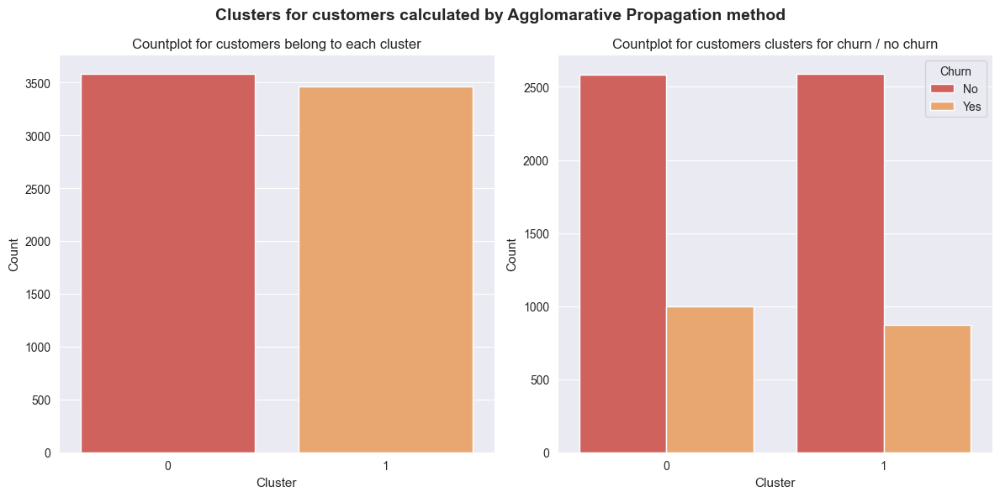

In [239]:
# Subplot for cluster details
sns.set_palette('Spectral')
fig = plt.figure(figsize = (12, 6))

ax1 = fig.add_subplot(121)
sns.barplot(data = telco_temp, x = telco_temp.index, y = 'Cluster', ax = ax1)
ax1.set_xlabel('Cluster', fontsize = 11)
ax1.set_ylabel('Count', fontsize = 11)
ax1.set_title('Countplot for customers belong to each cluster', fontsize = 12)

ax2 = fig.add_subplot(122)
sns.countplot(data = telco_customer_dummy, x = 'Cluster', hue = 'Churn', ax = ax2)
ax2.set_xlabel('Cluster', fontsize = 11)
ax2.set_ylabel('Count', fontsize = 11)
ax2.legend(['No', 'Yes'], title = 'Churn', loc = 'best')
ax2.set_title('Countplot for customers clusters for churn / no churn', fontsize = 12)

fig.suptitle('Clusters for customers calculated by Agglomarative Propagation method', fontsize = 14, weight = 'bold')
plt.tight_layout()
plt.show()

In [240]:
telco_customer_dummy.groupby('Cluster')['Churn'].value_counts(normalize = True)

Cluster  Churn
0        0        0.721865
         1        0.278135
1        0        0.747834
         1        0.252166
Name: Churn, dtype: float64

The numbers for Fuzzy Clustering now and in PCA section are really similar. Another time number of clients assigned to both are similar and the fraction of churned customers in nearly equal to 27,8% and 25,2% compared to 27,2% and 25,8% previously, so we can assume that the difference is about 45 people (from nearly 7380 customers).

In [241]:
telco_customer_models['Cluster'] = telco_customer_dummy['Cluster']
telco_customer_models.head(1)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,Cluster
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,...,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No,0


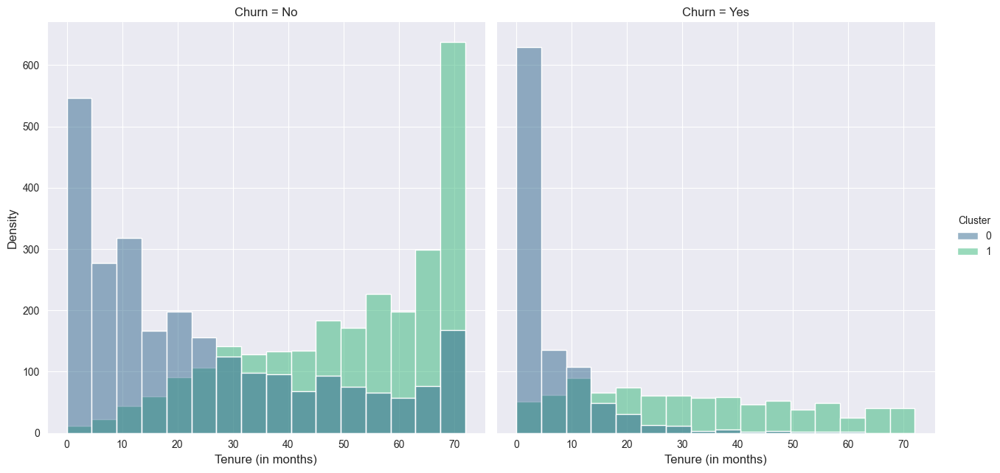

In [246]:
# KDE plots for each Payment Method
d = sns.displot(data = telco_customer_models, x = 'tenure', hue = 'Cluster', 
                col = 'Churn', col_wrap = 2, kind = 'hist', height = 6.5, palette = 'viridis')

d.set_axis_labels('Tenure (in months)', 'Density', fontsize = 12)
d.set_titles('Churn = {col_name}', size = 12)

plt.show()

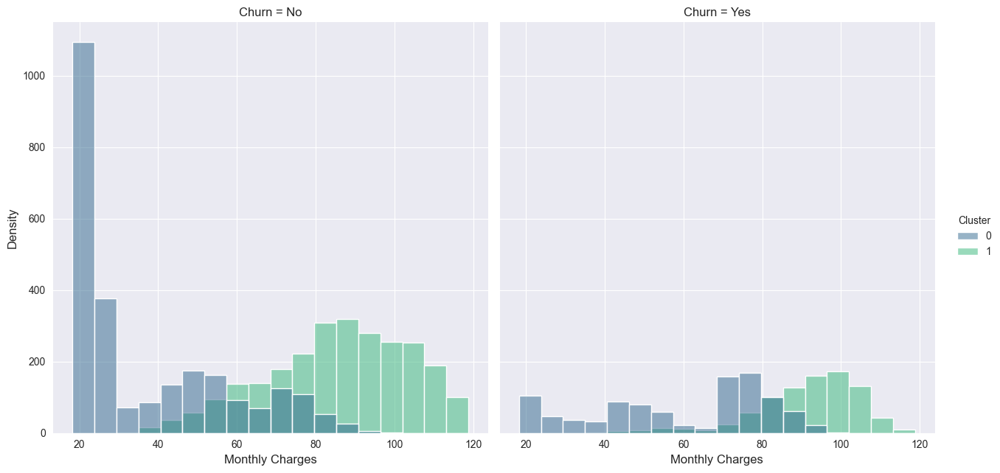

In [247]:
# KDE plots for each Monthly Charges
d = sns.displot(data = telco_customer_models, x = 'MonthlyCharges', hue = 'Cluster', 
                col = 'Churn', col_wrap = 2, kind = 'hist', height = 6.5, palette = 'viridis')

d.set_axis_labels('Monthly Charges', 'Density', fontsize = 12)
d.set_titles('Churn = {col_name}', size = 12)

plt.show()

In [244]:
# Mean of Monthly Charges by cluster
telco_customer_models.groupby(['Cluster', 'Churn'])[['MonthlyCharges', 'tenure']].mean()

MonthlyCharges     tenure
Cluster Churn                           
0       No          36.811354  24.125338
        Yes         59.141064   6.042169
1       No          85.681112  50.993820
        Yes         91.897308  31.597938

As before, the differences among values for clusters and churned and non-churned clients and histograms are really small. Now the monthly charges for cluster '0' for option no was 36.81 and for yes 59.14, before that were 36.68 and 58.05. If we compare tenure for cluster '1' now is 50.99 and 31.59, before were 50.84 and 30.58. All the mean values are really similar and the heights of bins in histograms are the same. 

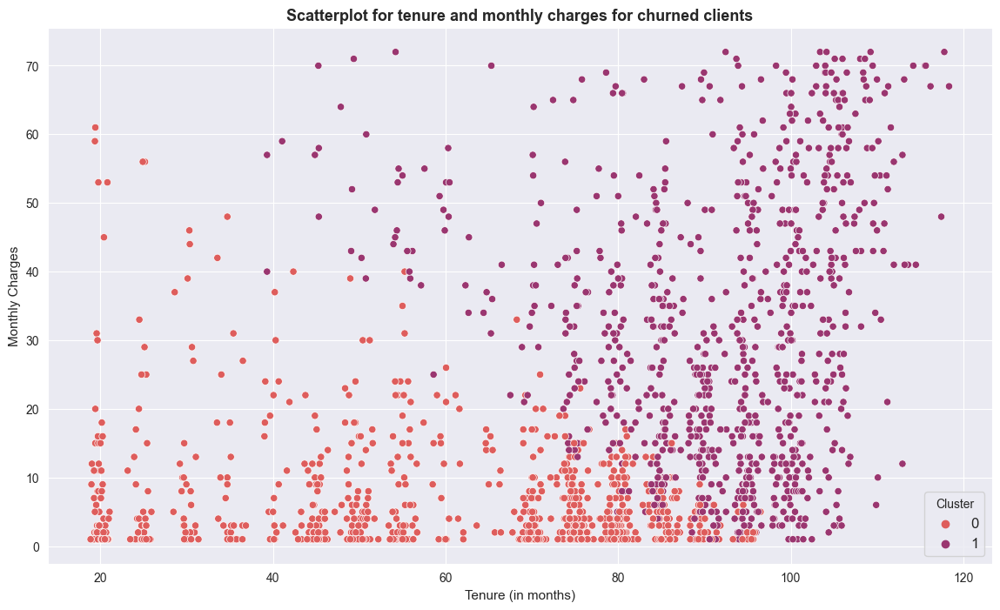

In [248]:
# Tenure vs Monthly Charges graph
sns.set_palette('flare')
plt.figure(figsize = (14, 8))

sns.scatterplot(x = 'MonthlyCharges', y = 'tenure', data = telco_customer_models[telco_customer_models['Churn'] == 'Yes'], 
                hue = 'Cluster', palette = 'flare')

plt.xlabel('Tenure (in months)', fontsize = 11)
plt.ylabel('Monthly Charges', fontsize = 11)
plt.title('Scatterplot for tenure and monthly charges for churned clients', fontsize = 13, weight = 'bold')

plt.legend(title = 'Cluster', loc = 'lower right', fontsize = 12)
plt.show()

Scatterplot are almost identical, even clusters are the same colour. It is a little difference - if we compare these two plots some points which were assigned before to cluster '0', now are assigned to cluster '1'. It concerns only a few points on the imagineted diagonal from point (20 - tenure, 70- monthly charges) to (100, 0), but it is not suprising if we remeber that this is fuzzy clustering. 

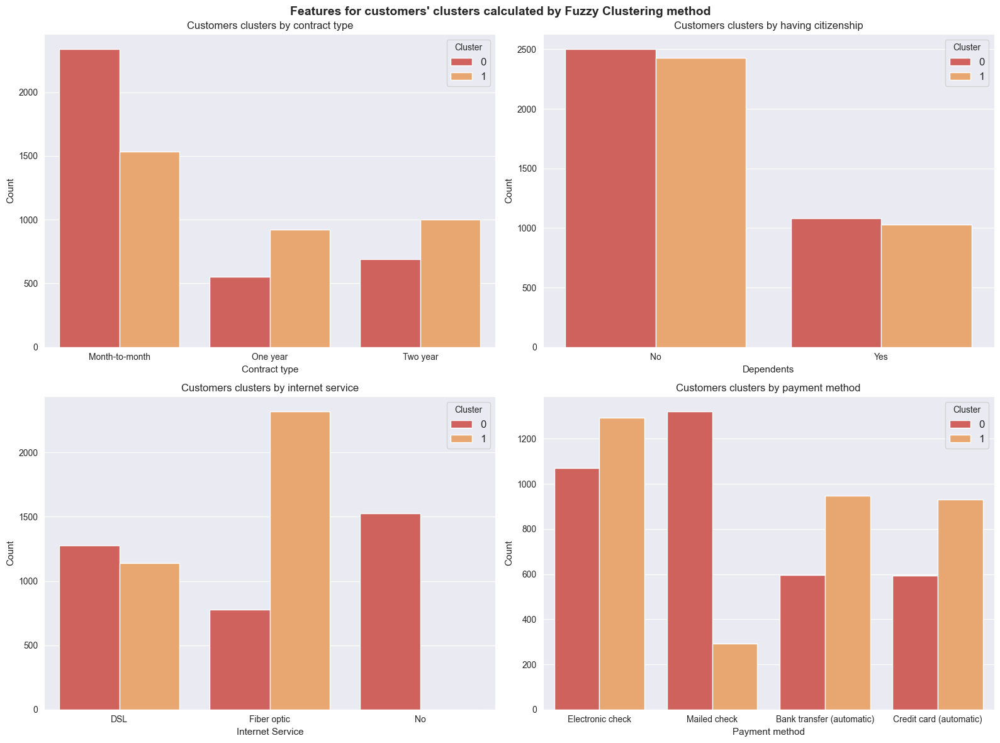

In [250]:
# Subplot for cluster details
sns.set_palette('Spectral')
fig = plt.figure(figsize = (16, 12))

ax1 = fig.add_subplot(221)
sns.countplot(data = telco_customer_models, x = 'Contract', hue = 'Cluster', ax = ax1)
ax1.set_xlabel('Contract type', fontsize = 11)
ax1.set_ylabel('Count', fontsize = 11)
ax1.set_title('Customers clusters by contract type', fontsize = 12)
ax1.legend(title = 'Cluster', fontsize = 12)

ax2 = fig.add_subplot(222)
sns.countplot(data = telco_customer_models, x = 'Dependents', hue = 'Cluster', ax = ax2)
ax2.set_xlabel('Dependents', fontsize = 11)
ax2.set_ylabel('Count', fontsize = 11)
ax2.legend(title = 'Cluster', fontsize = 12)
ax2.set_title('Customers clusters by having citizenship', fontsize = 12)

ax3 = fig.add_subplot(223)
sns.countplot(data = telco_customer_models, x = 'InternetService', hue = 'Cluster', ax = ax3)
ax3.set_xlabel('Internet Service', fontsize = 11)
ax3.set_ylabel('Count', fontsize = 11)
ax3.set_title('Customers clusters by internet service', fontsize = 12)
ax3.legend(title = 'Cluster', fontsize = 12)

ax4 = fig.add_subplot(224)
sns.countplot(data = telco_customer_models, x = 'PaymentMethod', hue = 'Cluster', ax = ax4)
ax4.set_xlabel('Payment method', fontsize = 11)
ax4.set_ylabel('Count', fontsize = 11)
ax4.legend(title = 'Cluster', fontsize = 12)
ax4.set_title('Customers clusters by payment method', fontsize = 12)

fig.suptitle('Features for customers\' clusters calculated by Fuzzy Clustering method', fontsize = 14, weight = 'bold')
plt.tight_layout()
plt.show()

As we said before, in our Fuzzy Clustering after dimension reduction works in the same way as without dimension reduction - it is no difference if we use PCA or FAMD. Maybe it can be visible some  
disproportions if we use other methods, but not in our case.

In [253]:
#rand_score, homogeneity_score, completeness_score
rand = rand_score(telco_customer_dummy['Churn'], cluster_labels)
homo = homogeneity_score(telco_customer_dummy['Churn'], cluster_labels)
complete = completeness_score(telco_customer_dummy['Churn'], cluster_labels)

print('Clustering stats:')
print('--> Rand score        : {0}'.format(rand))
print('--> Homogeneity_score : {0}'.format(homo))
print('--> Completeness score: {0}'.format(complete))

Clustering stats:
--> Rand score        : 0.5000915986404447
--> Homogeneity_score : 0.0007475822126360258
--> Completeness score: 0.000624166773822445


There are a little improvments in the stats, but they are almost non-visible. As before, homogenity score usually will be low, because in Fuzzy Clustering we assume that some points can be assigned to more than one cluster. 

<b>Main conclusions from dimension reduction with clustering analysis:</b>

<li><u>Hierarchical clustering performs better after dimension reduction</u> - although the number of completness and homogineity are still low, there are visible increasing and for the first time we have worked with 4 clusters after FAMD, but still clusters are created mainly on the bases of monthly charges and tenure;</li>
$\newline$

<li><u>Fuzzy Clustering gives the same results regardless of dimension reduction method</u> - after performing PCA and FAMD only a few clients were assigned to other cluesters, but it is worth to mention that if we compare results before and after dimension reduction, we have now 2 clusters (to 3 before) and the fraction of churned clients in these cluster are very similar, when previously we have cluster with significantly bigger part of customers which leaves Telco and more loyal ones.</li>

<a name = "7."><h2>7. Summary  </h2> </a>

As part of the project related to data from a telecommunications company, we conducted an in-depth analysis of their clients, their habits and the most frequently requested packages or types of signed contracts. Next, we tried to match an appropriate model that tries to predict whether a given customer will decide to leave or stay in the company, and using clustering to find groups of customers similar to each other in several characteristics, separating the more loyal and those leaving. Finally, we performed dimensionality reduction on our dataset to see if these techniques could be effectively used in classification and clustering algorithms.

In this part of the project, we focused on the last two points - clasterization and dimensionality reduction. We performed clustering using 4 methods, using <b>K-Means</b>, <b>Hierarchical Clustering</b> (Agglomarative case), <b>K-Medoids</b> (which is designed to work with a mix of numeric and categorical data) and <b>Fuzzy Clustering</b>.

We tried many solutions - not all of them were finally included in the subsections, but for almost all of the mentioned methods we achieved better results when instead of our table with 40 columns, we worked on a distance matrix calculated using gower distance. We had higher scores when dividing the data, but we also had higher homogeneity and completeness scores.

There were usually <b>2</b> or <b>3</b> clusters and they were mainly focused on the values of <b>Monthly Charges</b> and <b>Tenure</b>, although features such as <b>Internet Services</b>, <b>Payment Methods</b> and type of <b>Contract </b>were also important. Typically, one cluster was larger than the others, also had a higher churn rate and a high month-to-month signing rate.

We then performed dimensionality reduction using the <b>PCA</b>, <b>Truncated SVD</b> and <b>FAMD</b> methods (which is also designed to work with categorical data). In all cases, to account for 90% of the variance, which was our main criterion, we needed to take at least <b>13 dimensions</b> (usually <b>15</b>), which was a significant reduction for the first two methods (based on OneHot and Label encoders, we had almost 40 columns to start with), and in the case of FAMD a reduction from 20. In each case, when we then plotted the first two coordinates, a group of points was created that were distant from the rest and mainly contained loyal customers. When we used a matrix with distances to reduce dimensions, this reduction came down to 5 dimensions.

Next, we compared the results of classification and clustering after the aforementioned dimensionality reduction. Only here we noticed the difference between the use of PCA or Truncated SVD and the FAMD method designed to work with a mixture of data types. Practically for each classification method considered (and we considered 4 here), the data after reduction with <b>FAMD turned out to be slightly better than the others</b>. The model with the <b>Bagging method based on Decision Tree Classifier</b> performed best.

However, overall, for each reduction method, we saw a <b>slight improvement</b> over the results before using these methods. It is also worth emphasizing that there was a change in our approach when it comes to data classification, and this could also lower the rating of our models and artificially increase those shown in the first part of the report.

Finally, we compared clustering before and after dimensionality reduction for PCA and FAMD. We used them in conjunction with Hierarchical Clustering and Fuzzy Clustering - we saw little differences between the use of the appropriate dimensionality reduction method in the case of <b>Agglomarative Propagation</b> - different <b>number of clusters</b> (we worked with 4 for the first time) and a slightly different <b>division of Tenure and Monthly Charges</b>. On the other hand, in the second case, the clusters came out almost identical, but very different from what came out in section 5.4.

In general, the project, which took us a lot of time, helped us discover interesting methods of classification, clustering and dimensionality reduction in Python. We learned how to work with data focusing on the direct characteristics of customers, how to process it and how to build models to recognize the behavior of such customers. We think it was a very fruitful experience.

<a name = "8."><h2>8. Bibliography  </h2> </a>

During the process of realizing of this project, we based mainly on the following sources of Data Mining concepts and algorithms:
<ul>
    <li><a href="http://prac.im.pwr.edu.pl/~zagdan/polish_ver/DM2022/index.html">Data Mining lectures</a> by Adam Zagdański,</li>
    <li><a href="https://scikit-learn.org/stable/user_guide.html">Scikit-learn library</a></li>
    <li><i> Uczenie maszynowe z użyciem Scikit-Learn i TensorFlow</i> by Aurelien Geron,</li>
    <li><i> Machine learning, Python i Data Science. Wprowadzenie</i> by Andreas Muller and Sarah Guido.</li>
</ul>